In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pickle
import glob
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML
%matplotlib inline

# Camera Calibrations

[]

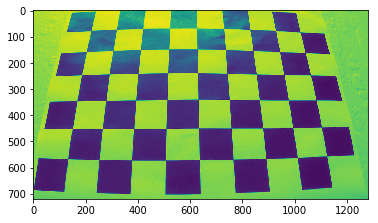

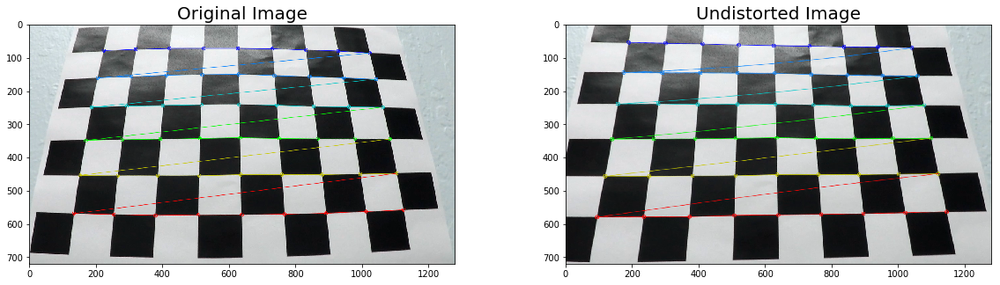

In [2]:
# call cv2 undistor
#def undistort(image, matrix, dis):
#    return cv2.undistort(image, matrix, dis, None, matrix)

nx = 9 # different than the course lecture
ny = 6
objpoints = []
imgpoints = []
# prepare object points, like (0,0,0), (1,0,0), ... 
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

img = cv2.imread('camera_cal/calibration3.jpg') # pick one
plt.imshow(img)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray)

#Finding chessboard corners (for an nx x ny board):
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
# assume ret == True
imgpoints.append(corners)
objpoints.append(objp)
# Drawing detected corners on an image:
cv2.drawChessboardCorners(img, (nx, ny), corners, ret)

# Camera calibration, given object points, image points, and the shape of the grayscale image:
ret, matrix, dist, rvecs, tvecs = \
            cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
# where dist is distortion coefficent
# matrix, camera matrix to transform 3D to 2D image points

# Undistorting a test image:
undistorted = cv2.undistort(img, matrix, dist, None, matrix)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,5))                             
ax1.set_title('Original Image', fontsize=20)
ax2.set_title('Undistorted Image', fontsize=20)
ax1.imshow(img)
ax2.imshow(undistorted)
plt.plot()

mkdir: cannot create directory ‘undistorted_folder’: File exists


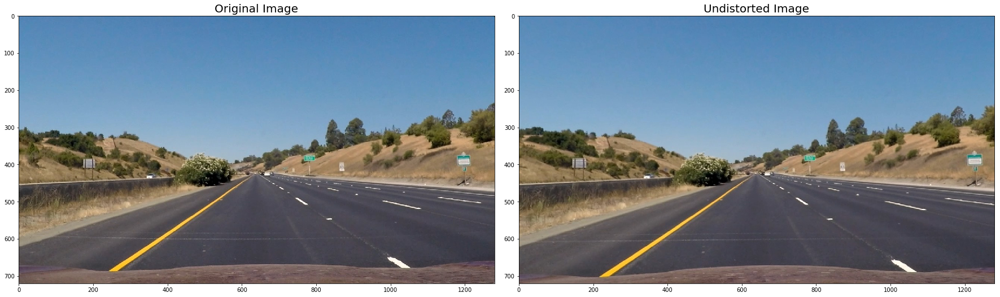

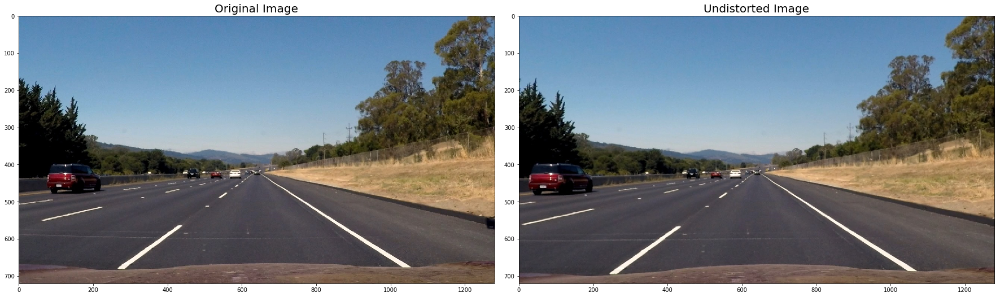

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


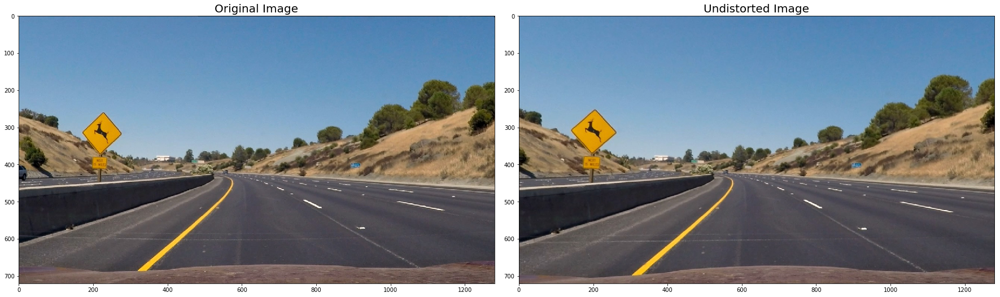

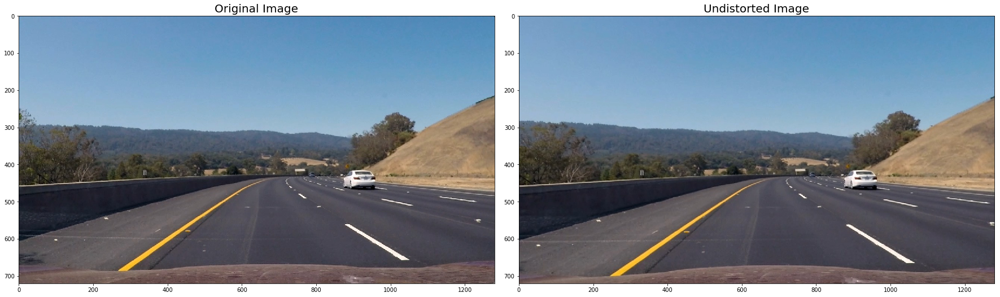

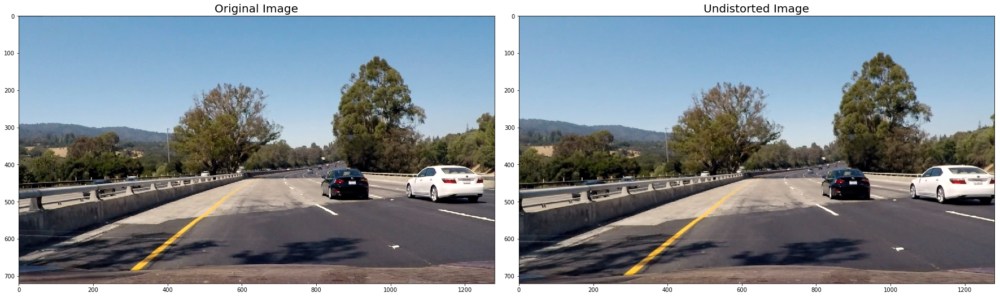

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


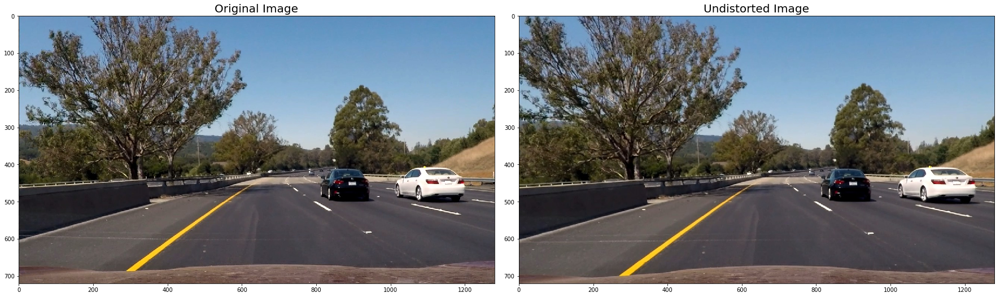

In [3]:
# mkdir system call
%mkdir undistorted_folder 

def save(dire, fname, img):
    #print(fname)
    fname = ''.join([dire,'undistorted_',fname])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    cv2.imwrite(fname,img)

images = ['straight_lines1.jpg', 'straight_lines2.jpg',
          'test1.jpg', 'test2.jpg','test3.jpg', 'test4.jpg', 'test5.jpg', 'test6.jpg']

for fname in images:
    img = cv2.imread('test_images/'+fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undistorted = cv2.undistort(img, matrix, dist, None, matrix) #undistort(img, matrix, dist)          
    save('undistorted_folder/', fname, undistorted)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        

In [72]:
# Code taken from Udacity lecture

# Sobel Absolute Threshold 
def abs_sobel_thresh(img, direction='x', 
                     sobel_kernel=3, thresh=(0, 255)):    
    img  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    scaled_sobel = None
    # Sobel x
    if direction == 'x':
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        abs_sobelx = np.absolute(sobelx) 
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))  
    # Sobel y
    else:
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel) 
        abs_sobely = np.absolute(sobely) 
        scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))
        
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1    
    return sxbinary

In [73]:
# Sobel Magnitude Threshold 
def mag_thresh(img, sobel_kernel=3, 
               mag_thresh=(0, 255)):
    img =  cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    magnitude = np.sqrt(np.square(sobelx)+np.square(sobely))
    abs_magnitude = np.absolute(magnitude)
    scaled_magnitude = np.uint8(255*abs_magnitude/np.max(abs_magnitude))
    mag_binary = np.zeros_like(scaled_magnitude)
    mag_binary[(scaled_magnitude >= mag_thresh[0]) & (scaled_magnitude <= mag_thresh[1])] = 1    
    return mag_binary

In [74]:
# Sobel Direction Threshold
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    arctan = np.arctan2(abs_sobely, abs_sobelx)
    dir_binary = np.zeros_like(arctan)
    dir_binary[(arctan >= thresh[0]) & (arctan <= thresh[1])] = 1    
    return dir_binary

In [130]:
def select_yellow(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    lower = np.array([20,60,60])
    upper = np.array([38,174, 250])
    mask = cv2.inRange(hsv, lower, upper)
    return mask

def select_white(image):
    lower = np.array([202,202,202])
    upper = np.array([255,255,255])
    mask = cv2.inRange(image, lower, upper)

    return mask

def comb_thresh(image):
    yellow = select_yellow(image)
    white = select_white(image)
    combined_binary = np.zeros_like(yellow)
    combined_binary[(yellow >= 1) | (white >= 1)] = 1
    return combined_binary

def gaussian_blur(img, kernel=5):    
    blur = cv2.GaussianBlur(img,(kernel,kernel),0)
    return blur

def combined_sobel_gradient_thres(img, disp=False, s_thresh_min=150, s_thresh_max=255):    
    ksize = 5#3     # Sobel kernel size
    gradx = abs_sobel_thresh(img, direction='x', sobel_kernel=ksize, thresh=(20, 120))
    grady = abs_sobel_thresh(img, direction='y', sobel_kernel=ksize, thresh=(20, 120))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(80, 200))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(np.pi/4, np.pi/2))    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1))|((mag_binary == 1) & (dir_binary == 1))] = 1    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]    
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1    
    combined_binary = np.zeros_like(combined)    
    #combined_binary[(s_binary == 1) | (combined == 1)] = 1  
    white_yellow = comb_thresh(img)
    #combined_binary[(s_binary == 1) | (white_yellow == 1)] = 1  
    combined_binary[(white_yellow == 1)] = 1  
    fs = 30 # font size
    if disp == True:
        f, (ax1, ax2) = plt.subplots(2, 2, figsize=(40,20))
        ax1[0].set_title('Original Image', fontsize=20)
        ax1[0].imshow(img)
        ax1[1].set_title('Combined gradx, grady, mag, dir', fontsize=fs)
        ax1[1].imshow(combined, cmap='gray')
        ax2[0].set_title('Color Thresholding', fontsize=fs)
        ax2[0].imshow(s_binary, cmap='gray')
        ax2[1].set_title('Combined S Binary', fontsize=fs)
        ax2[1].imshow(combined_binary, cmap='gray')        
    return combined_binary, img, combined, s_binary

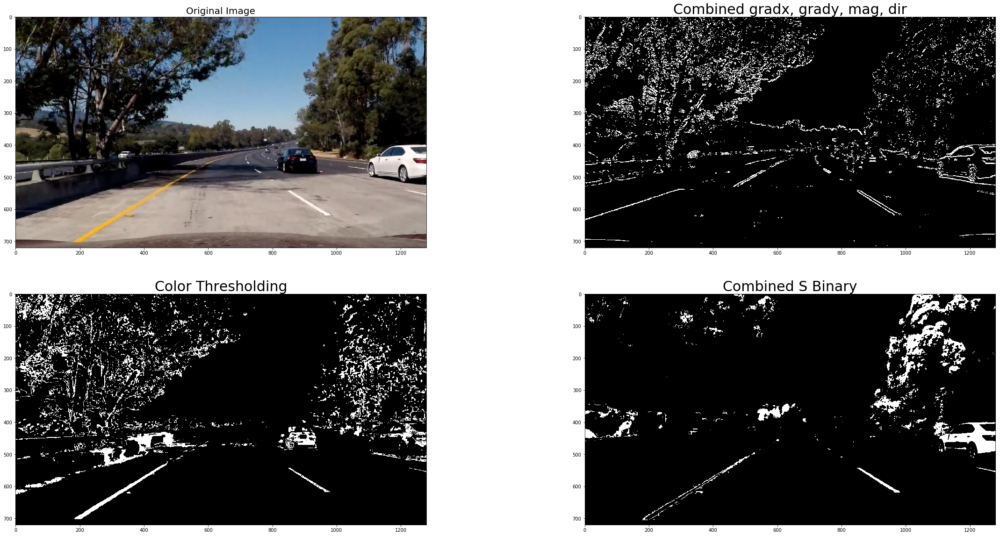

In [131]:
# check the plots
"""
img = 'undistorted_folder/undistorted_test6.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
img = 'undistorted_folder/undistorted_test2.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
img = 'undistorted_folder/undistorted_test5.jpg'
img = cv2.imread(img)
combined_binary, _, _, _ = combined_sobel_gradient_thres(img, disp=True)
"""
#img = 'undistorted_folder/undistorted_straight_lines1.jpg'
img = 'undistorted_folder/undistorted_test5.jpg'
img = cv2.imread(img)
combined_binary, img_color, combined_1, s_binary = combined_sobel_gradient_thres(img, disp=True)

In [132]:
# undistored transform matrix
print(matrix)

[[  1.16949654e+03   0.00000000e+00   6.68285391e+02]
 [  0.00000000e+00   1.14044391e+03   3.59592347e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]


In [133]:
def transform_image_warp(img, nx, ny): 
    offset = 100 # offset for dst points
    #type(img)
    # Grab the image shape
    
    img_size = (img.shape[1], img.shape[0])    
    #print(imgsz)
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    """
    img_size = (img.shape[1], img.shape[0])    
    #print(imgsz)
    src = np.float32(
        [[(img_size[0] / 2) - 60,    img_size[1] / 2 + 60],
        [((img_size[0] / 6) ),       img_size[1]],
        [(img_size[0] * 5 / 6),      img_size[1]],
        [(img_size[0] / 2 + 60),     img_size[1] / 2 + 60]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])    
    """
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)    
    return warped, M


def display_transformed_image(combined_binary, warped_img):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(combined_binary, cmap='gray')
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(warped_img,cmap='gray')
    ax2.set_title('Warped Image', fontsize=30)    
    plt.show()

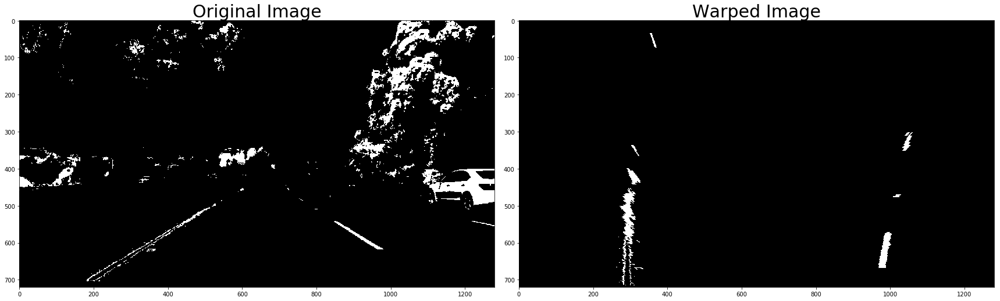

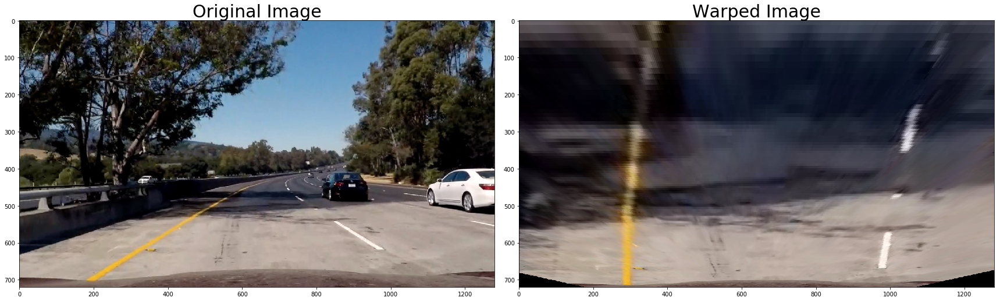

"\nimg1 = 'undistorted_folder/undistorted_test5.jpg'\nimg1 = cv2.imread(img1)\ncombined_binary_1, _, _, _ = combined_sobel_gradient_thres(img1, disp=False)\nwarped_img_1, M_1 = transform_image_warp(combined_binary_1, nx, ny) \ndisplay_transformed_image(combined_binary_1, warped_img_1)\n#display_transformed_image(combined_binary_1, warped_img_1)\n"

In [134]:
#warped, M = transform_image(combined_binary, src, dst, matrix) 
warped_img, M = transform_image_warp(combined_binary, nx, ny) 
display_transformed_image(combined_binary, warped_img)
color_warped_img, color_M = transform_image_warp(img_color, nx, ny) 
display_transformed_image(img_color, color_warped_img)

"""
img1 = 'undistorted_folder/undistorted_test5.jpg'
img1 = cv2.imread(img1)
combined_binary_1, _, _, _ = combined_sobel_gradient_thres(img1, disp=False)
warped_img_1, M_1 = transform_image_warp(combined_binary_1, nx, ny) 
display_transformed_image(combined_binary_1, warped_img_1)
#display_transformed_image(combined_binary_1, warped_img_1)
"""

In [135]:
# Locating the Lanes
def locating_lanes(binary_warped, nwindows=9, margin=100, minpix=50):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []    
    ## Create an image to draw on and an image to show the selection window
    ##out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
     
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return  left_fit, right_fit,left_lane_inds, right_lane_inds, \
            nonzerox, nonzeroy, histogram


In [136]:
def display_lanes(left_fit, right_fit, left_lane_inds, 
                  right_lane_inds, binary_warped, 
                  nonzerox, nonzeroy, histogram, margin=85): #50):
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]),  (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.imshow(binary_warped)
    #plt.imshow(out_img)
    #plt.imshow(result)
    plt.plot(left_fitx, ploty, color='red')
    plt.plot(right_fitx, ploty, color='red')    
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.show()

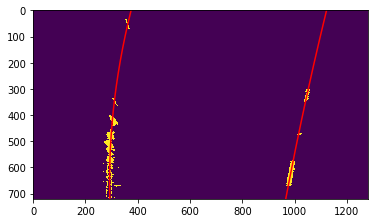

In [137]:
left_fit, right_fit, left_lane_inds, right_lane_inds,\
            nonzerox, nonzeroy, histogram = locating_lanes(warped_img)
    
display_lanes(left_fit, right_fit, left_lane_inds, \
              right_lane_inds, warped_img, nonzerox, nonzeroy, histogram)

......


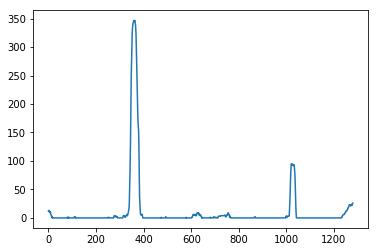

In [17]:
print('......')
plt.plot(histogram)  
plt.show()


# Radius of Curvature & Distance from Lane Center

In [18]:
def radius_curvature_center(binary_img, left_fit, right_fit):        
    ym_per_pix = 32/720#30/720 #3.048/100  # meters per pixel in y dimension
    xm_per_pix = 3.7/960#700 #3.7/380 #3.7/700 # meters per pixel in x dimension
    
    h = binary_img.shape[0] 
    ploty = np.linspace(0, h-1, h)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    y_eval = np.max(ploty)    
    # follow udacity lecture formulat
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)    
    left_curv  = ((1 + (2*left_fit_cr[0] *y_eval*ym_per_pix \
                        + left_fit_cr[1])**2) **1.5) / np.absolute(2*left_fit_cr[0])
    
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)        
    right_curv = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix \
                        + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Calculate vehicle center
    #left_lane and right lane bottom in pixels
    left_lane_bottom = (left_fit[0]*y_eval)**2 + left_fit[1]*y_eval + left_fit[2]
    right_lane_bottom = (right_fit[0]*y_eval)**2 + right_fit[1]*y_eval + right_fit[2]
    #left_lane_bottom = left_fit[2]#*y_eval)**2 + left_fit[0]*y_eval + left_fit[2]
    #right_lane_bottom = right_fit[2]#*y_eval)**2 + right_fit[0]*y_eval + right_fit[2]
    #left_lane_bottom = left_fit[2]#*y_eval)**2 + left_fit[0]*y_eval + left_fit[2]
    #right_lane_bottom = right_fit[2]#*y_eval)**2 + right_fit[0]*y_eval + right_fi
    # Lane center as mid of left and right lane bottom      
    
    lane_center = (left_lane_bottom + right_lane_bottom)/2.0
    center_image = binary_img.shape[1]/2 #640
    #print((right_lane_bottom - left_lane_bottom))
    #xm_per_pix = 3.7 / (right_lane_bottom - left_lane_bottom)
    center_dist = (lane_center - center_image) * xm_per_pix #Convert to meters
    #print(left_lane_bottom, right_lane_bottom, center_dis)
    return left_curv, right_curv, center_dist

In [19]:
left_curv, right_curv, center = radius_curvature_center(warped_img, left_fit, right_fit)


In [20]:
def draw_on_image(undist, warped_img, left_fit, right_fit, M, \
                   left_curv, right_curv, center, \
                   show_values=False, diagnosis=False):    
    ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image and draw the lines on
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    if diagnosis == True:
        color_template = np.dstack((warp_zero, warp_zero, warp_zero))
        combined_template = np.dstack((warp_zero, warp_zero, warp_zero))
        warp_one = np.ones_like(warped_img).astype(np.uint8)
        black  = np.dstack((warp_one*255, warp_one*100, warp_one))
        
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lanes the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    M_inverse = np.linalg.inv(M)
    
    # Warp the blank back to original image space using inverse perspective matrix
    unwarped = cv2.warpPerspective(color_warp, M_inverse, \
                                  (undist.shape[1], img.shape[0])) 
        
    result = cv2.addWeighted(undist, 1, unwarped, 0.3, 0)
    
    cv2.putText(result, 'left curvature: {:.2f} m'.format(left_curv), \
                (50, 50), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    
    cv2.putText(result, 'right curvature: {:.2f} m'.format(right_curv), \
                (50, 100), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    
    lr = ''
    if(center > 0): lr = 'right'
    elif (center<0): lr = 'left'
    else: lr = 'center'
    
    cv2.putText(result, 'vehicle is {:.2f}m {}'.format(abs(center), lr), \
                (50, 150), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    
    if show_values == True:
        fig, ax = plt.subplots(figsize=(15, 8))
        ax.imshow(result)        
        
    if diagnosis == True:
        #font = cv2.FONT_HERSHEY_COMPLEX
        #middlepanel = np.zeros((120, 1280, 3))#, dtype=np.uint8)
        #cv2.putText(middlepanel, "DEBUG", (30, 60), font, 1, (255,0,0), 2)
        #img = cv2.undistort(img_dist, matrix, dist, None, matrix)
        #combined_binary, _, _, _ = combined_sobel_gradient_thres(img)
        #warped_img, M = transform_image_warp(combined_binary, nx, ny)    
        
        diag_screen = np.zeros((1080, 1920, 3))# dtype=np.unit8)
        diag_screen[0:720, 0:1280, :] = result
        diag_screen[500:740, 1280:1600] = cv2.resize(color_warp, (320,240), interpolation=cv2.INTER_AREA)        
        cv2.polylines(color_template, np.int_([pts]), True, (0, 255, 0), 20)
        diag_screen[250:490, 1280:1600] = cv2.resize(color_template, (320,240), interpolation=cv2.INTER_AREA)
        
        #combined_binary, _, _, _ = combined_sobel_gradient_thres(undist)
        #cv2.polylines(combined_template, combined_binary,
        #warped_img, MM = transform_image_warp(combined_binary, nx, ny)         
        #combined_b = np.stack((combined_binary, combined_binary, combined_binary), axis=2) #np.dstack()
        #warped_img > 1
        #print(warped_img[warped_img >= 1].sum())
        wir = warped_img * 100
        wig = warped_img * 170
        #print(wi[wi >= 50].sum())
        cwarp = np.dstack((wir, wig, warp_zero))#, axis=2)
        #heatmap_img = cv2.applyColorMap(gray_img, cv2.COLORMAP_JET)
        #cwarp = cv2.addWeighted(undist, 1, unwarped, 0.3, 0)
        #diag_screen[500:740, 1280:1600] = cv2.resize(combined_b, (320,240), interpolation=cv2.INTER_AREA)
        diag_screen[0:240, 1280:1600]  = cv2.resize(cwarp, (320,240), interpolation=cv2.INTER_AREA)
        #diag_screen[
        #print(diag_screen)
        #print("hitting debug")
        return diag_screen
    else:
        return result

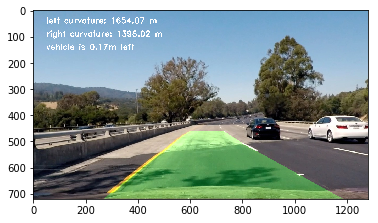

In [21]:
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#plt.imshow(img)
drawing = draw_on_image(img_color, warped_img, left_fit, right_fit, M, left_curv, right_curv, center,\
              show_values=False, diagnosis=False)#True)
plt.imshow(drawing)

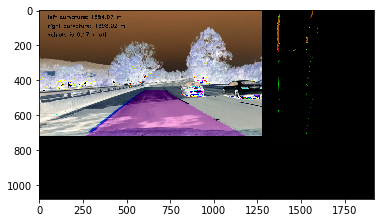

In [22]:
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
drawing = draw_on_image(img_color, warped_img, left_fit, right_fit, M, left_curv, right_curv, center,\
              show_values=False, diagnosis=True)#True)
plt.imshow(drawing)

# Pipeline

In [23]:
# for pipeline based on time-series images from the video
def locating_lanes_with_prev(left_fit, right_fit, binary_warped):    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) 
                    & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) 
                    & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]    
    left_fit_ = []
    right_fit_ = []    
    if len(leftx) != 0:        
        left_fit_ = np.polyfit(lefty, leftx, 2)    
    if len(rightx) != 0:        
        right_fit_ = np.polyfit(righty, rightx, 2)     
    return left_fit_, right_fit_


def is_good_lane(lane_class):
    status = True
    #print(lane_class.prev_left_lanes)
    #print(lane_class.right_fit)
    dist = lane_class.left_fit[2] - lane_class.right_fit[2]
    if lane_class.nlen_in > 0:
        left_diff = np.sum(np.absolute(lane_class.prev_left_lanes - lane_class.left_fit))
        right_diff = np.sum(np.absolute(lane_class.prev_right_lanes - lane_class.right_fit))        
        #print(lane_class.prev_right_lanes)
        right_m = np.mean(lane_class.prev_right_lanes, axis=0)
        left_m = np.mean(lane_class.prev_left_lanes, axis=0)
        diff_rel = 0.2 # 20%
        diff_right = np.absolute((right_m  - lane_class.right_fit)/right_m)
        diff_left = np.absolute((left_m  - lane_class.left_fit)/left_m)
        #print('mean', left_m)# - lane_class.left_fit[0])/lane_class.prev_left_lanes[0] 
        #print('right', lane_class.right_fit)
        #diff_l0 = np.absolute(lane_class.prev_left_lanes[0] - lane_class.left_fit[0])
        print('right diff' , diff_right)
        print('left_diff', diff_left)
        #print(diff_right[1], diff_right[1]>0.5)
        if diff_right[0] > diff_rel or diff_left[0] > diff_rel: 
            return False
        thres_margin = 50
        diff_threshold = thres_margin * len(lane_class.prev_right_lanes)
        if left_diff > diff_threshold or right_diff > diff_threshold:
            print('previous diff', diff_threshold, left_diff, right_diff)
            #status = False
            return False        
        #print(lane_class.left_fit)
        #print(lane_class.right_fit)
        if np.sum(lane_class.left_fit[0:1] - lane_class.right_fit[0:1]) > 1e-3:
            print('not parallel', lane_class.left_fit, lane_class.right_fit, 
                  np.sum(lane_class.left_fit - lane_class.right_fit))
            #status = False
            return False
            #break
    else:
        #status = True
        return True
    return status


In [104]:
# create a global data structure to store the time-series images
class Laneline():
    def __init__(self):
        self.last_left = None
        self.last_right = None
        self.left_fit = None
        self.right_fit = None
        self.count = 0 
        self.histograms = None
        self.prev_left_lanes = []
        self.prev_right_lanes = []
        self.bad_count = 0
        self.bad_line_hold = 4
        self.nlen = 10 # 50 # buffer size
        self.nlen_in = 0
        #self.current_left_lanes = None
        #self.current_right_lane = None
        

In [121]:

lane = Laneline()

def find_lanes(img_dist):    
    img = cv2.undistort(img_dist, matrix, dist, None, matrix)
    img = gaussian_blur(img)
    combined_binary, _, _, _ = combined_sobel_gradient_thres(img)
    warped_img, M = transform_image_warp(combined_binary, nx, ny) 
    #print('lane counter --> ', lane.counter)
    if lane.count == 0:
        lane.left_fit, lane.right_fit, left_lane_inds,\
                right_lane_inds, nonzerox, nonzeroy, lane.histograms = locating_lanes(warped_img)
        #lane.count += 1    
    else:
        lane.left_fit, lane.right_fit  = \
                locating_lanes_with_prev(lane.left_fit, lane.right_fit, warped_img)        
    
    #print(lane.left_fit, lane.right_fit)
    #return warped_img, lane.left_fit, lane.right_fit, M
    #status, delta_l, delta_s = is_good_lane(lane.left_fit, lane.right_fit)
    status = is_good_lane(lane)
    #status = True # open for the single image 
    print(status)
    left_curvature, right_curvature, center = radius_curvature_center(warped_img, lane.left_fit, lane.right_fit)    
    if abs(center) >= 0.55:
        status = False
    else:
        status = True
    print(center, status)
    
        
    bc_threshold = lane.bad_line_hold
    #, delta_l, delta_s)
    if status == True or (len(lane.prev_right_lanes) == 0 or len(lane.prev_left_lanes) == 0) : # or lane.bad_count >= bc_threshold:
        bad_count = 0
        #if lane.bad_count >= bc_threshold: lane.bad_count = 0
        lane.prev_left_lanes.append(lane.left_fit)
        lane.prev_right_lanes.append(lane.right_fit)
        nlen = lane.nlen
        lane.nlen_in += 1
        if lane.nlen_in >= nlen: #len(lane.prev_right_lanes) > nlen:
            lane.prev_right_lanes = lane.prev_right_lanes[-nlen::]            
            lane.prev_left_lanes = lane.prev_left_lanes[-nlen::]
            lane.nlen_in = nlen
    else:
        lane.bad_count += 1
        right_ls = lane.prev_right_lanes[0]
        len_rls = len(lane.prev_right_lanes)
        for i in range(1, len_rls):
            right_ls = np.add(right_ls, lane.prev_right_lanes[i])
            
        left_ls = lane.prev_left_lanes[0]
        len_lls = len(lane.prev_left_lanes)
        for i in range(1, len_lls):
            left_ls = np.add(left_ls, lane.prev_left_lanes[i])
        lane.left_fit = left_ls / len_lls
        lane.right_fit = right_ls / len_rls
    
    
    if lane.bad_count >= bc_threshold:
        print('clear bad lanes')
        lane.bad_count = 0
        lane.prev_left_lanes = []
        lane.prev_right_lanes = []
        lane.nlen_in = 0
    
    
    return warped_img, lane.left_fit, lane.right_fit, M, img#, combined_binary

True
0.0302400220862 True
right diff [ 0.21245318  0.47333725  0.02728356]
left_diff [ 1.34151053  0.74057085  0.02285466]
False
-0.0554632057225 True
right diff [ 3.26023257  1.77316367  0.1299493 ]
left_diff [ 8.52965215  4.55856421  0.36697947]
False
-0.177363962694 True
right diff [ 3.40946519  0.40605085  0.03690399]
left_diff [  6.14313919  12.7358888    0.27280094]
False
0.32381390355 True
right diff [ 1.27420594  1.68614767  0.11428854]
left_diff [ 4.53097933  4.662045    0.53140842]
False
-0.20008823071 True
right diff [ 2.81236641  1.377306    0.0934944 ]
left_diff [ 61.1557823   32.07160805   0.16673345]
False
-0.284447594911 True
right diff [ 4.01203627  1.28269742  0.02797401]
left_diff [ 31.34661027  33.04139562   0.57008818]
False
-0.00576503578068 True
right diff [ 0.03148075  0.48042871  0.10926105]
left_diff [ 2.93199495  5.21132571  0.57411487]
False
-0.19338922385 True


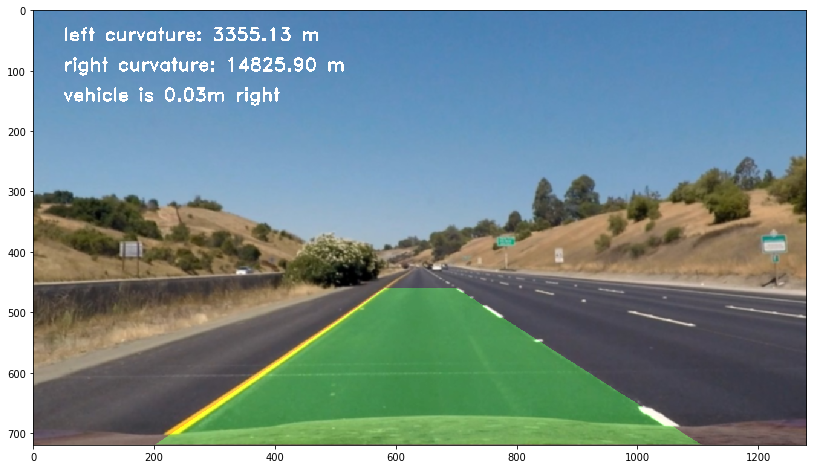

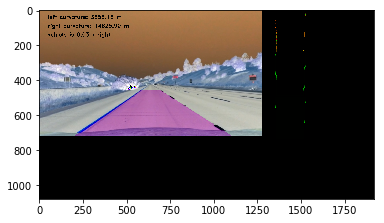

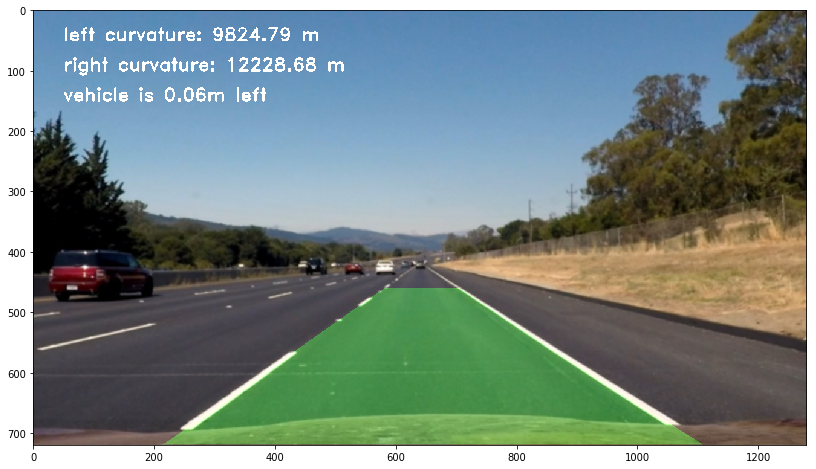

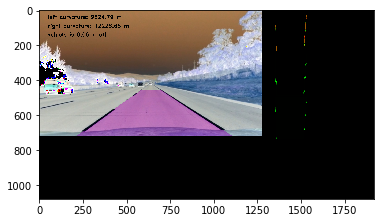

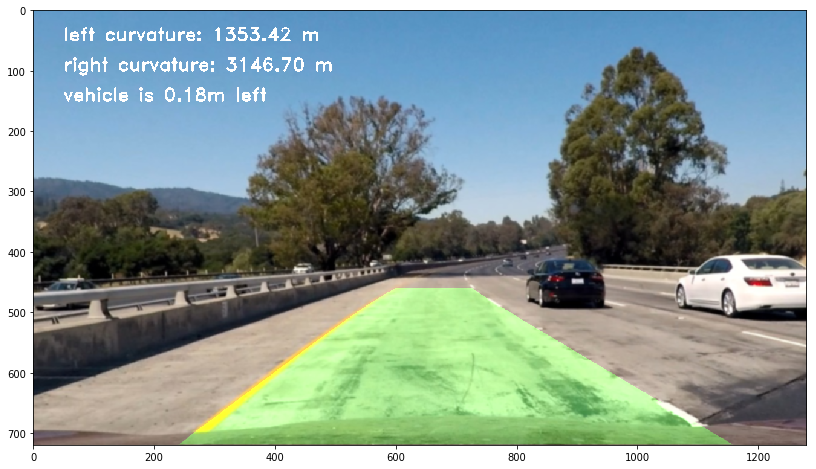

...

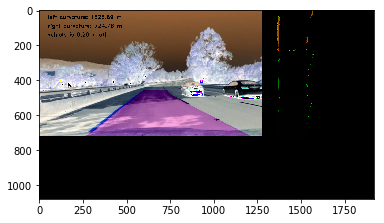

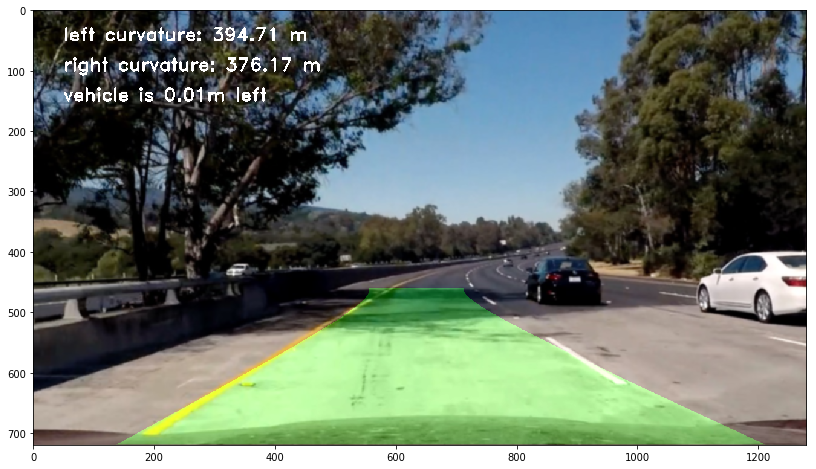

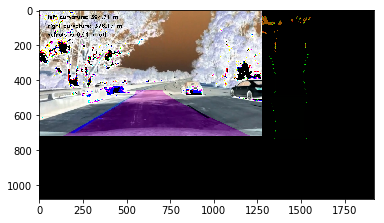

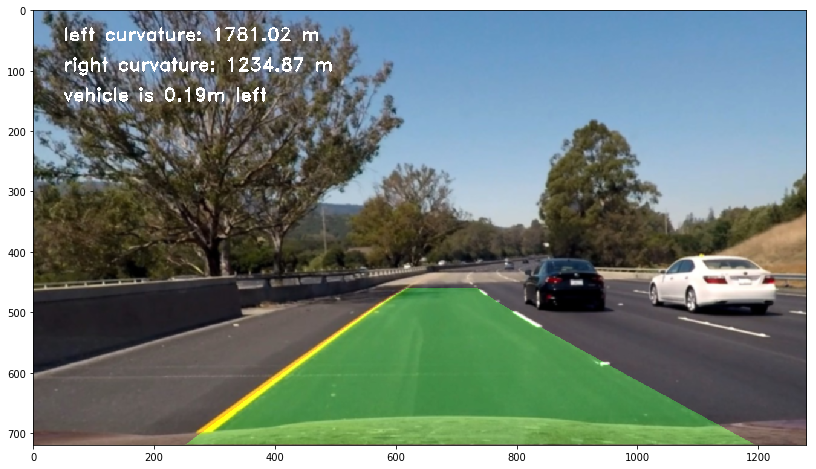

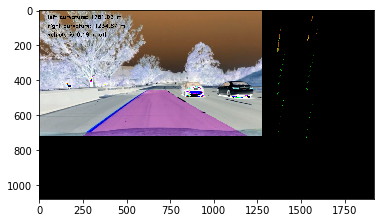

In [122]:
def pipeline(img, show_values=False):
    warped_img, left_fit, right_fit, M, undist_img = find_lanes(img)    
    left_curvature, right_curvature, center = radius_curvature_center(warped_img, left_fit, right_fit)
    return draw_on_image(undist_img, warped_img, left_fit,\
                         right_fit, M, left_curvature, right_curvature,\
                         center, show_values, diagnosis=True)
    
images = ['straight_lines1.jpg', 'straight_lines2.jpg',\
          'test1.jpg', 'test2.jpg','test3.jpg', 'test4.jpg', \
          'test5.jpg', 'test6.jpg']

for fname in images:
    img = cv2.imread('test_images/'+fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    drw = pipeline(img, True)
    plt.figure()
    plt.imshow(drw)

# Video Generations

In [123]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML 
lane = Laneline()
def process_video(img):
    return pipeline(img)


#%mkdir videos

In [125]:
lane = Laneline()
output_file = 'videos/project_video_small.mp4'
clip = VideoFileClip("project_video.mp4").subclip(38, 45)
#lip = VideoFileClip("project_video.mp4").subclip(0,3)
project_video_output = clip.fl_image(process_video)

%time project_video_output.write_videofile(output_file, audio=False)

True
-0.259058234611 True
[MoviePy] >>>> Building video videos/project_video_small.mp4
[MoviePy] Writing video videos/project_video_small.mp4



  1%|          | 1/176 [00:00<01:01,  2.84it/s]

right diff [ 0.  0.  0.]
left_diff [ 0.  0.  0.]
True
-0.259058234611 True



  1%|          | 2/176 [00:00<01:02,  2.77it/s]

right diff [ 0.39481217  0.19397319  0.02432095]
left_diff [ 0.10505917  0.10165441  0.02918047]
False
-0.310903020369 True



  2%|▏         | 3/176 [00:01<01:02,  2.75it/s]

right diff [ 0.35660998  0.15696472  0.01438766]
left_diff [  2.93752161e-01   1.06585357e-01   2.39517681e-04]
False
-0.170971781793 True



  2%|▏         | 4/176 [00:01<01:02,  2.73it/s]

right diff [ 1.51271539  0.62451422  0.06389566]
left_diff [ 0.3625735   0.1882923   0.02339063]
False
-0.450822738777 True



  3%|▎         | 5/176 [00:01<01:03,  2.70it/s]

right diff [ 0.2859662   0.15216338  0.01481923]
left_diff [ 0.37863411  0.14887499  0.00677669]
False
-0.175976912651 True



  3%|▎         | 6/176 [00:02<01:02,  2.70it/s]

right diff [ 0.15720174  0.10634529  0.01333204]
left_diff [ 0.23579044  0.03974091  0.01800461]
False
-0.201849752936 True



  4%|▍         | 7/176 [00:02<01:01,  2.74it/s]

right diff [ 0.31806938  0.14480161  0.01103729]
left_diff [ 0.17039017  0.04601242  0.00783289]
False
-0.168189146106 True



  5%|▍         | 8/176 [00:02<01:02,  2.69it/s]

right diff [ 0.51794442  0.21085439  0.01524493]
left_diff [ 0.01986292  0.0872753   0.03720466]
False
-0.140382534259 True



  5%|▌         | 9/176 [00:03<01:01,  2.72it/s]

right diff [ 0.17843782  0.07563731  0.00160036]
left_diff [ 0.17139252  0.10492702  0.02812378]
True
-0.200726841799 True



  6%|▌         | 10/176 [00:03<01:02,  2.64it/s]

right diff [ 0.3532196   0.15751707  0.01131315]
left_diff [ 0.15310654  0.15448252  0.0531979 ]
False
-0.161828587762 True



  6%|▋         | 11/176 [00:04<01:04,  2.58it/s]

right diff [ 0.41487441  0.18621243  0.01297171]
left_diff [ 0.52480738  0.31947351  0.07216656]
False
-0.174310625799 True



  7%|▋         | 12/176 [00:04<01:02,  2.63it/s]

right diff [ 0.56981923  0.24651574  0.01611199]
left_diff [ 0.53411299  0.30087236  0.06589694]
False
-0.137991429218 True



  7%|▋         | 13/176 [00:04<01:00,  2.69it/s]

right diff [ 0.5109315   0.23090423  0.01675748]
left_diff [ 0.61213694  0.35989433  0.08064641]
False
-0.147040264584 True



  8%|▊         | 14/176 [00:05<00:59,  2.73it/s]

right diff [ 0.51194442  0.2152958   0.01172325]
left_diff [ 0.57125473  0.31885043  0.06929969]
False
-0.14447055462 True



  9%|▊         | 15/176 [00:05<00:58,  2.76it/s]

right diff [ 0.59164967  0.05833301  0.00136798]
left_diff [ 0.13422448  0.14094788  0.05601536]
False
-0.195007574168 True



  9%|▉         | 16/176 [00:05<00:58,  2.72it/s]

right diff [  7.04118480e-01   8.95179159e-02   4.62158852e-04]
left_diff [ 0.05602013  0.09933274  0.05173241]
False
-0.207271549692 True



 10%|▉         | 17/176 [00:06<00:57,  2.76it/s]

right diff [  5.64899134e-01   8.00780930e-02   1.60905556e-04]
left_diff [ 0.50966936  0.24355167  0.00661247]
False
-0.121142256355 True



 10%|█         | 18/176 [00:06<00:57,  2.77it/s]

right diff [ 0.5838017   0.09313361  0.00152617]
left_diff [ 0.08751906  0.14594379  0.06401764]
False
-0.214555099622 True



 11%|█         | 19/176 [00:07<00:56,  2.78it/s]

right diff [ 0.65200503  0.15705357  0.00486262]
left_diff [ 0.07149771  0.00648076  0.0293441 ]
False
-0.219213721402 True



 11%|█▏        | 20/176 [00:07<00:56,  2.77it/s]

right diff [ 0.50014031  0.15289517  0.00971092]
left_diff [ 1.06907067  0.63213676  0.11734839]
False
-0.380495377762 True



 12%|█▏        | 21/176 [00:07<00:55,  2.80it/s]

right diff [ 0.54553548  0.18734645  0.01137763]
left_diff [ 0.53276674  0.35231133  0.05542892]
False
-0.168812581874 True



 12%|█▎        | 22/176 [00:08<00:54,  2.80it/s]

right diff [ 0.45793043  0.18786714  0.01355532]
left_diff [ 0.51573011  0.30272684  0.05815281]
False
-0.341221175065 True



 13%|█▎        | 23/176 [00:08<00:56,  2.73it/s]

right diff [ 0.27216139  0.12489333  0.00808642]
left_diff [ 1.35535232  0.90029994  0.18304308]
False
-0.487709248776 True



 14%|█▎        | 24/176 [00:08<00:55,  2.74it/s]

right diff [ 0.13816813  0.09895513  0.01187382]
left_diff [ 0.77555253  0.53364863  0.11789609]
False
-0.419439624782 True



 14%|█▍        | 25/176 [00:09<00:54,  2.76it/s]

right diff [ 0.54340346  0.2793755   0.0234538 ]
left_diff [ 1.13878063  0.70924812  0.12266754]
False
0.0792053752566 True



 15%|█▍        | 26/176 [00:09<00:54,  2.74it/s]

right diff [ 0.59131013  0.30506657  0.02828477]
left_diff [ 0.71629005  0.40554258  0.05560111]
False
0.0101536142731 True



 15%|█▌        | 27/176 [00:09<00:54,  2.73it/s]

right diff [ 0.6103623   0.30523039  0.02692458]
left_diff [ 0.70458026  0.38310817  0.04946725]
False
0.0206920316291 True



 16%|█▌        | 28/176 [00:10<00:55,  2.69it/s]

right diff [ 0.47914538  0.2929136   0.03334785]
left_diff [ 1.31602212  0.73464428  0.10461106]
False
0.116442076118 True



 16%|█▋        | 29/176 [00:10<00:54,  2.71it/s]

right diff [ 0.53814412  0.30068307  0.03269509]
left_diff [ 1.36880522  0.75539817  0.10653417]
False
0.134741086509 True



 17%|█▋        | 30/176 [00:11<00:53,  2.72it/s]

right diff [ 0.55410859  0.30463856  0.03266787]
left_diff [ 1.14557284  0.69566978  0.11185663]
False
0.114915852088 True



 18%|█▊        | 31/176 [00:11<00:53,  2.71it/s]

right diff [ 1.25731368  0.53050788  0.04189132]
left_diff [ 0.77215736  0.52622937  0.08761111]
False
0.17905300015 True



 18%|█▊        | 32/176 [00:11<00:52,  2.72it/s]

right diff [ 1.49592072  0.56423727  0.03942729]
left_diff [ 0.67801267  0.54861777  0.10356936]
False
0.200457368991 True



 19%|█▉        | 33/176 [00:12<00:52,  2.74it/s]

right diff [ 1.73630975  0.57708665  0.03837722]
left_diff [ 0.12836188  0.31593085  0.08342545]
False
0.166537466959 True



 19%|█▉        | 34/176 [00:12<00:51,  2.76it/s]

right diff [ 2.3183109   0.57705835  0.03146232]
left_diff [ 0.85805464  0.27793045  0.08993219]
False
0.188462757519 True



 20%|█▉        | 35/176 [00:12<00:51,  2.71it/s]

right diff [ 3.38775728  0.53301313  0.02969234]
left_diff [ 1.93084606  0.2838057   0.07816254]
False
0.208661688751 True



 20%|██        | 36/176 [00:13<00:50,  2.75it/s]

right diff [ 5.98669108  0.50834355  0.03095584]
left_diff [ 1.84724808  0.81554964  0.11012986]
False
0.260568904069 True



 21%|██        | 37/176 [00:13<00:50,  2.75it/s]

right diff [ 36.23387926   0.87239097   0.04531929]
left_diff [ 1.53820439  0.79169481  0.10598328]
False
0.317807716386 True



 22%|██▏       | 38/176 [00:13<00:50,  2.75it/s]

right diff [ 5.09208996  1.15186064  0.06099875]
left_diff [ 2.19513573  0.34336229  0.07079063]
False
0.300589471503 True


right diff [ 13.30820345   5.11104951   0.15803848]
left_diff [ 0.52125775  0.60510109  0.0881407 ]
False
0.80014948675 False



 23%|██▎       | 40/176 [00:15<01:08,  2.00it/s]

right diff [ 20.27673105   7.89870046   0.24495251]
left_diff [ 9.15785062  1.99509631  0.14484168]
False
1.24030444851 False


right diff [ 6.75791787  1.93238642  0.0310144 ]
left_diff [ 0.9076055   0.51012485  0.09643781]
False
-0.0975104278526 True



 24%|██▍       | 42/176 [00:17<01:24,  1.58it/s]

right diff [ 10.4929492    1.77961457   0.03564427]
left_diff [ 3.56645305  0.37193009  0.07707793]
False
-0.194496030151 True



 24%|██▍       | 43/176 [00:17<01:16,  1.75it/s]

right diff [ 37.54268887   1.90535307   0.03952116]
left_diff [ 1.05653948  0.06333027  0.0801851 ]
False
-0.228051054729 True



 25%|██▌       | 44/176 [00:17<01:07,  1.95it/s]

right diff [ 11.34491571   1.59042727   0.04046179]
left_diff [ 2.63303732  0.95978727  0.02459231]
False
-0.329865412137 True



 26%|██▌       | 45/176 [00:18<01:02,  2.11it/s]

right diff [ 4.19724927  1.27641178  0.03697918]
left_diff [ 2.4386038   1.37092296  0.01563332]
False
-0.39201634514 True



 26%|██▌       | 46/176 [00:18<00:57,  2.26it/s]

right diff [ 2.37676283  1.05498172  0.03802621]
left_diff [ 2.43986348  1.61790065  0.03831044]
False
-0.456495494528 True



 27%|██▋       | 47/176 [00:18<00:55,  2.32it/s]

right diff [ 1.18142422  0.71804211  0.0374839 ]
left_diff [ 2.46398592  1.76676455  0.04706267]
False
-0.484738761101 True



 27%|██▋       | 48/176 [00:19<00:53,  2.37it/s]

right diff [ 0.67924412  0.51944221  0.03335983]
left_diff [ 1.43918345  1.16587255  0.03309716]
False
-0.467167703531 True



 28%|██▊       | 49/176 [00:19<00:52,  2.42it/s]

right diff [ 0.14314774  0.08164808  0.0178648 ]
left_diff [ 0.99782041  0.81475261  0.00842163]
False
-0.363378360382 True



 28%|██▊       | 50/176 [00:20<00:52,  2.40it/s]

right diff [ 0.50597964  0.18202661  0.00295714]
left_diff [ 0.45204705  0.44144359  0.00110729]
False
-0.278789470498 True



 29%|██▉       | 51/176 [00:20<00:51,  2.43it/s]

right diff [ 0.34826447  0.24628378  0.02835709]
left_diff [ 0.04758572  0.07359374  0.03822221]
False
-0.466418610131 True



 30%|██▉       | 52/176 [00:21<00:53,  2.31it/s]

right diff [ 0.37382222  0.32635354  0.05097054]
left_diff [ 0.22597169  0.31102953  0.12464897]
False
-0.468408437244 True



 30%|███       | 53/176 [00:21<00:53,  2.30it/s]

right diff [ 0.24097306  0.2786451   0.05738605]
left_diff [ 0.45806504  0.61808761  0.19108223]
False
-0.418656635113 True



 31%|███       | 54/176 [00:22<00:59,  2.07it/s]

right diff [ 0.04208179  0.17730698  0.05694417]
left_diff [ 0.67688879  0.9624525   0.26964369]
False
-0.331629206231 True



 31%|███▏      | 55/176 [00:22<00:57,  2.10it/s]

right diff [ 0.1138992   0.19779552  0.05442909]
left_diff [ 0.66795482  0.89542015  0.22570018]
False
-0.354167990632 True



 32%|███▏      | 56/176 [00:23<00:57,  2.09it/s]

right diff [ 0.08939117  0.14504875  0.02472398]
left_diff [ 0.64442977  0.37936062  0.00550827]
False
-0.273006208284 True



 32%|███▏      | 57/176 [00:23<00:54,  2.17it/s]

right diff [ 0.11188272  0.12338593  0.01702101]
left_diff [ 0.72794915  0.49573146  0.01768799]
False
-0.242989985939 True



 33%|███▎      | 58/176 [00:23<00:55,  2.14it/s]

right diff [ 0.15459537  0.00986743  0.02493687]
left_diff [ 0.33532341  0.24921569  0.1214643 ]
False
-0.382945258682 True



 34%|███▎      | 59/176 [00:24<00:55,  2.12it/s]

right diff [ 0.04829706  0.07477601  0.02543903]
left_diff [ 0.2182438   0.25418899  0.09671141]
False
-0.344342225452 True



 34%|███▍      | 60/176 [00:24<00:54,  2.14it/s]

right diff [ 0.14414952  0.09426581  0.02191082]
left_diff [ 0.10546879  0.19781844  0.0481724 ]
True
-0.339583256676 True



 35%|███▍      | 61/176 [00:25<00:57,  2.02it/s]

right diff [ 0.14050125  0.08931358  0.02624222]
left_diff [ 0.11500238  0.19042852  0.0481788 ]
True
-0.354169142828 True



 35%|███▌      | 62/176 [00:25<00:55,  2.05it/s]

right diff [ 0.08130854  0.00229727  0.00330976]
left_diff [ 1.07255401  1.089648    0.12391906]
False
-0.283661896109 True



 36%|███▌      | 63/176 [00:26<00:54,  2.07it/s]

right diff [ 0.0514531   0.09738392  0.0059718 ]
left_diff [ 0.63643068  0.76316313  0.10711173]
False
-0.363976196137 True



 36%|███▋      | 64/176 [00:26<00:52,  2.13it/s]

right diff [ 0.07502983  0.11221541  0.0092265 ]
left_diff [ 1.1631329   1.28540348  0.14059071]
False
-0.327315610168 True



 37%|███▋      | 65/176 [00:27<00:51,  2.17it/s]

right diff [ 0.12120658  0.17554479  0.02259068]
left_diff [ 0.29183372  0.76078313  0.13168907]
False
-0.400816262415 True



 38%|███▊      | 66/176 [00:27<00:48,  2.28it/s]

right diff [ 0.80058702  0.38067845  0.03000927]
left_diff [ 0.2179316   0.7953138   0.13750028]
False
-0.13007235318 True



 38%|███▊      | 67/176 [00:28<00:45,  2.37it/s]

right diff [ 0.51415224  0.21821199  0.01459059]
left_diff [ 0.70307741  1.23265232  0.1531633 ]
False
-0.174443264055 True



 39%|███▊      | 68/176 [00:28<00:48,  2.22it/s]

right diff [ 0.37521631  0.16862518  0.01480496]
left_diff [  1.53176583e+00   9.97271130e-01   4.55674360e-04]
False
-0.315838745616 True



 39%|███▉      | 69/176 [00:28<00:46,  2.30it/s]

right diff [ 0.17320434  0.08570629  0.00934242]
left_diff [ 0.73926787  0.55899091  0.00691608]
False
-0.316495051894 True



 40%|███▉      | 70/176 [00:29<00:45,  2.35it/s]

right diff [ 0.09859944  0.04407135  0.00192749]
left_diff [ 0.7607269   0.63848063  0.00620553]
False
-0.324083424957 True



 40%|████      | 71/176 [00:29<00:46,  2.28it/s]

right diff [ 0.01992727  0.02821624  0.00763855]
left_diff [ 1.10704745  1.77879354  0.08350206]
False
-0.356006683621 True



 41%|████      | 72/176 [00:30<00:44,  2.34it/s]

right diff [ 0.17514037  0.0821231   0.00673107]
left_diff [ 0.19534931  0.31717102  0.0066085 ]
True
-0.275242144655 True



 41%|████▏     | 73/176 [00:30<00:43,  2.35it/s]

right diff [ 0.21555114  0.06758027  0.0018389 ]
left_diff [ 0.13634834  0.25050933  0.03985278]
False
-0.257083276631 True


right diff [ 0.25501307  0.08198188  0.00196341]
left_diff [ 3.92516514  5.20905342  0.18517837]
False
-0.488954553251 True



 43%|████▎     | 75/176 [00:31<00:43,  2.31it/s]

right diff [ 0.20961142  0.05053545  0.00711417]
left_diff [ 0.38523245  0.75958846  0.12019275]
False
-0.240837745427 True



 43%|████▎     | 76/176 [00:32<00:44,  2.23it/s]

right diff [ 0.18063547  0.07329036  0.00458064]
left_diff [ 2.31285143  3.07489943  0.21355729]
False
-0.553246266196 False



 44%|████▍     | 77/176 [00:32<00:45,  2.16it/s]

right diff [ 1.0921664   0.38901555  0.02139596]
left_diff [ 3.74225914  5.22123572  0.40563735]
False
-0.83529706307 False
clear bad lanes



 44%|████▍     | 78/176 [00:33<00:45,  2.14it/s]

True
0.196040223278 True



 45%|████▍     | 79/176 [00:33<00:43,  2.25it/s]

right diff [ 0.09500322  0.03568905  0.03389771]
left_diff [ 1.84023874  1.65151656  0.50608895]
False
0.910520219585 False



 45%|████▌     | 80/176 [00:33<00:41,  2.29it/s]

right diff [ 0.01149216  0.1687777   0.05593702]
left_diff [ 2.82967001  2.55087536  0.79389806]
False
1.36703014998 False



 46%|████▌     | 81/176 [00:34<00:39,  2.39it/s]

right diff [ 0.59740423  0.81253029  0.12033941]
left_diff [ 0.27876552  0.35250092  0.14952206]
False
0.460437834176 True



 47%|████▋     | 82/176 [00:34<00:38,  2.41it/s]

right diff [ 1.07624735  1.03427915  0.12863943]
left_diff [ 0.40553061  0.41653915  0.16979749]
False
-0.338651828801 True



 47%|████▋     | 83/176 [00:34<00:37,  2.48it/s]

right diff [ 2.95966243  2.90699013  0.23933465]
left_diff [ 2.0675937   1.81822439  0.5719566 ]
False
-0.63420278173 False



 48%|████▊     | 84/176 [00:35<00:37,  2.46it/s]

right diff [ 0.78432955  0.46368575  0.04409059]
left_diff [ 0.28360896  0.18688585  0.03524128]
False
-0.181051639169 True



 48%|████▊     | 85/176 [00:35<00:36,  2.50it/s]

right diff [ 0.28811625  0.41037029  0.05492117]
left_diff [ 1.37848316  0.80854107  0.10306655]
False
-0.285546938338 True



 49%|████▉     | 86/176 [00:36<00:37,  2.41it/s]

right diff [ 0.87522582  0.54409305  0.02826943]
left_diff [ 1.90693868  1.30205087  0.84528338]
False
-0.138788363269 True



 49%|████▉     | 87/176 [00:36<00:35,  2.49it/s]

right diff [ 15.03144734  10.86583579   1.09518102]
left_diff [ 3.02733198  1.94606683  0.95278843]
False
5.07467872898 False
clear bad lanes



 50%|█████     | 88/176 [00:37<00:35,  2.51it/s]

True
9.5418549253 False



 51%|█████     | 89/176 [00:37<00:33,  2.56it/s]

right diff [ 0.81548203  0.7780346   1.35840028]
left_diff [ 0.23908441  0.75319677  2.48548454]
False
2.38809652321 False



 51%|█████     | 90/176 [00:37<00:33,  2.57it/s]

right diff [ 0.9466791   0.93308781  1.66821191]
left_diff [ 0.434217    1.09314118  4.07657721]
False
1.13303166015 False



 52%|█████▏    | 91/176 [00:38<00:33,  2.56it/s]

right diff [ 0.95816564  0.9411905   1.76803967]
left_diff [ 1.62514475  2.76803228  9.91310695]
False
2.30004079804 False



 52%|█████▏    | 92/176 [00:38<00:32,  2.61it/s]

right diff [ 0.92139183  0.88961806  1.61092204]
left_diff [  3.30117767   4.25711665  18.39173577]
False
-1.51000220773 False
clear bad lanes



 53%|█████▎    | 93/176 [00:38<00:32,  2.58it/s]

True
3.25887217855 False



 53%|█████▎    | 94/176 [00:39<00:32,  2.55it/s]

right diff [ 0.13273494  0.08280601  0.06019542]
left_diff [ 0.53202185  0.47482694  0.23309749]
False
3.31369633686 False



 54%|█████▍    | 95/176 [00:39<00:31,  2.56it/s]

right diff [ 0.45150872  0.38631792  0.68754286]
left_diff [ 0.50561543  0.51216772  0.29162756]
False
1.78266993548 False



 55%|█████▍    | 96/176 [00:40<00:31,  2.51it/s]

right diff [ 0.36224765  0.24857752  0.23955673]
left_diff [ 1.4401283   1.70245282  1.56318299]
False
0.514988691867 True



 55%|█████▌    | 97/176 [00:40<00:30,  2.58it/s]

right diff [ 0.87830413  0.85107838  1.80540741]
left_diff [ 0.98800589  1.00142878  0.75698683]
False
-0.0234909472638 True



 56%|█████▌    | 98/176 [00:40<00:29,  2.66it/s]

right diff [ 1.37085646  1.38493154  5.78890657]
left_diff [ 0.81804151  0.87346066  0.63741481]
False
-1.8732101955 False



 56%|█████▋    | 99/176 [00:41<00:28,  2.72it/s]

right diff [ 0.98619113  1.24512253  7.11478966]
left_diff [ 0.67957107  0.74039873  0.57331871]
False
4.82396115361 False
clear bad lanes



 57%|█████▋    | 100/176 [00:41<00:28,  2.70it/s]

True
2.74718654872 False



 57%|█████▋    | 101/176 [00:41<00:27,  2.75it/s]

right diff [ 1.5176575   1.4848194   2.67226448]
left_diff [ 0.0480501   0.17372491  0.1070398 ]
False
-2.45406331456 False



 58%|█████▊    | 102/176 [00:42<00:26,  2.77it/s]

right diff [ 1.03778156  1.08224933  2.13922352]
left_diff [ 1.48140622  1.26788693  0.31341585]
False
-0.0135012543847 True



 59%|█████▊    | 103/176 [00:42<00:25,  2.82it/s]

right diff [  1.48644521   1.42917404  16.7347906 ]
left_diff [ 6.46197854  4.29592704  0.55701102]
False
-1.65938853877 False



 59%|█████▉    | 104/176 [00:42<00:25,  2.82it/s]

right diff [  1.00805077   1.12792827  14.94781517]
left_diff [ 4.6867847   3.72438101  0.61847247]
False
-0.742563095559 False



 60%|█████▉    | 105/176 [00:43<00:25,  2.84it/s]

right diff [  1.10508811   1.18620121  15.19685263]
left_diff [ 1.69877156  1.93425644  0.44719771]
False
-0.559531182618 False
clear bad lanes



 60%|██████    | 106/176 [00:43<00:24,  2.82it/s]

True
-0.34486791238 True


right diff [ 0.16302852  0.00818945  0.0063607 ]
left_diff [ 0.52947292  0.23199672  0.02846761]
False
-0.259833887672 True



 61%|██████▏   | 108/176 [00:44<00:28,  2.42it/s]

right diff [ 0.18343202  0.02823756  0.00286817]
left_diff [ 0.87786086  0.34154231  0.04683752]
False
-0.196878391477 True



 62%|██████▏   | 109/176 [00:45<00:26,  2.53it/s]

right diff [ 0.17783392  0.01214322  0.01280799]
left_diff [ 1.19209428  0.33563214  0.01830797]
False
-0.158905134523 True



 62%|██████▎   | 110/176 [00:45<00:25,  2.60it/s]

right diff [ 0.62097119  0.08165208  0.01311492]
left_diff [ 1.60591742  0.34924956  0.00581482]
False
-0.174317098626 True



 63%|██████▎   | 111/176 [00:45<00:24,  2.68it/s]

right diff [ 0.49830676  0.0576726   0.01885578]
left_diff [ 1.03538517  0.11969626  0.04389481]
False
-0.212829553391 True



 64%|██████▎   | 112/176 [00:46<00:23,  2.70it/s]

right diff [ 0.38353835  0.05045373  0.01392412]
left_diff [ 1.21407526  0.19375951  0.01832965]
False
-0.192978356218 True



 64%|██████▍   | 113/176 [00:46<00:22,  2.74it/s]

right diff [ 0.14602517  0.05700616  0.00784558]
left_diff [ 0.67794985  0.12072565  0.02687201]
False
-0.213690342516 True



 65%|██████▍   | 114/176 [00:46<00:23,  2.68it/s]

right diff [ 0.08048771  0.07468751  0.01829378]
left_diff [ 1.29553265  0.11675401  0.0511458 ]
False
-0.223443937735 True



 65%|██████▌   | 115/176 [00:47<00:23,  2.61it/s]

right diff [ 0.115736    0.14183347  0.033886  ]
left_diff [ 1.76219944  0.10605678  0.07926419]
False
-0.25431083993 True



 66%|██████▌   | 116/176 [00:47<00:23,  2.56it/s]

right diff [ 0.06098911  0.10134607  0.03806435]
left_diff [ 1.88657456  0.06560945  0.08859102]
False
-0.2501060055 True



 66%|██████▋   | 117/176 [00:47<00:22,  2.60it/s]

right diff [ 0.01055586  0.09452877  0.03177275]
left_diff [ 2.31066761  0.03391467  0.06358017]
False
-0.261545639671 True



 67%|██████▋   | 118/176 [00:48<00:22,  2.63it/s]

right diff [ 0.01535152  0.10423347  0.03410276]
left_diff [ 2.16272258  0.07667936  0.05899707]
False
-0.270784285665 True



 68%|██████▊   | 119/176 [00:48<00:21,  2.63it/s]

right diff [ 0.07796157  0.03912519  0.02205265]
left_diff [ 1.73198895  0.20600067  0.01920449]
False
-0.274445828129 True



 68%|██████▊   | 120/176 [00:49<00:21,  2.55it/s]

right diff [ 0.11700202  0.00047831  0.01491021]
left_diff [ 0.73660898  0.08390156  0.01904764]
False
-0.242489026234 True



 69%|██████▉   | 121/176 [00:49<00:21,  2.56it/s]

right diff [ 0.13424388  0.14346415  0.03065603]
left_diff [ 0.09643844  0.11866997  0.04875314]
True
-0.255703486483 True



 69%|██████▉   | 122/176 [00:49<00:21,  2.56it/s]

right diff [ 0.05542704  0.01986849  0.00838291]
left_diff [ 0.27050531  0.17697058  0.02934395]
False
-0.20466055196 True



 70%|██████▉   | 123/176 [00:50<00:20,  2.63it/s]

right diff [ 1.10623139  0.52934202  0.05511004]
left_diff [ 0.65142608  0.34882193  0.04268071]
False
-0.353587526239 True



 70%|███████   | 124/176 [00:50<00:19,  2.66it/s]

right diff [ 0.17801751  0.06488045  0.00789191]
left_diff [ 0.64286062  0.30871966  0.02424273]
False
-0.206366145792 True


right diff [ 0.20799724  0.08487919  0.00756903]
left_diff [ 0.64545556  0.28045774  0.00916157]
False
-0.217347153774 True



 72%|███████▏  | 126/176 [00:51<00:19,  2.54it/s]

right diff [ 0.28717168  0.12909149  0.01329187]
left_diff [ 0.79208376  0.37708943  0.02646087]
False
-0.218537043068 True



 72%|███████▏  | 127/176 [00:51<00:18,  2.64it/s]

right diff [ 0.03032643  0.0262133   0.00173534]
left_diff [ 0.88257335  0.29497947  0.01356686]
False
-0.171309924831 True



 73%|███████▎  | 128/176 [00:52<00:18,  2.56it/s]

right diff [ 0.13186406  0.08121157  0.00792164]
left_diff [ 0.91866625  0.28895803  0.01619952]
False
-0.187888261229 True



 73%|███████▎  | 129/176 [00:52<00:18,  2.59it/s]

right diff [ 0.01911337  0.03847069  0.01108959]
left_diff [ 0.72117859  0.23331045  0.00914795]
False
-0.168253381748 True



 74%|███████▍  | 130/176 [00:53<00:17,  2.65it/s]

right diff [ 0.14910362  0.02068542  0.00908664]
left_diff [ 0.36698854  0.05081484  0.02464838]
False
-0.178461408107 True



 74%|███████▍  | 131/176 [00:53<00:17,  2.59it/s]

right diff [ 0.19698168  0.00880926  0.02012784]
left_diff [ 1.85005448  0.32677486  0.02282941]
False
-0.215301596127 True



 75%|███████▌  | 132/176 [00:53<00:17,  2.55it/s]

right diff [ 0.6968085   0.29389361  0.01060196]
left_diff [ 2.61454692  0.60185798  0.05164788]
False
-0.119684476446 True



 76%|███████▌  | 133/176 [00:54<00:16,  2.65it/s]

right diff [ 0.34023291  0.10756213  0.00704819]
left_diff [ 2.15097964  0.54811565  0.04437483]
False
-0.199845883887 True



 76%|███████▌  | 134/176 [00:54<00:15,  2.70it/s]

right diff [ 0.00765489  0.02720161  0.0183251 ]
left_diff [ 1.50353909  0.40694217  0.0242138 ]
False
-0.240819667453 True



 77%|███████▋  | 135/176 [00:54<00:15,  2.73it/s]

right diff [ 0.01318887  0.01593736  0.00709106]
left_diff [ 1.08369112  0.36333388  0.02968333]
False
-0.231229598512 True



 77%|███████▋  | 136/176 [00:55<00:14,  2.77it/s]

right diff [ 0.03363336  0.00067674  0.01380738]
left_diff [ 0.50083516  0.0851441   0.01752616]
False
-0.197870495665 True



 78%|███████▊  | 137/176 [00:55<00:13,  2.80it/s]

right diff [ 0.13889699  0.01724177  0.00389621]
left_diff [ 0.3655092   0.12427118  0.00199048]
False
-0.225845453584 True



 78%|███████▊  | 138/176 [00:55<00:13,  2.78it/s]

right diff [ 0.17595138  0.0266166   0.00068027]
left_diff [ 0.1162307   0.05850715  0.00688984]
True
-0.226468042704 True


right diff [ 0.05751777  0.00915694  0.00446372]
left_diff [ 0.01841987  0.00795416  0.00540142]
True
-0.202703410991 True



 80%|███████▉  | 140/176 [00:56<00:14,  2.50it/s]

right diff [ 0.28790563  0.05750057  0.00801453]
left_diff [ 0.09875166  0.01680345  0.02348874]
False
-0.24471416477 True



 80%|████████  | 141/176 [00:57<00:13,  2.54it/s]

right diff [ 0.1185386   0.02142012  0.00609101]
left_diff [ 0.03401742  0.0140055   0.00533987]
True
-0.238461551148 True



 81%|████████  | 142/176 [00:57<00:13,  2.59it/s]

right diff [ 0.3365012   0.12632372  0.00378245]
left_diff [ 0.06361602  0.01006776  0.00122603]
False
-0.289216218976 True


right diff [ 0.01115648  0.01450945  0.00636915]
left_diff [ 0.03892959  0.05860496  0.01182686]
True
-0.226521633444 True



 81%|████████▏ | 143/176 [00:58<00:16,  1.97it/s]

right diff [ 0.16896802  0.08640771  0.00905432]
left_diff [ 0.01905794  0.09403105  0.02753651]
True
-0.190004327139 True



 82%|████████▏ | 145/176 [00:59<00:14,  2.10it/s]

right diff [ 0.25221933  0.17863396  0.02751765]
left_diff [ 0.1449327   0.07113717  0.01138716]
False
-0.186092338014 True



 83%|████████▎ | 146/176 [00:59<00:13,  2.27it/s]

right diff [ 0.22169667  0.16242181  0.0266082 ]
left_diff [ 0.03481457  0.01573874  0.00664242]
False
-0.168857911429 True



 84%|████████▎ | 147/176 [01:00<00:12,  2.40it/s]

right diff [ 0.00033626  0.05018368  0.01535587]
left_diff [ 0.14414635  0.05533361  0.00676056]
True
-0.200593026357 True



 84%|████████▍ | 148/176 [01:00<00:11,  2.54it/s]

right diff [ 0.03374246  0.02615753  0.01249479]
left_diff [ 0.33546597  0.14257464  0.00251267]
False
-0.183591100841 True



 85%|████████▍ | 149/176 [01:00<00:10,  2.50it/s]

right diff [ 0.21699012  0.09980331  0.01106161]
left_diff [ 0.48707962  0.24684999  0.01340912]
False
-0.112260135252 True



 85%|████████▌ | 150/176 [01:01<00:11,  2.36it/s]

right diff [ 0.38546138  0.15397318  0.01173958]
left_diff [ 0.53397094  0.25806716  0.00873281]
False
-0.0662860986008 True



 86%|████████▌ | 151/176 [01:01<00:10,  2.43it/s]

right diff [ 0.05705024  0.02219475  0.00289415]
left_diff [ 0.56642836  0.23963403  0.00173898]
False
-0.108803769802 True



 86%|████████▋ | 152/176 [01:02<00:09,  2.49it/s]

right diff [ 0.10466555  0.0136431   0.01517433]
left_diff [ 0.87231893  0.52935284  0.06225476]
False
-0.0526317076334 True



 87%|████████▋ | 153/176 [01:02<00:09,  2.54it/s]

right diff [ 0.18553978  0.0269261   0.01107798]
left_diff [ 1.06380883  0.54142255  0.04393971]
False
-0.00569300948833 True



 88%|████████▊ | 154/176 [01:02<00:08,  2.57it/s]

right diff [ 0.49240728  0.14636465  0.00608875]
left_diff [ 1.02261941  0.54845565  0.05181819]
False
0.0589640528764 True



 88%|████████▊ | 155/176 [01:03<00:07,  2.65it/s]

right diff [  6.52504604e-01   2.20333703e-01   2.03396151e-04]
left_diff [ 1.06036974  0.55956784  0.05389794]
False
0.101629548442 True



 89%|████████▊ | 156/176 [01:03<00:07,  2.68it/s]

right diff [ 0.58727607  0.25027259  0.0139028 ]
left_diff [ 0.88488332  0.38378426  0.02046252]
False
0.0925978073127 True



 89%|████████▉ | 157/176 [01:03<00:07,  2.70it/s]

right diff [ 0.47965263  0.19447949  0.00392945]
left_diff [ 0.68952479  0.44133503  0.0473392 ]
False
0.0892723636484 True



 90%|████████▉ | 158/176 [01:04<00:06,  2.66it/s]

right diff [ 0.28744891  0.0257039   0.00546142]
left_diff [ 1.9324873   0.23410018  0.00583988]
False
-0.0507166766385 True


right diff [ 0.56280765  0.06297686  0.00130946]
left_diff [ 3.08851879  0.42675448  0.00380455]
False
-0.0978770376591 True



 91%|█████████ | 160/176 [01:05<00:06,  2.47it/s]

right diff [ 0.61281838  0.08858241  0.00165113]
left_diff [ 3.30316837  0.6626412   0.01894799]
False
-0.139859514793 True



 91%|█████████▏| 161/176 [01:05<00:06,  2.46it/s]

right diff [ 0.52033526  0.05538788  0.01277443]
left_diff [ 3.03016629  0.94019581  0.05420246]
False
-0.173158027114 True



 92%|█████████▏| 162/176 [01:05<00:05,  2.56it/s]

right diff [ 0.53736223  0.1041295   0.00714514]
left_diff [ 2.17088856  0.75988696  0.0325868 ]
False
-0.187254807366 True



 93%|█████████▎| 163/176 [01:06<00:04,  2.63it/s]

right diff [ 0.72091729  0.17265748  0.00863899]
left_diff [ 1.57960703  0.72266468  0.04475987]
False
-0.233943746086 True



 93%|█████████▎| 164/176 [01:06<00:04,  2.67it/s]

right diff [ 0.48874842  0.13408096  0.00780936]
left_diff [ 0.85241084  0.44034128  0.02405815]
False
-0.209628454978 True



 94%|█████████▍| 165/176 [01:07<00:04,  2.69it/s]

right diff [ 0.60082396  0.24324401  0.00554112]
left_diff [ 0.41644225  0.16356385  0.00999842]
False
-0.239343389668 True



 94%|█████████▍| 166/176 [01:07<00:03,  2.74it/s]

right diff [ 0.25812041  0.06128511  0.01548094]
left_diff [ 0.36115157  0.30589409  0.03416671]
False
-0.227259938085 True



 95%|█████████▍| 167/176 [01:07<00:03,  2.76it/s]

right diff [ 0.19482437  0.05061388  0.01655353]
left_diff [ 0.30477438  0.09410011  0.00972288]
False
-0.180977343959 True



 95%|█████████▌| 168/176 [01:08<00:02,  2.74it/s]

right diff [ 0.33571308  0.1313688   0.00831041]
left_diff [ 0.5605421   0.27629103  0.00944544]
False
-0.202280006229 True



 96%|█████████▌| 169/176 [01:08<00:02,  2.77it/s]

right diff [ 0.26479703  0.12761339  0.00289094]
left_diff [ 0.7286889   0.42296899  0.03279995]
False
-0.185419504898 True



 97%|█████████▋| 170/176 [01:08<00:02,  2.80it/s]

right diff [ 0.06125088  0.08991167  0.00694028]
left_diff [ 0.79714059  0.52507862  0.05893818]
False
-0.14905979401 True



 97%|█████████▋| 171/176 [01:09<00:01,  2.81it/s]

right diff [ 0.11582651  0.12791871  0.01507273]
left_diff [ 0.98424642  0.67815352  0.08141954]
False
-0.143159614271 True



 98%|█████████▊| 172/176 [01:09<00:01,  2.78it/s]

right diff [ 0.03607431  0.11404384  0.02135227]
left_diff [ 0.97332829  0.71888009  0.09437983]
False
-0.135202829961 True



 98%|█████████▊| 173/176 [01:09<00:01,  2.75it/s]

right diff [ 0.00611578  0.12420372  0.03013955]
left_diff [ 0.73131438  0.68731463  0.10858035]
False
-0.151334079162 True



 99%|█████████▉| 174/176 [01:10<00:00,  2.74it/s]

right diff [ 0.10701496  0.15598061  0.02711991]
left_diff [ 0.57244152  0.50481173  0.06821637]
False
-0.18691697038 True



 99%|█████████▉| 175/176 [01:10<00:00,  2.71it/s]

right diff [ 0.01689726  0.11129743  0.03076054]
left_diff [ 0.50086284  0.59618849  0.08612339]
False
-0.158874851645 True


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/project_video_small.mp4 

CPU times: user 1min 50s, sys: 47.6 s, total: 2min 38s
Wall time: 1min 11s


In [126]:
HTML("""<video width="900" height="400" controls><source src="{0}"></video>""".format(output_file))

In [127]:
lane = Laneline()
output_file = 'videos/project_video_small2.mp4'
clip = VideoFileClip("project_video.mp4").subclip(20, 25)
#lip = VideoFileClip("project_video.mp4").subclip(0,3)
project_video_output = clip.fl_image(process_video)

%time project_video_output.write_videofile(output_file, audio=False)
HTML("""<video width="900" height="400" controls><source src="{0}"></video>""".format(output_file))


True
0.0272722416602 True
[MoviePy] >>>> Building video videos/project_video_small2.mp4
[MoviePy] Writing video videos/project_video_small2.mp4



  1%|          | 1/126 [00:00<00:52,  2.39it/s]

right diff [ 0.  0.  0.]
left_diff [ 0.  0.  0.]
True
0.0272722416602 True



  2%|▏         | 2/126 [00:00<00:50,  2.47it/s]

right diff [ 0.53816347  0.20800213  0.0129198 ]
left_diff [ 0.50513596  0.17521445  0.02437862]
False
0.0171063434588 True



  2%|▏         | 3/126 [00:01<00:49,  2.50it/s]

right diff [ 1.10451391  0.18608934  0.0023719 ]
left_diff [ 0.99577136  0.11327331  0.01517759]
False
-0.00375210659618 True



  3%|▎         | 4/126 [00:01<00:47,  2.54it/s]

right diff [ 0.3359058   0.1139513   0.00432761]
left_diff [ 3.37164944  0.01607467  0.00960023]
False
0.0112545759306 True



  4%|▍         | 5/126 [00:01<00:46,  2.62it/s]

right diff [ 0.17227772  0.03050296  0.00029721]
left_diff [  7.65606139e+00   2.71952401e-01   1.56775163e-03]
False
0.0421116278418 True



  5%|▍         | 6/126 [00:02<00:45,  2.65it/s]

right diff [ 0.31109743  0.10540308  0.00331185]
left_diff [  2.90824419e+00   2.44345153e-01   2.81367408e-04]
False
0.0251492023667 True



  6%|▌         | 7/126 [00:02<00:44,  2.70it/s]

right diff [ 0.12517428  0.08684013  0.00549992]
left_diff [ 1.72903368  0.29967004  0.0161695 ]
False
0.0290559608656 True



  6%|▋         | 8/126 [00:02<00:43,  2.74it/s]

right diff [ 0.81962079  0.25500647  0.00905569]
left_diff [ 1.73342373  0.30964783  0.01229471]
False
0.0700610709137 True



  7%|▋         | 9/126 [00:03<00:42,  2.72it/s]

right diff [ 0.07065507  0.0769642   0.00412928]
left_diff [ 2.06119411  0.53386476  0.03653456]
False
0.0560463887707 True



  8%|▊         | 10/126 [00:03<00:42,  2.73it/s]

right diff [ 0.15321659  0.09223744  0.00839928]
left_diff [ 0.93288757  0.29233492  0.02239873]
False
0.0426440933772 True



  9%|▊         | 11/126 [00:04<00:42,  2.70it/s]

right diff [ 0.36586761  0.05460125  0.01024639]
left_diff [ 0.62637914  0.21648138  0.01836066]
False
0.030184432664 True



 10%|▉         | 12/126 [00:04<00:42,  2.71it/s]

right diff [ 0.81260136  0.04532698  0.01143935]
left_diff [ 0.76846258  0.27625491  0.01891615]
False
0.0156118062569 True



 10%|█         | 13/126 [00:04<00:41,  2.71it/s]

right diff [ 0.43446138  0.27751363  0.02325094]
left_diff [ 0.29624109  0.00208831  0.01642552]
False
0.0459830299506 True



 11%|█         | 14/126 [00:05<00:42,  2.66it/s]

right diff [ 0.23458841  0.17027592  0.01707888]
left_diff [ 0.45243081  0.09806095  0.00309487]
False
0.0246391915938 True



 12%|█▏        | 15/126 [00:05<00:41,  2.66it/s]

right diff [ 0.60223616  0.26279202  0.01823429]
left_diff [ 0.63589969  0.19129391  0.01247405]
False
0.0342471772212 True



 13%|█▎        | 16/126 [00:06<00:43,  2.54it/s]

right diff [ 1.04183123  0.29686923  0.01211322]
left_diff [ 0.95423688  0.20001282  0.00104652]
False
0.0418652761004 True



 13%|█▎        | 17/126 [00:06<00:44,  2.47it/s]

right diff [ 1.346264    0.28254793  0.00597095]
left_diff [ 0.96666106  0.13394359  0.0124628 ]
False
0.0515767278187 True



 14%|█▍        | 18/126 [00:06<00:44,  2.44it/s]

right diff [ 1.34003987  0.2191846   0.00382325]
left_diff [ 0.39352819  0.22696057  0.02267473]
False
0.0769826759975 True



 15%|█▌        | 19/126 [00:07<00:43,  2.43it/s]

right diff [ 1.04105164  0.00924876  0.00879525]
left_diff [ 0.33972396  0.21243205  0.02517472]
False
0.0689567939457 True



 16%|█▌        | 20/126 [00:07<00:43,  2.42it/s]

right diff [ 2.52413569  0.4070838   0.00474281]
left_diff [ 0.05985411  0.00619727  0.00618601]
False
0.0969259377143 True



 17%|█▋        | 21/126 [00:08<00:43,  2.43it/s]

right diff [ 0.45226182  0.0399136   0.000917  ]
left_diff [ 0.43483015  0.15776308  0.0190289 ]
False
0.0503144606465 True



 17%|█▋        | 22/126 [00:08<00:42,  2.44it/s]

right diff [ 0.40659563  0.04202316  0.00213341]
left_diff [ 0.73509436  0.14164434  0.00510624]
False
0.0775766795472 True



 18%|█▊        | 23/126 [00:08<00:41,  2.46it/s]

right diff [ 4.40054318  0.15004294  0.00440388]
left_diff [ 1.0198544   0.16534459  0.01127842]
False
0.0696406361368 True



 19%|█▉        | 24/126 [00:09<00:42,  2.41it/s]

right diff [  1.59233565e+00   2.41740640e-02   3.96112519e-04]
left_diff [ 2.38883863  0.44127262  0.00708707]
False
0.104223588035 True



 20%|█▉        | 25/126 [00:09<00:42,  2.39it/s]

right diff [ 0.37602652  0.07861855  0.00608177]
left_diff [ 2.9520142   0.72212855  0.00502226]
False
0.139476044517 True



 21%|██        | 26/126 [00:10<00:41,  2.42it/s]

right diff [  1.16921914e+01   4.11937843e-01   1.03773468e-02]
left_diff [ 2.54906438  1.0187026   0.06529843]
False
0.131162234627 True



 21%|██▏       | 27/126 [00:10<00:40,  2.43it/s]

right diff [ 0.38164491  0.15197239  0.00999191]
left_diff [ 1.19739626  0.71023708  0.06726437]
False
0.0298550268138 True



 22%|██▏       | 28/126 [00:11<00:40,  2.43it/s]

right diff [ 0.51655004  0.29489839  0.02059606]
left_diff [ 1.48192951  0.72669939  0.04094043]
False
0.0167366223734 True



 23%|██▎       | 29/126 [00:11<00:40,  2.40it/s]

right diff [ 0.70364259  0.28639517  0.0146595 ]
left_diff [ 1.53577623  0.79455982  0.05552885]
False
0.00517439187647 True



 24%|██▍       | 30/126 [00:11<00:42,  2.27it/s]

right diff [ 1.03339899  0.17834024  0.00246194]
left_diff [ 0.72612997  0.5619428   0.06329151]
False
0.0265218648954 True



 25%|██▍       | 31/126 [00:12<00:43,  2.20it/s]

right diff [ 3.18825009  0.54956692  0.0195231 ]
left_diff [ 0.70122248  0.65454089  0.08087312]
False
0.0854264119865 True



 25%|██▌       | 32/126 [00:12<00:41,  2.25it/s]

right diff [ 4.23843986  0.73215886  0.03479174]
left_diff [ 0.59283473  0.85471825  0.12172911]
False
0.0880166246272 True



 26%|██▌       | 33/126 [00:13<00:39,  2.34it/s]

right diff [ 0.37291402  0.43838192  0.02923445]
left_diff [ 1.21607334  0.07611356  0.06010957]
False
0.110708749072 True



 27%|██▋       | 34/126 [00:13<00:38,  2.41it/s]

right diff [ 9.46927296  0.12243328  0.02113197]
left_diff [ 1.63757079  0.52971173  0.02457739]
False
0.106709371603 True



 28%|██▊       | 35/126 [00:13<00:36,  2.50it/s]

right diff [ 7.28665487  0.13060076  0.0087384 ]
left_diff [ 2.15180661  1.19979481  0.03342613]
False
0.1218225049 True



 29%|██▊       | 36/126 [00:14<00:34,  2.59it/s]

right diff [ 1.56322226  0.12847991  0.00369019]
left_diff [ 3.0104844   2.15816507  0.11119122]
False
0.179741306177 True



 29%|██▉       | 37/126 [00:14<00:33,  2.64it/s]

right diff [ 2.39994012  0.24667744  0.0065134 ]
left_diff [ 1.26229648  0.24684552  0.0322707 ]
False
0.100227235388 True



 30%|███       | 38/126 [00:15<00:32,  2.72it/s]

right diff [ 0.56618301  0.29209413  0.01681216]
left_diff [ 0.64534745  0.4622878   0.02495983]
False
0.0525751736327 True



 31%|███       | 39/126 [00:15<00:31,  2.75it/s]

right diff [ 2.56943108  0.56420314  0.01832237]
left_diff [ 0.15335655  0.4967217   0.0427684 ]
False
0.0770080642228 True



 32%|███▏      | 40/126 [00:15<00:30,  2.80it/s]

right diff [ 1.67161089  0.56583984  0.02098937]
left_diff [ 0.17264899  0.26475952  0.02555927]
False
0.0795881133917 True



 33%|███▎      | 41/126 [00:16<00:30,  2.83it/s]

right diff [ 2.29285082  0.72615538  0.02162941]
left_diff [ 0.36921296  0.22588229  0.01154235]
False
0.0312657935438 True



 33%|███▎      | 42/126 [00:16<00:30,  2.78it/s]

right diff [ 1.31727979  0.57061389  0.01693374]
left_diff [ 0.12051493  0.11497101  0.01359092]
False
0.041187162626 True



 34%|███▍      | 43/126 [00:16<00:31,  2.66it/s]

right diff [ 0.70033485  0.43943217  0.01645943]
left_diff [ 1.32467208  0.836789    0.0466043 ]
False
-0.030466273971 True



 35%|███▍      | 44/126 [00:17<00:30,  2.71it/s]

right diff [ 0.66152316  0.35795953  0.00968845]
left_diff [ 0.44199789  0.25687443  0.0021928 ]
False
0.062769894371 True



 36%|███▌      | 45/126 [00:17<00:29,  2.77it/s]

right diff [ 1.88983358  0.73128817  0.02003578]
left_diff [ 0.47809636  0.32929398  0.01783412]
False
0.00450364758289 True



 37%|███▋      | 46/126 [00:17<00:28,  2.81it/s]

right diff [ 1.63130264  0.68176298  0.01921567]
left_diff [ 0.72864352  0.55190645  0.03516284]
False
0.0049186627314 True



 37%|███▋      | 47/126 [00:18<00:28,  2.80it/s]

right diff [ 0.87818862  0.51357632  0.02164113]
left_diff [ 0.08307694  0.3522078   0.04376976]
False
-0.0158780273587 True



 38%|███▊      | 48/126 [00:18<00:28,  2.73it/s]

right diff [ 1.07921692  0.64773959  0.02988114]
left_diff [ 0.54293551  0.0144512   0.03199754]
False
-0.0864679310194 True



 39%|███▉      | 49/126 [00:19<00:28,  2.74it/s]

right diff [ 0.68499009  0.53287908  0.03239418]
left_diff [ 1.31707075  0.49776268  0.00346199]
False
-0.129602268593 True



 40%|███▉      | 50/126 [00:19<00:28,  2.69it/s]

right diff [ 0.18378091  0.37035242  0.04127876]
left_diff [ 0.71120874  0.06557468  0.05727802]
False
-0.0702621761822 True



 40%|████      | 51/126 [00:19<00:27,  2.71it/s]

right diff [ 0.16334846  0.35515228  0.04296693]
left_diff [ 0.94567351  0.43440779  0.05939563]
False
-0.0251292867246 True



 41%|████▏     | 52/126 [00:20<00:27,  2.67it/s]

right diff [ 1.18716671  0.44402337  0.00461759]
left_diff [ 1.26279044  0.43900692  0.02879971]
False
0.0626937298313 True



 42%|████▏     | 53/126 [00:20<00:27,  2.64it/s]

right diff [ 1.08211242  0.37911517  0.00483515]
left_diff [ 1.4301714   0.54245905  0.00616482]
False
0.043693405488 True



 43%|████▎     | 54/126 [00:20<00:27,  2.66it/s]

right diff [ 1.03099096  0.3352724   0.00558389]
left_diff [ 1.2354338   0.43239244  0.01510548]
False
0.044376958138 True



 44%|████▎     | 55/126 [00:21<00:25,  2.76it/s]

right diff [ 0.95829293  0.33662175  0.00141753]
left_diff [ 2.26813307  0.82814778  0.02768859]
False
0.00794043299482 True



 44%|████▍     | 56/126 [00:21<00:25,  2.79it/s]

right diff [ 0.52920013  0.25224446  0.00984663]
left_diff [ 3.47265103  1.08927777  0.07024551]
False
-0.0313892857313 True



 45%|████▌     | 57/126 [00:21<00:24,  2.85it/s]

right diff [ 0.47363269  0.25353834  0.01548335]
left_diff [ 5.0359229   0.66979889  0.05413236]
False
-0.000408816197785 True



 46%|████▌     | 58/126 [00:22<00:23,  2.87it/s]

right diff [ 0.32997522  0.17270319  0.00909955]
left_diff [ 2.80838967  0.51611901  0.02987237]
False
-0.00625762229727 True



 47%|████▋     | 59/126 [00:22<00:23,  2.89it/s]

right diff [ 0.3060261   0.02630244  0.0206845 ]
left_diff [ 1.31677003  0.06218998  0.05270819]
False
-0.000606309769466 True



 48%|████▊     | 60/126 [00:22<00:23,  2.86it/s]

right diff [ 0.5722218   0.50292524  0.07110579]
left_diff [ 0.29203378  1.64212538  0.21561324]
False
-0.00177549726609 True



 48%|████▊     | 61/126 [00:23<00:23,  2.79it/s]

right diff [ 0.72593695  0.59636069  0.07870258]
left_diff [ 3.45275728  2.32847612  0.2697642 ]
False
0.0244783561307 True



 49%|████▉     | 62/126 [00:23<00:22,  2.82it/s]

right diff [ 2.31779177  0.82580172  0.09231172]
left_diff [ 3.4594624   2.67429318  0.31243723]
False
0.0169573869232 True



 50%|█████     | 63/126 [00:24<00:22,  2.86it/s]

right diff [ 0.20614272  0.1916425   0.03180876]
left_diff [ 8.31340489  1.73333374  0.17597456]
False
0.0906328096476 True



 51%|█████     | 64/126 [00:24<00:22,  2.79it/s]

right diff [ 1.22214882  0.14915605  0.00183313]
left_diff [  5.52522428e+01   4.54476461e-01   4.40714144e-03]
False
0.0131345114835 True



 52%|█████▏    | 65/126 [00:24<00:21,  2.81it/s]

right diff [ 0.31678624  0.33072474  0.0432122 ]
left_diff [ 14.85953677   0.65819058   0.01539418]
False
0.113404837087 True



 52%|█████▏    | 66/126 [00:25<00:21,  2.83it/s]

right diff [ 0.2652164   0.34759873  0.06171859]
left_diff [ 4.8214823   0.44780713  0.08193092]
False
0.10496763397 True



 53%|█████▎    | 67/126 [00:25<00:20,  2.83it/s]

right diff [ 0.4155567   0.34458793  0.06833986]
left_diff [ 0.34953975  0.46416504  0.20054948]
False
0.022741330174 True



 54%|█████▍    | 68/126 [00:25<00:20,  2.82it/s]

right diff [ 0.17491551  0.35979755  0.06606819]
left_diff [ 0.35329916  0.64370441  0.22154482]
False
0.0120243348548 True



 55%|█████▍    | 69/126 [00:26<00:20,  2.81it/s]

right diff [ 0.62179495  0.43315861  0.05342838]
left_diff [ 0.78405588  0.68152515  0.18786267]
False
0.0388665134582 True



 56%|█████▌    | 70/126 [00:26<00:19,  2.84it/s]

right diff [ 0.04825743  0.21723161  0.03464929]
left_diff [ 0.99836958  0.72221805  0.17075633]
False
-0.000766284183561 True



 56%|█████▋    | 71/126 [00:26<00:19,  2.83it/s]

right diff [ 0.42960689  0.12109731  0.00749131]
left_diff [ 0.65298085  0.42613901  0.08086795]
False
0.0375192792339 True



 57%|█████▋    | 72/126 [00:27<00:18,  2.86it/s]

right diff [ 0.05515569  0.07507012  0.00552148]
left_diff [ 0.20165187  0.10510176  0.00960103]
False
0.0563568064412 True



 58%|█████▊    | 73/126 [00:27<00:18,  2.87it/s]

right diff [ 0.2565463   0.10807235  0.02022147]
left_diff [ 0.2711815   0.00800911  0.01778479]
False
0.0530279205971 True



 59%|█████▊    | 74/126 [00:27<00:17,  2.92it/s]

right diff [ 0.57181091  0.01421437  0.01774113]
left_diff [ 1.03440885  0.92491795  0.09670062]
False
0.142447673943 True



 60%|█████▉    | 75/126 [00:28<00:17,  2.95it/s]

right diff [ 2.91734106  0.7808636   0.00946647]
left_diff [ 0.92602939  0.81557156  0.08866653]
False
0.274402530548 True



 60%|██████    | 76/126 [00:28<00:17,  2.89it/s]

right diff [ 3.07208109  0.72082271  0.0126681 ]
left_diff [ 0.89680967  0.72383181  0.07258284]
False
0.257212058778 True



 61%|██████    | 77/126 [00:28<00:16,  2.89it/s]

right diff [ 2.1606801   0.62532693  0.02286175]
left_diff [ 0.17764713  0.08171777  0.00340186]
False
0.180587023058 True



 62%|██████▏   | 78/126 [00:29<00:16,  2.93it/s]

right diff [ 5.64917107  0.86332117  0.03648839]
left_diff [ 2.43234126  1.68286746  0.19355478]
False
0.0682839129958 True



 63%|██████▎   | 79/126 [00:29<00:16,  2.91it/s]

right diff [  4.48248919e+01   8.31103200e-01   4.38968118e-02]
left_diff [ 1.45536812  1.14145853  0.14464419]
False
0.102938782162 True



 63%|██████▎   | 80/126 [00:29<00:15,  2.88it/s]

right diff [ 4.80705676  0.83085149  0.03995492]
left_diff [ 3.17103649  2.11712873  0.21441226]
False
0.041645270523 True



 64%|██████▍   | 81/126 [00:30<00:15,  2.90it/s]

right diff [ 1.27596857  0.42773042  0.03023233]
left_diff [ 3.07542673  1.95002425  0.17001384]
False
0.0245054124323 True



 65%|██████▌   | 82/126 [00:30<00:15,  2.91it/s]

right diff [ 0.18435824  0.49874236  0.02657976]
left_diff [ 3.84304219  2.11399846  0.13780876]
False
0.0374323761261 True



 66%|██████▌   | 83/126 [00:30<00:14,  2.92it/s]

right diff [ 2.00020967  0.16616786  0.01951478]
left_diff [ 0.41271719  0.26368795  0.03007608]
False
0.0668379188059 True



 67%|██████▋   | 84/126 [00:31<00:14,  2.89it/s]

right diff [ 0.50754672  0.59784973  0.03348443]
left_diff [ 10.28541499   2.1876048    0.03543807]
False
0.173645576396 True



 67%|██████▋   | 85/126 [00:31<00:14,  2.90it/s]

right diff [ 1.73312113  1.03300359  0.00648153]
left_diff [ 8.94016848  2.41548374  0.06915958]
False
0.0988333432709 True



 68%|██████▊   | 86/126 [00:32<00:13,  2.95it/s]

right diff [  3.99320450e+00   1.48939157e+00   3.50173727e-03]
left_diff [  1.19197661e+02   3.81913155e+00   7.31219986e-02]
False
-0.0425475488399 True



 69%|██████▉   | 87/126 [00:32<00:13,  2.90it/s]

right diff [  1.22269973e+01   1.67240970e+00   8.24584166e-03]
left_diff [  1.62074846  12.80513313   0.04780196]
False
-9.76604638166e-07 True



 70%|██████▉   | 88/126 [00:32<00:13,  2.88it/s]

right diff [  2.43050610e+01   1.45023784e+00   7.39681054e-03]
left_diff [ 1.02638145  3.10628864  0.03054005]
False
-0.0210190662017 True



 71%|███████   | 89/126 [00:33<00:12,  2.88it/s]

right diff [ 4.51432886  1.26741903  0.01437198]
left_diff [  0.66562218  22.70485953   0.03126897]
False
-0.0361087304166 True



 71%|███████▏  | 90/126 [00:33<00:12,  2.81it/s]

right diff [ 2.67510516  1.26497438  0.02968876]
left_diff [ 13.71567788  70.96636626   0.11490767]
False
-0.208640168574 True



 72%|███████▏  | 91/126 [00:33<00:12,  2.83it/s]

right diff [ 1.35960623  0.99757914  0.03433422]
left_diff [  5.77223407  33.6168288    0.18960361]
False
0.038624699784 True



 73%|███████▎  | 92/126 [00:34<00:11,  2.87it/s]

right diff [ 0.79071833  0.68655811  0.02693238]
left_diff [ 41.85100995  10.93623712   0.2116696 ]
False
0.0874343449554 True



 74%|███████▍  | 93/126 [00:34<00:11,  2.85it/s]

right diff [ 0.15303223  0.31077682  0.02329548]
left_diff [ 7.77833406  4.21968293  0.2319554 ]
False
0.127256718676 True



 75%|███████▍  | 94/126 [00:34<00:11,  2.90it/s]

right diff [ 0.19315252  0.27914952  0.02475293]
left_diff [ 5.73597141  3.70368726  0.29307288]
False
0.178841622641 True



 75%|███████▌  | 95/126 [00:35<00:10,  2.84it/s]

right diff [ 0.21754705  0.34778617  0.01994597]
left_diff [ 2.74183341  1.930629    0.21380105]
False
0.0938557038266 True



 76%|███████▌  | 96/126 [00:35<00:10,  2.84it/s]

right diff [ 0.06853599  0.23530733  0.02381357]
left_diff [ 0.24108395  0.4787346   0.11838589]
False
0.0173080218685 True



 77%|███████▋  | 97/126 [00:35<00:09,  2.91it/s]

right diff [ 0.21052111  0.3719241   0.030797  ]
left_diff [ 0.19384035  0.20381129  0.10631869]
False
-0.0230570677943 True



 78%|███████▊  | 98/126 [00:36<00:09,  2.94it/s]

right diff [ 0.01116564  0.22405186  0.02467928]
left_diff [ 0.53312183  0.04939577  0.07592582]
False
-0.0304430516996 True



 79%|███████▊  | 99/126 [00:36<00:09,  2.74it/s]

right diff [ 0.2934018   0.04347091  0.01520542]
left_diff [ 0.63047901  0.14744112  0.05817845]
False
-0.0139268596439 True



 79%|███████▉  | 100/126 [00:36<00:09,  2.81it/s]

right diff [ 0.03327337  0.19695372  0.02080853]
left_diff [ 0.76573891  0.2822472   0.02111702]
False
-0.0547996030246 True



 80%|████████  | 101/126 [00:37<00:08,  2.83it/s]

right diff [ 0.86784665  0.16065253  0.01159295]
left_diff [ 0.72237325  0.24708693  0.04545083]
False
0.0305169665367 True



 81%|████████  | 102/126 [00:37<00:08,  2.88it/s]

right diff [ 0.97920385  0.17267501  0.01484986]
left_diff [ 0.96659064  0.34948546  0.0303816 ]
False
0.0222574660747 True



 82%|████████▏ | 103/126 [00:38<00:08,  2.62it/s]

right diff [ 0.20045491  0.12645237  0.02641335]
left_diff [ 0.20619845  0.01738183  0.08103389]
False
0.0215105333992 True



 83%|████████▎ | 104/126 [00:38<00:08,  2.71it/s]

right diff [ 0.37933601  0.04061182  0.011388  ]
left_diff [ 0.94777598  0.3690964   0.01010657]
False
-0.0178952261945 True



 83%|████████▎ | 105/126 [00:38<00:07,  2.76it/s]

right diff [ 2.81279947  0.98601076  0.0510762 ]
left_diff [ 1.77616785  0.76656438  0.12362882]
False
-0.270038234549 True



 84%|████████▍ | 106/126 [00:39<00:07,  2.83it/s]

right diff [ 0.53596625  0.04419107  0.01633431]
left_diff [ 5.73453425  1.90867164  0.34105178]
False
-0.238782029647 True



 85%|████████▍ | 107/126 [00:39<00:06,  2.81it/s]

right diff [ 0.93939643  0.12068901  0.02337391]
left_diff [ 25.06054014   2.84134406   0.39953223]
False
-0.325433784548 True



 86%|████████▌ | 108/126 [00:39<00:06,  2.85it/s]

right diff [ 0.68142414  0.1049082   0.01814436]
left_diff [ 10.26423229   3.84330532   0.33039397]
False
-0.327808636498 True


right diff [ 0.52137167  0.10870781  0.01357016]
left_diff [ 1.80321202  1.18002055  0.01638086]
False
-0.13841373202 True



 87%|████████▋ | 110/126 [00:41<00:08,  1.78it/s]

right diff [ 0.74591304  0.2433094   0.00563596]
left_diff [ 4.03243035  5.42462231  0.15854053]
False
-0.103542978003 True



 88%|████████▊ | 111/126 [00:41<00:07,  2.02it/s]

right diff [ 1.33759504  0.54420058  0.0092607 ]
left_diff [ 13.83475876  12.89185327   0.51252961]
False
0.0326045236748 True



 89%|████████▉ | 112/126 [00:42<00:06,  2.22it/s]

right diff [ 1.5068711   0.72751814  0.0203894 ]
left_diff [ 25.08926109   1.98978808   0.15961757]
False
-0.263042725211 True



 90%|████████▉ | 113/126 [00:42<00:05,  2.37it/s]

right diff [ 1.35131545  0.75954301  0.03125259]
left_diff [ 19.31818349   5.40804584   0.48099236]
False
-0.751940679452 False



 90%|█████████ | 114/126 [00:42<00:04,  2.53it/s]

right diff [ 1.45714874  0.86217756  0.03889001]
left_diff [ 25.40901023   7.13002743   0.6417954 ]
False
-0.881350002924 False



 91%|█████████▏| 115/126 [00:43<00:04,  2.61it/s]

right diff [ 1.04500755  0.70609349  0.03584273]
left_diff [ 5.03325543  1.37896319  0.09665724]
False
-0.484730228133 True



 92%|█████████▏| 116/126 [00:43<00:03,  2.69it/s]

right diff [ 1.23038859  0.84771498  0.05210665]
left_diff [ 48.33750698   4.14928998   0.28265541]
False
-0.31718558771 True



 93%|█████████▎| 117/126 [00:43<00:03,  2.72it/s]

right diff [ 0.61563418  0.51073391  0.0363392 ]
left_diff [ 17.72020963   7.07262209   0.65963008]
False
-0.025554157436 True



 94%|█████████▎| 118/126 [00:44<00:02,  2.79it/s]

right diff [ 0.29562072  0.04161081  0.00052587]
left_diff [ 4.28633145  3.08837773  0.57897095]
False
0.102912519713 True



 94%|█████████▍| 119/126 [00:44<00:02,  2.79it/s]

right diff [ 0.11607152  0.00340404  0.00475341]
left_diff [ 3.71038212  2.9006433   0.81286662]
False
-0.644619684904 False



 95%|█████████▌| 120/126 [00:45<00:02,  2.82it/s]

right diff [ 0.05506113  0.06659587  0.00727302]
left_diff [ 11.64970701   9.23284175   2.6343681 ]
False
-1.62200970976 False
clear bad lanes



 96%|█████████▌| 121/126 [00:45<00:01,  2.84it/s]

True
-1.44163202015 False



 97%|█████████▋| 122/126 [00:45<00:01,  2.89it/s]

right diff [ 0.26106369  0.06495556  0.0085042 ]
left_diff [ 0.53785839  0.50145287  0.28635824]
False
-0.782282939894 False



 98%|█████████▊| 123/126 [00:46<00:01,  2.88it/s]

right diff [ 0.11071838  0.02664105  0.02162317]
left_diff [ 1.01580834  0.94168995  0.52878323]
False
-0.25994857935 True



 98%|█████████▊| 124/126 [00:46<00:00,  2.90it/s]

right diff [ 0.08757361  0.02968223  0.01807567]
left_diff [ 1.81600153  1.58948905  0.65117386]
False
0.18972460804 True


right diff [ 0.02021952  0.00264651  0.00048792]
left_diff [ 3.55926086  2.59983201  0.61059344]
False
0.301108020212 True



 99%|█████████▉| 125/126 [00:46<00:00,  2.35it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/project_video_small2.mp4 

CPU times: user 1min 19s, sys: 31.6 s, total: 1min 51s
Wall time: 47.9 s


In [128]:
lane = Laneline()
output_file = 'videos/project_video_output.mp4'
clip = VideoFileClip("project_video.mp4")
project_video_output = clip.fl_image(process_video)

%time project_video_output.write_videofile(output_file, audio=False)

True
0.616895589899 False
[MoviePy] >>>> Building video videos/project_video_output.mp4
[MoviePy] Writing video videos/project_video_output.mp4



  0%|          | 1/1261 [00:00<07:30,  2.80it/s]

right diff [ 0.  0.  0.]
left_diff [ 0.  0.  0.]
True
0.616895589899 False



  0%|          | 2/1261 [00:00<07:40,  2.73it/s]

right diff [ 0.08563317  0.00642671  0.00701793]
left_diff [ 0.05831912  0.03001553  0.00243379]
True
0.615447589007 False



  0%|          | 3/1261 [00:01<07:29,  2.80it/s]

right diff [ 0.15550385  0.21723627  0.02223172]
left_diff [ 0.12161065  0.06820453  0.01104251]
True
0.670812270569 False



  0%|          | 4/1261 [00:01<07:22,  2.84it/s]

right diff [ 0.05005255  0.08552744  0.01934412]
left_diff [ 0.16912883  0.09859761  0.01881293]
True
0.646702241361 False
clear bad lanes



  0%|          | 5/1261 [00:01<07:18,  2.86it/s]

True
0.671644146733 False



  0%|          | 6/1261 [00:02<07:20,  2.85it/s]

right diff [ 0.02863785  0.01527328  0.00659233]
left_diff [ 0.01790247  0.02342592  0.00942667]
True
0.673837494817 False



  1%|          | 7/1261 [00:02<07:19,  2.85it/s]

right diff [ 0.04195013  0.06103717  0.00800067]
left_diff [ 0.05437245  0.00068649  0.01654185]
True
0.672562128843 False



  1%|          | 8/1261 [00:02<07:18,  2.86it/s]

right diff [ 1.04597459  0.6205592   0.02813102]
left_diff [ 0.03810621  0.02118447  0.02306389]
False
0.496402071008 True



  1%|          | 9/1261 [00:03<07:15,  2.88it/s]

right diff [ 1.49571722  0.82557069  0.04093426]
left_diff [ 0.05432587  0.00692857  0.02684629]
False
0.442130617504 True



  1%|          | 10/1261 [00:03<07:16,  2.86it/s]

right diff [ 2.28119896  0.87924159  0.03290368]
left_diff [ 0.05745154  0.00642688  0.03229786]
False
0.626033806661 False



  1%|          | 11/1261 [00:03<07:14,  2.88it/s]

right diff [ 2.73253529  1.10362899  0.04562309]
left_diff [ 0.07380148  0.00491213  0.03889783]
False
0.639904064889 False
clear bad lanes



  1%|          | 12/1261 [00:04<07:17,  2.86it/s]

True
0.593511253885 False



  1%|          | 13/1261 [00:04<07:17,  2.85it/s]

right diff [ 0.11879458  0.08785723  0.00920801]
left_diff [ 0.02070099  0.00265882  0.00411087]
True
0.603019458159 False



  1%|          | 14/1261 [00:04<07:23,  2.81it/s]

right diff [ 0.05970634  0.02867767  0.01221623]
left_diff [ 0.0830404   0.02632943  0.00130331]
True
0.566764855117 False



  1%|          | 15/1261 [00:05<07:19,  2.84it/s]

right diff [ 0.18885312  0.03920943  0.02758592]
left_diff [ 0.10252138  0.04189748  0.01469381]
True
0.541178158819 True



  1%|▏         | 16/1261 [00:05<07:24,  2.80it/s]

right diff [ 0.05163276  0.15393298  0.03244163]
left_diff [ 0.12282416  0.05762198  0.02357174]
True
0.542233375558 True



  1%|▏         | 17/1261 [00:05<07:21,  2.82it/s]

right diff [ 0.28095493  0.08492529  0.01206991]
left_diff [ 0.08724086  0.04182522  0.01218834]
False
0.49178077429 True



  1%|▏         | 18/1261 [00:06<07:23,  2.81it/s]

right diff [ 0.75793873  0.35471202  0.00637466]
left_diff [ 0.09487114  0.04552132  0.01259452]
False
0.412653198402 True



  2%|▏         | 19/1261 [00:06<07:33,  2.74it/s]

right diff [ 0.35134708  0.16428068  0.00296396]
left_diff [ 0.10963244  0.04224075  0.00216545]
False
0.446618019666 True



  2%|▏         | 20/1261 [00:07<07:38,  2.71it/s]

right diff [ 0.84917103  0.4662692   0.02848885]
left_diff [ 0.19650908  0.06984773  0.00662385]
False
0.37091251166 True



  2%|▏         | 21/1261 [00:07<07:37,  2.71it/s]

right diff [ 3.44113354  1.62058717  0.09801088]
left_diff [ 0.19734797  0.0599071   0.0211768 ]
False
0.144450801591 True



  2%|▏         | 22/1261 [00:07<07:33,  2.73it/s]

right diff [ 5.16497547  1.95362201  0.10665634]
left_diff [ 0.24357928  0.07301821  0.03018236]
False
0.127733310239 True



  2%|▏         | 23/1261 [00:08<07:30,  2.75it/s]

right diff [ 11.04967061   2.4763717    0.11355721]
left_diff [ 0.22735865  0.07130429  0.03686201]
False
0.109134660241 True



  2%|▏         | 24/1261 [00:08<07:29,  2.75it/s]

right diff [  6.00409416e+01   1.17308111e+00   1.84726163e-02]
left_diff [ 0.11632301  0.04965267  0.0239193 ]
False
0.472338863396 True



  2%|▏         | 25/1261 [00:08<07:17,  2.82it/s]

right diff [  3.82254419e+01   1.34865204e+00   2.55302183e-02]
left_diff [ 0.0085079   0.02971491  0.01338131]
False
0.48138843751 True



  2%|▏         | 26/1261 [00:09<07:20,  2.80it/s]

right diff [  9.79462982e+01   1.71544000e+00   2.08451962e-02]
left_diff [ 0.02012001  0.01642075  0.02439154]
False
0.530023041229 True



  2%|▏         | 27/1261 [00:09<07:18,  2.81it/s]

right diff [  6.20126791e+01   1.85310447e+00   2.38475535e-02]
left_diff [ 0.10207915  0.00360453  0.02055344]
False
0.546219286432 True



  2%|▏         | 28/1261 [00:09<07:13,  2.84it/s]

right diff [  1.18859792e+01   1.34599769e+00   8.60648748e-03]
left_diff [ 0.07770232  0.00049781  0.02678774]
False
0.515461442692 True



  2%|▏         | 29/1261 [00:10<07:13,  2.84it/s]

right diff [ 4.81741936  1.18283237  0.0167299 ]
left_diff [ 0.20375852  0.02792322  0.01138264]
False
0.518759986426 True



  2%|▏         | 30/1261 [00:10<07:12,  2.85it/s]

right diff [ 4.41043857  1.63536915  0.03965665]
left_diff [ 0.3763442   0.07019277  0.00360734]
False
0.579252395616 False



  2%|▏         | 31/1261 [00:11<07:13,  2.84it/s]

right diff [ 3.95247757  1.59250613  0.04517902]
left_diff [ 0.50190898  0.09737108  0.01809898]
False
0.581167098839 False
clear bad lanes



  3%|▎         | 32/1261 [00:11<07:11,  2.85it/s]

True
0.581934792101 False



  3%|▎         | 33/1261 [00:11<07:12,  2.84it/s]

right diff [ 0.16578736  0.07534424  0.0024221 ]
left_diff [ 0.00678297  0.00301808  0.01073611]
True
0.61036757778 False



  3%|▎         | 34/1261 [00:12<07:21,  2.78it/s]

right diff [ 0.3124856   0.1950772   0.01672853]
left_diff [ 0.04839348  0.03298558  0.0103203 ]
False
0.553841388792 False



  3%|▎         | 35/1261 [00:12<07:16,  2.81it/s]

right diff [ 0.64145683  0.36783163  0.025423  ]
left_diff [ 0.0975432   0.06258038  0.0149999 ]
False
0.520359028001 True



  3%|▎         | 36/1261 [00:12<07:11,  2.84it/s]

right diff [ 0.5956942   0.29329012  0.01360572]
left_diff [ 0.08199402  0.05516941  0.00839969]
False
0.515326968119 True



  3%|▎         | 37/1261 [00:13<07:09,  2.85it/s]

right diff [ 1.08642933  0.59283484  0.03206215]
left_diff [ 0.08046118  0.05741191  0.01159908]
False
0.46576125739 True



  3%|▎         | 38/1261 [00:13<07:09,  2.85it/s]

right diff [ 2.9929878   1.32061648  0.06493054]
left_diff [ 0.13078579  0.08625803  0.0181375 ]
False
0.743468854738 False



  3%|▎         | 39/1261 [00:13<07:04,  2.88it/s]

right diff [ 2.60783582  1.24270769  0.06956641]
left_diff [ 0.16187591  0.10605147  0.02085032]
False
0.727492769934 False
clear bad lanes



  3%|▎         | 40/1261 [00:14<07:06,  2.86it/s]

True
0.665703794146 False



  3%|▎         | 41/1261 [00:14<07:07,  2.85it/s]

right diff [ 0.19626132  0.11151263  0.00839707]
left_diff [ 0.00238157  0.00795407  0.00807645]
True
0.698325186245 False



  3%|▎         | 42/1261 [00:14<07:11,  2.82it/s]

right diff [ 0.11333608  0.0585003   0.00303289]
left_diff [ 0.0085827   0.02412762  0.02127421]
True
0.690954297032 False



  3%|▎         | 43/1261 [00:15<07:16,  2.79it/s]

right diff [ 0.10578653  0.03031793  0.00411939]
left_diff [ 0.00052227  0.03103352  0.03448003]
True
0.690823775863 False



  3%|▎         | 44/1261 [00:15<07:13,  2.81it/s]

right diff [ 0.08861446  0.0299084   0.01726358]
left_diff [ 0.0414462   0.01790617  0.04503888]
True
0.676351573339 False
clear bad lanes



  4%|▎         | 45/1261 [00:15<07:08,  2.84it/s]

True
0.701933633765 False



  4%|▎         | 46/1261 [00:16<07:10,  2.82it/s]

right diff [ 1.33697649  0.84926405  0.06289278]
left_diff [ 0.03331847  0.01235503  0.00477545]
False
0.454605833455 True



  4%|▎         | 47/1261 [00:16<07:05,  2.85it/s]

right diff [ 0.64479984  0.24848856  0.01284582]
left_diff [ 0.03785258  0.00634244  0.01816374]
False
0.532031787725 True



  4%|▍         | 48/1261 [00:17<07:06,  2.84it/s]

right diff [ 3.70933238  1.35459438  0.05893084]
left_diff [ 0.06441777  0.01749296  0.01230432]
False
0.361156116824 True



  4%|▍         | 49/1261 [00:17<07:06,  2.84it/s]

right diff [ 22.32602034   1.12612101   0.04098103]
left_diff [ 0.12137855  0.03725394  0.02389778]
False
0.393815650298 True



  4%|▍         | 50/1261 [00:17<07:06,  2.84it/s]

right diff [ 15.08039351   2.66497721   0.05860468]
left_diff [ 0.15478438  0.0524017   0.01624191]
False
0.63530723374 False



  4%|▍         | 51/1261 [00:18<07:04,  2.85it/s]

right diff [ 20.66044859   3.40598658   0.06971385]
left_diff [ 0.19547306  0.0668078   0.01912021]
False
0.686323898795 False



  4%|▍         | 52/1261 [00:18<07:08,  2.82it/s]

right diff [ 19.06021071   3.37097437   0.07861418]
left_diff [ 0.25090931  0.09878697  0.00033674]
False
0.652342630582 False



  4%|▍         | 53/1261 [00:18<07:03,  2.85it/s]

right diff [ 15.97423991   2.9691106    0.07650358]
left_diff [ 0.29323338  0.12037226  0.00742564]
False
0.600798508198 False
clear bad lanes



  4%|▍         | 54/1261 [00:19<06:59,  2.88it/s]

True
0.605812541526 False



  4%|▍         | 55/1261 [00:19<06:50,  2.94it/s]

right diff [ 0.04576958  0.04216332  0.00665359]
left_diff [ 0.11329336  0.04357996  0.00614319]
True
0.575166506331 False



  4%|▍         | 56/1261 [00:19<06:50,  2.93it/s]

right diff [ 0.11777044  0.05198605  0.00073845]
left_diff [ 0.18832096  0.07637803  0.01231163]
True
0.594988386676 False



  5%|▍         | 57/1261 [00:20<06:45,  2.97it/s]

right diff [ 0.10515868  0.06068828  0.00276144]
left_diff [ 0.26143197  0.11146834  0.02638794]
False
0.579411754476 False



  5%|▍         | 58/1261 [00:20<06:43,  2.99it/s]

right diff [ 0.01459293  0.01472926  0.0057515 ]
left_diff [ 0.29366818  0.13046645  0.03213487]
False
0.549136616458 True



  5%|▍         | 59/1261 [00:20<06:57,  2.88it/s]

right diff [ 1.11298604  0.63309972  0.04814262]
left_diff [ 0.10114912  0.07038862  0.04247899]
False
0.336011943494 True


right diff [ 1.32780654  0.62616105  0.03274073]
left_diff [ 0.00067316  0.042799    0.04454576]
False
0.312603033096 True



  5%|▍         | 61/1261 [00:22<09:23,  2.13it/s]

right diff [ 0.82178957  0.30798562  0.00770713]
left_diff [ 0.10699058  0.00930524  0.03579873]
False
0.375524494741 True



  5%|▍         | 62/1261 [00:22<08:41,  2.30it/s]

right diff [ 1.4564988   0.55156205  0.02301311]
left_diff [ 0.12782173  0.00692138  0.03999501]
False
0.323134182088 True



  5%|▍         | 63/1261 [00:22<08:06,  2.46it/s]

right diff [ 3.65394905  1.16211675  0.07389594]
left_diff [ 0.13342507  0.00303478  0.02971563]
False
0.614308168869 False
clear bad lanes



  5%|▌         | 64/1261 [00:23<07:48,  2.55it/s]

True
0.576259265863 False



  5%|▌         | 65/1261 [00:23<07:41,  2.59it/s]

right diff [ 0.12771929  0.10304824  0.01663669]
left_diff [ 0.01908453  0.0056026   0.00828038]
True
0.547976809749 True



  5%|▌         | 66/1261 [00:23<07:35,  2.63it/s]

right diff [ 0.19767748  0.11580261  0.01001015]
left_diff [ 0.04829126  0.00551452  0.0066876 ]
True
0.525784919669 True



  5%|▌         | 67/1261 [00:24<07:14,  2.75it/s]

right diff [ 0.06810104  0.05976439  0.00660405]
left_diff [ 0.06681467  0.01895433  0.00267302]
True
0.5403680922 True



  5%|▌         | 68/1261 [00:24<07:14,  2.75it/s]

right diff [ 0.39690979  0.27155439  0.03094934]
left_diff [ 0.16785724  0.0678174   0.02586378]
False
0.492773208132 True



  5%|▌         | 69/1261 [00:24<07:36,  2.61it/s]

right diff [ 0.5224955   0.32217647  0.02908356]
left_diff [ 0.15221814  0.05414586  0.01111678]
False
0.462851277699 True



  6%|▌         | 70/1261 [00:25<07:12,  2.75it/s]

right diff [ 0.20916762  0.17340204  0.0215567 ]
left_diff [ 0.02245138  0.02142828  0.00335398]
False
0.47381049512 True



  6%|▌         | 71/1261 [00:25<07:16,  2.73it/s]

right diff [ 2.44913419  1.23669765  0.10358386]
left_diff [ 0.00057649  0.00968003  0.00263267]
False
0.170112525237 True



  6%|▌         | 72/1261 [00:26<07:16,  2.72it/s]

right diff [ 2.93645906  1.34736325  0.10440773]
left_diff [ 0.08437087  0.04411107  0.00199373]
False
0.1533572755 True



  6%|▌         | 73/1261 [00:26<07:07,  2.78it/s]

right diff [ 4.62885875  1.77581748  0.12160907]
left_diff [ 0.13315825  0.05597752  0.01057948]
False
0.0825963867368 True



  6%|▌         | 74/1261 [00:26<06:57,  2.84it/s]

right diff [ 7.39447433  1.98576667  0.11566641]
left_diff [ 0.24161136  0.1109028   0.00740899]
False
0.0613757647856 True



  6%|▌         | 75/1261 [00:27<06:52,  2.88it/s]

right diff [  1.39054167e+01   6.96106191e-01   1.38656149e-02]
left_diff [ 0.30551957  0.12152399  0.01111577]
False
0.378181546463 True



  6%|▌         | 76/1261 [00:27<07:17,  2.71it/s]

right diff [ 13.36530278   1.77108103   0.04045938]
left_diff [ 0.37259923  0.15532698  0.00686066]
False
0.452654503399 True



  6%|▌         | 77/1261 [00:27<07:09,  2.76it/s]

right diff [ 13.34523324   1.17099621   0.01433291]
left_diff [ 0.45346689  0.17247638  0.0130811 ]
False
0.383024395533 True



  6%|▌         | 78/1261 [00:28<06:57,  2.84it/s]

right diff [ 10.80506547   1.25947289   0.01298988]
left_diff [ 0.54869607  0.21278411  0.00149598]
False
0.352544580146 True



  6%|▋         | 79/1261 [00:28<06:52,  2.86it/s]

right diff [  1.48610293e+01   1.38575490e+00   1.20941948e-02]
left_diff [ 0.57271921  0.21097148  0.0086378 ]
False
0.351683383462 True



  6%|▋         | 80/1261 [00:28<06:55,  2.84it/s]

right diff [  4.24389576e+01   1.31995432e+00   1.46583008e-02]
left_diff [ 0.58479273  0.22363046  0.00885564]
False
0.332645484708 True


right diff [  2.18286425e+02   1.25102962e+00   1.91204582e-02]
left_diff [ 0.4797463   0.19905654  0.02214159]
False



  6%|▋         | 81/1261 [00:29<08:48,  2.23it/s]

0.31420930118 True



  7%|▋         | 82/1261 [00:29<08:13,  2.39it/s]

right diff [ 3.00926183  0.71544154  0.01211783]
left_diff [ 0.45883614  0.19263188  0.02205434]
False
0.308381655408 True



  7%|▋         | 83/1261 [00:30<08:00,  2.45it/s]

right diff [ 1.5389508   0.64304196  0.01615376]
left_diff [ 0.35241256  0.16246537  0.02195707]
False
0.345690200131 True



  7%|▋         | 84/1261 [00:30<07:44,  2.53it/s]

right diff [ 1.61731559  1.06827519  0.06712965]
left_diff [ 0.25495771  0.1070561   0.01371337]
False
0.127248284632 True



  7%|▋         | 85/1261 [00:30<07:32,  2.60it/s]

right diff [ 0.3562571   0.19337626  0.00169182]
left_diff [ 0.04112867  0.06562876  0.004623  ]
False
0.365093119433 True



  7%|▋         | 86/1261 [00:31<07:20,  2.67it/s]

right diff [ 0.46353709  0.26830852  0.00482998]
left_diff [ 0.40515091  0.03237597  0.00739501]
False
0.409163989213 True



  7%|▋         | 87/1261 [00:31<07:07,  2.74it/s]

right diff [ 0.37230071  0.35869269  0.02594772]
left_diff [ 0.71337874  0.06102668  0.03714191]
False
0.419092127197 True



  7%|▋         | 88/1261 [00:32<07:06,  2.75it/s]

right diff [ 0.71848323  0.61982644  0.04711436]
left_diff [ 0.89544837  0.09569889  0.05778895]
False
0.481850612203 True



  7%|▋         | 89/1261 [00:32<07:16,  2.68it/s]

right diff [ 0.26475334  0.35225186  0.04020719]
left_diff [ 1.19105871  0.20771129  0.04585608]
False
0.472231760438 True



  7%|▋         | 90/1261 [00:32<07:25,  2.63it/s]

right diff [ 0.22219244  0.38324742  0.05214899]
left_diff [ 1.12358704  0.22331449  0.06508555]
False
0.491708472485 True



  7%|▋         | 91/1261 [00:33<07:21,  2.65it/s]

right diff [ 0.20297877  0.26589665  0.03467773]
left_diff [ 0.76263277  0.18020249  0.04646004]
False
0.484459004859 True



  7%|▋         | 92/1261 [00:33<07:16,  2.68it/s]

right diff [ 0.16678536  0.20340045  0.02777342]
left_diff [ 0.59563105  0.17078436  0.03348417]
False
0.48909781579 True



  7%|▋         | 93/1261 [00:33<07:03,  2.76it/s]

right diff [ 0.07585604  0.02998642  0.01849106]
left_diff [ 0.54597818  0.16614763  0.04072466]
False
0.469006034531 True



  7%|▋         | 94/1261 [00:34<07:00,  2.78it/s]

right diff [ 0.66477412  0.40816951  0.01379383]
left_diff [ 0.40961171  0.14184451  0.03660147]
False
0.374229672009 True



  8%|▊         | 95/1261 [00:34<06:49,  2.85it/s]

right diff [ 0.70356294  0.50982887  0.0330281 ]
left_diff [ 0.27546635  0.11320944  0.01797457]
False
0.366502103191 True



  8%|▊         | 96/1261 [00:34<07:09,  2.71it/s]

right diff [ 2.68187121  1.67918748  0.11285365]
left_diff [ 0.18780538  0.09107297  0.00775045]
False
0.0797609557908 True



  8%|▊         | 97/1261 [00:35<06:55,  2.80it/s]

right diff [ 2.8027      1.62414157  0.09856898]
left_diff [  8.42693692e-02   5.90321997e-02   3.62151131e-05]
False
0.124690359194 True



  8%|▊         | 98/1261 [00:35<06:54,  2.80it/s]

right diff [ 5.36113424  2.7023271   0.14605734]
left_diff [ 0.02027084  0.037962    0.0123948 ]
False
-0.00392447735877 True



  8%|▊         | 99/1261 [00:35<06:49,  2.84it/s]

right diff [ 16.34111753   3.4540543    0.123659  ]
left_diff [ 0.02687455  0.01373019  0.00458765]
False
0.0236251621238 True



  8%|▊         | 100/1261 [00:36<06:51,  2.82it/s]

right diff [ 5.76742816  2.94105911  0.03738811]
left_diff [ 0.05458042  0.00178274  0.00964202]
False
0.443703311978 True



  8%|▊         | 101/1261 [00:36<06:53,  2.80it/s]

right diff [ 8.57433983  5.89969802  0.06064217]
left_diff [ 0.04585024  0.00457432  0.00462493]
False
0.551882407217 False



  8%|▊         | 102/1261 [00:37<06:47,  2.85it/s]

right diff [ 8.17615841  5.77861569  0.06325452]
left_diff [ 0.06975579  0.01626981  0.01082209]
False
0.536648256664 True



  8%|▊         | 103/1261 [00:37<06:38,  2.91it/s]

right diff [ 9.99171488  5.74806509  0.06417559]
left_diff [ 0.07024052  0.01673831  0.00986132]
False
0.552333988425 False



  8%|▊         | 104/1261 [00:37<06:40,  2.89it/s]

right diff [ 10.33430081   5.98448261   0.06610927]
left_diff [ 0.09258171  0.02588083  0.0161795 ]
False
0.563086050308 False



  8%|▊         | 105/1261 [00:38<06:46,  2.84it/s]

right diff [ 9.83335062  5.42165754  0.04970324]
left_diff [ 0.12617105  0.03337764  0.00473323]
False
0.546963398584 True



  8%|▊         | 106/1261 [00:38<06:46,  2.84it/s]

right diff [ 12.44593137   5.17652191   0.04606882]
left_diff [ 0.14394125  0.04159657  0.00073877]
False
0.549747825205 True



  8%|▊         | 107/1261 [00:38<06:46,  2.84it/s]

right diff [ 18.68340328   3.70933417   0.02765   ]
left_diff [ 0.14088583  0.03981794  0.00288777]
False
0.514360818289 True



  9%|▊         | 108/1261 [00:39<06:49,  2.81it/s]

right diff [  6.56989444e+01   3.85145582e+00   5.00704000e-02]
left_diff [ 0.0200722   0.00775649  0.00837946]
False
0.581865223945 False
clear bad lanes



  9%|▊         | 109/1261 [00:39<06:49,  2.82it/s]

True
0.406245735549 True



  9%|▊         | 110/1261 [00:39<06:45,  2.84it/s]

right diff [ 1.98538719  0.75169785  0.02224925]
left_diff [ 0.01354897  0.01053071  0.0028854 ]
False
0.498850794054 True



  9%|▉         | 111/1261 [00:40<06:49,  2.81it/s]

right diff [ 1.51995413  0.99011755  0.04991035]
left_diff [ 0.01601317  0.00332447  0.00856291]
False
0.31285168608 True



  9%|▉         | 112/1261 [00:40<06:53,  2.78it/s]

right diff [ 1.38420819  0.47551885  0.0054052 ]
left_diff [ 0.03310069  0.00421512  0.01150291]
False
0.464480747562 True



  9%|▉         | 113/1261 [00:40<07:02,  2.72it/s]

right diff [ 1.00167681  0.5174002   0.01689997]
left_diff [ 0.05530146  0.02685419  0.00352789]
False
0.495674317889 True



  9%|▉         | 114/1261 [00:41<06:54,  2.77it/s]

right diff [ 0.70648645  0.36366485  0.0119562 ]
left_diff [ 0.06469626  0.03392768  0.00407312]
False
0.502753691962 True



  9%|▉         | 115/1261 [00:41<06:49,  2.80it/s]

right diff [ 0.87371651  0.53406578  0.02410112]
left_diff [ 0.14879968  0.07281411  0.00710447]
False
0.551433572933 False



  9%|▉         | 116/1261 [00:42<07:01,  2.72it/s]

right diff [ 0.47673378  0.32839859  0.01958037]
left_diff [ 0.1405963   0.07116154  0.01158076]
False
0.518103629458 True



  9%|▉         | 117/1261 [00:42<06:56,  2.75it/s]

right diff [ 0.411717    0.2517059   0.01348274]
left_diff [ 0.11832801  0.07018452  0.00256554]
False
0.521830287949 True



  9%|▉         | 118/1261 [00:42<06:55,  2.75it/s]

right diff [ 0.72063638  0.44026421  0.02039894]
left_diff [ 0.12783902  0.07778561  0.00103019]
False
0.563875820188 False



  9%|▉         | 119/1261 [00:43<06:46,  2.81it/s]

right diff [ 0.51988423  0.29403291  0.01275242]
left_diff [ 0.11998896  0.08306801  0.00433597]
False
0.5459231827 True



 10%|▉         | 120/1261 [00:43<06:51,  2.77it/s]

right diff [ 0.1313521   0.10155044  0.0094045 ]
left_diff [ 0.17642683  0.10955421  0.00042366]
True
0.533443898243 True



 10%|▉         | 121/1261 [00:43<06:44,  2.82it/s]

right diff [ 1.21988986  0.85554857  0.04033733]
left_diff [ 0.15357189  0.10763591  0.00838028]
False
0.656594715299 False



 10%|▉         | 122/1261 [00:44<06:48,  2.79it/s]

right diff [ 1.31111572  0.677579    0.02555653]
left_diff [ 0.17844616  0.12604328  0.01033849]
False
0.424502382624 True



 10%|▉         | 123/1261 [00:44<06:41,  2.83it/s]

right diff [ 0.59999345  0.22450301  0.00228289]
left_diff [ 0.17665846  0.12363846  0.0068353 ]
False
0.494125114532 True



 10%|▉         | 124/1261 [00:44<06:44,  2.81it/s]

right diff [ 1.24380855  0.68616196  0.02649388]
left_diff [ 0.12248515  0.09544945  0.00441566]
False
0.43040827582 True



 10%|▉         | 125/1261 [00:45<06:37,  2.86it/s]

right diff [ 1.41279678  0.86779123  0.03867169]
left_diff [ 0.0931902   0.08074526  0.00335825]
False
0.413739766549 True



 10%|▉         | 126/1261 [00:45<06:56,  2.72it/s]

right diff [ 1.27599897  0.60613382  0.01505879]
left_diff [ 0.00283695  0.04279764  0.01854638]
False
0.594793317596 False
clear bad lanes



 10%|█         | 127/1261 [00:45<06:50,  2.76it/s]

True
0.767299120474 False



 10%|█         | 128/1261 [00:46<07:13,  2.61it/s]

right diff [ 0.10971245  0.09073296  0.01405069]
left_diff [ 0.05359694  0.0179878   0.00319522]
True
0.724707454174 False



 10%|█         | 129/1261 [00:46<07:00,  2.69it/s]

right diff [ 0.09593951  0.02525233  0.00711631]
left_diff [ 0.03732869  0.00816723  0.00511576]
True
0.73803071658 False



 10%|█         | 130/1261 [00:47<07:03,  2.67it/s]

right diff [ 0.10955204  0.04665463  0.00219214]
left_diff [ 0.05299959  0.0167797   0.00322464]
True
0.727740339108 False



 10%|█         | 131/1261 [00:47<07:02,  2.67it/s]

right diff [ 0.09748064  0.01643861  0.00910796]
left_diff [ 0.0884392   0.03440231  0.00965768]
True
0.727442115313 False
clear bad lanes



 10%|█         | 132/1261 [00:47<06:57,  2.70it/s]

True
0.702045999298 False



 11%|█         | 133/1261 [00:48<07:00,  2.68it/s]

right diff [ 0.17486703  0.14360041  0.02201547]
left_diff [ 0.04590807  0.02168519  0.0041948 ]
True
0.648438388055 False



 11%|█         | 134/1261 [00:48<06:57,  2.70it/s]

right diff [  1.73088399e-02   1.61943709e-02   6.10494359e-05]
left_diff [ 0.05715503  0.02549268  0.00894425]
True
0.701198019372 False



 11%|█         | 135/1261 [00:48<06:55,  2.71it/s]

right diff [ 0.43048091  0.28364386  0.036505  ]
left_diff [ 0.08199349  0.03595985  0.01150509]
False
0.589776048649 False



 11%|█         | 136/1261 [00:49<06:48,  2.76it/s]

right diff [ 0.86319357  0.63743629  0.08783262]
left_diff [ 0.1139994   0.04792935  0.01120906]
False
0.470537884078 True



 11%|█         | 137/1261 [00:49<06:49,  2.74it/s]

right diff [ 0.47541143  0.32978835  0.03585266]
left_diff [ 0.10040739  0.04499203  0.00696013]
False
0.502159663694 True



 11%|█         | 138/1261 [00:50<06:50,  2.74it/s]

right diff [ 0.35810777  0.12996106  0.0040829 ]
left_diff [ 0.10907716  0.04825667  0.00029871]
False
0.584221819164 False
clear bad lanes



 11%|█         | 139/1261 [00:50<07:20,  2.55it/s]

True
0.587754894654 False



 11%|█         | 140/1261 [00:50<07:12,  2.59it/s]

right diff [ 0.05652969  0.02739883  0.01198141]
left_diff [ 0.02721208  0.00711575  0.01211399]
True
0.589194205507 False



 11%|█         | 141/1261 [00:51<06:53,  2.71it/s]

right diff [ 0.06202303  0.0732248   0.01071389]
left_diff [ 0.0227538   0.01134603  0.00772031]
True
0.569021798393 False



 11%|█▏        | 142/1261 [00:51<06:47,  2.75it/s]

right diff [ 0.18144341  0.14981267  0.01492002]
left_diff [ 0.0633447   0.03602198  0.0008307 ]
True
0.538271375581 True



 11%|█▏        | 143/1261 [00:51<07:01,  2.66it/s]

right diff [ 0.22474565  0.18732705  0.0189844 ]
left_diff [ 0.03272284  0.01092723  0.01507963]
False
0.598490100503 False



 11%|█▏        | 144/1261 [00:52<06:55,  2.69it/s]

right diff [ 0.30278148  0.23202784  0.02266863]
left_diff [ 0.03434879  0.01680887  0.01809372]
False
0.606619009555 False
clear bad lanes



 11%|█▏        | 145/1261 [00:52<06:52,  2.70it/s]

True
0.57817001397 False



 12%|█▏        | 146/1261 [00:53<06:46,  2.75it/s]

right diff [ 0.00361086  0.03276107  0.00704447]
left_diff [ 0.01352715  0.01761392  0.01469764]
True
0.577509810463 False



 12%|█▏        | 147/1261 [00:53<07:01,  2.64it/s]

right diff [ 1.12039908  0.69447363  0.05196228]
left_diff [ 0.06048913  0.0375828   0.01682804]
False
0.378757454368 True



 12%|█▏        | 148/1261 [00:53<07:01,  2.64it/s]

right diff [ 1.51065819  0.56680687  0.01576744]
left_diff [ 0.01544202  0.02486594  0.04082663]
False
0.364676409864 True



 12%|█▏        | 149/1261 [00:54<06:58,  2.65it/s]

right diff [ 0.28590609  0.2297455   0.0209278 ]
left_diff [ 0.01257934  0.03040241  0.03203291]
False
0.452929872375 True



 12%|█▏        | 150/1261 [00:54<06:53,  2.69it/s]

right diff [ 0.94544419  0.38870623  0.02189448]
left_diff [ 0.0815273   0.04251076  0.01566553]
False
0.383035689385 True



 12%|█▏        | 151/1261 [00:54<06:42,  2.76it/s]

right diff [ 2.21707042  0.44672464  0.0141617 ]
left_diff [ 0.08259246  0.03717676  0.00748615]
False
0.485869920467 True



 12%|█▏        | 152/1261 [00:55<06:46,  2.73it/s]

right diff [ 1.18316013  0.23908638  0.00403529]
left_diff [ 0.10117603  0.03976098  0.00251328]
False
0.467917006536 True



 12%|█▏        | 153/1261 [00:55<06:43,  2.75it/s]

right diff [ 0.15276125  0.10218941  0.00216134]
left_diff [ 0.10674836  0.04961673  0.00756975]
True
0.406338184515 True



 12%|█▏        | 154/1261 [00:56<06:41,  2.76it/s]

right diff [  1.05027440e+00   2.09997225e-01   1.14948688e-04]
left_diff [ 0.16169168  0.05886911  0.01006817]
False
0.456852138522 True



 12%|█▏        | 155/1261 [00:56<06:35,  2.79it/s]

right diff [ 0.86268053  0.14348447  0.00603609]
left_diff [ 0.07729506  0.01464017  0.0292915 ]
False
0.465869708109 True



 12%|█▏        | 156/1261 [00:56<06:38,  2.77it/s]

right diff [ 0.90812304  0.19474567  0.00226115]
left_diff [ 0.03452129  0.00581496  0.03618565]
False
0.47996127666 True



 12%|█▏        | 157/1261 [00:57<06:29,  2.83it/s]

right diff [ 1.76190432  0.54191283  0.01382339]
left_diff [ 0.01084351  0.03080741  0.04603965]
False
0.523315234244 True



 13%|█▎        | 158/1261 [00:57<06:28,  2.84it/s]

right diff [ 1.96953174  0.94268209  0.04804077]
left_diff [ 0.12245552  0.06709519  0.04153157]
False
0.605834504656 False



 13%|█▎        | 159/1261 [00:57<06:33,  2.80it/s]

right diff [ 1.38011387  0.63819444  0.03134849]
left_diff [ 0.12670078  0.0755827   0.05644311]
False
0.557179871875 False



 13%|█▎        | 160/1261 [00:58<06:36,  2.78it/s]

right diff [ 2.08376934  1.09536406  0.06219007]
left_diff [ 0.21355218  0.11503976  0.06763346]
False
0.627085726887 False
clear bad lanes



 13%|█▎        | 161/1261 [00:58<06:26,  2.84it/s]

True
0.478023672195 True



 13%|█▎        | 162/1261 [00:58<06:26,  2.84it/s]

right diff [ 0.27881717  0.16831723  0.00956855]
left_diff [ 0.03377565  0.02251012  0.01621516]
False
0.509832790641 True



 13%|█▎        | 163/1261 [00:59<06:26,  2.84it/s]

right diff [ 0.60092714  0.30311868  0.01291619]
left_diff [ 0.0010789   0.01633598  0.02738396]
False
0.554714042813 False



 13%|█▎        | 164/1261 [00:59<06:32,  2.79it/s]

right diff [ 0.81391911  0.48644492  0.03139741]
left_diff [ 0.03409587  0.03278003  0.02840452]
False
0.582369034872 False



 13%|█▎        | 165/1261 [00:59<06:32,  2.79it/s]

right diff [ 0.4770073   0.41971656  0.04206932]
left_diff [ 0.09642396  0.05634527  0.02274742]
False
0.558543545496 False



 13%|█▎        | 166/1261 [01:00<06:27,  2.83it/s]

right diff [ 0.18505768  0.23524452  0.0309901 ]
left_diff [ 0.04052794  0.04214207  0.03402641]
True
0.513541931178 True



 13%|█▎        | 167/1261 [01:00<06:26,  2.83it/s]

right diff [ 0.06791152  0.16457755  0.02918114]
left_diff [ 0.09844802  0.05646612  0.02226657]
True
0.519778609865 True



 13%|█▎        | 168/1261 [01:01<06:34,  2.77it/s]

right diff [ 0.21376592  0.11117415  0.00331559]
left_diff [ 0.03901112  0.01165233  0.03891543]
False
0.465467847867 True



 13%|█▎        | 169/1261 [01:01<06:45,  2.70it/s]

right diff [ 0.48726964  0.30154883  0.02011393]
left_diff [ 0.10458137  0.01453708  0.04145908]
False
0.413268298225 True



 13%|█▎        | 170/1261 [01:01<06:47,  2.68it/s]

right diff [ 1.03913335  0.66888114  0.04897667]
left_diff [ 0.09679415  0.00153964  0.06197908]
False
0.343323105605 True



 14%|█▎        | 171/1261 [01:02<06:36,  2.75it/s]

right diff [ 0.65582921  0.44707699  0.03343615]
left_diff [ 0.11792069  0.0073343   0.065044  ]
False
0.371648058928 True



 14%|█▎        | 172/1261 [01:02<06:38,  2.73it/s]

right diff [ 1.46694379  0.76765029  0.04391193]
left_diff [ 0.11023514  0.01086179  0.05896925]
False
0.304745021748 True



 14%|█▎        | 173/1261 [01:02<06:43,  2.69it/s]

right diff [ 3.82435097  1.75596515  0.08488744]
left_diff [ 0.20618962  0.07298925  0.02590374]
False
0.128958215491 True



 14%|█▍        | 174/1261 [01:03<06:44,  2.69it/s]

right diff [ 3.80018287  1.39222272  0.05247006]
left_diff [ 0.14436267  0.05986016  0.01044665]
False
0.196485257363 True



 14%|█▍        | 175/1261 [01:03<06:39,  2.72it/s]

right diff [ 7.21589441  1.63190219  0.05139245]
left_diff [ 0.10816196  0.05355235  0.00136393]
False
0.184161456815 True



 14%|█▍        | 176/1261 [01:03<06:34,  2.75it/s]

right diff [ 60.29347327   3.37887525   0.08447447]
left_diff [ 0.07275365  0.04734809  0.00690254]
False
0.566949084903 False
clear bad lanes



 14%|█▍        | 177/1261 [01:04<06:32,  2.76it/s]

True
0.567808925859 False



 14%|█▍        | 178/1261 [01:04<06:32,  2.76it/s]

right diff [ 0.10968784  0.08823696  0.01282224]
left_diff [ 0.0085979   0.00210584  0.00423492]
True
0.541114886572 True



 14%|█▍        | 179/1261 [01:05<06:29,  2.78it/s]

right diff [ 0.00622998  0.00024086  0.00550278]
left_diff [ 0.00010556  0.00626347  0.00288576]
True
0.561990496421 False



 14%|█▍        | 180/1261 [01:05<06:29,  2.78it/s]

right diff [ 0.17751732  0.10494676  0.00484906]
left_diff [ 0.06758165  0.00967327  0.00082929]
True
0.618561557363 False



 14%|█▍        | 181/1261 [01:05<06:26,  2.79it/s]

right diff [ 0.40847976  0.33726665  0.02516135]
left_diff [ 0.25528659  0.05786815  0.01199437]
False
0.710101425814 False



 14%|█▍        | 182/1261 [01:06<06:32,  2.75it/s]

right diff [ 0.31150113  0.2362604   0.0086474 ]
left_diff [ 0.28299708  0.06129167  0.00763585]
False
0.688008139426 False
clear bad lanes



 15%|█▍        | 183/1261 [01:06<06:26,  2.79it/s]

True
0.717024528579 False



 15%|█▍        | 184/1261 [01:06<06:41,  2.68it/s]

right diff [ 0.31267595  0.17115048  0.00930442]
left_diff [ 0.11364728  0.04344988  0.00675927]
False
0.647729661054 False



 15%|█▍        | 185/1261 [01:07<06:31,  2.75it/s]

right diff [ 0.34420857  0.18929783  0.00771786]
left_diff [ 0.21885348  0.08902693  0.00811766]
False
0.657468497179 False



 15%|█▍        | 186/1261 [01:07<06:26,  2.78it/s]

right diff [ 0.26729138  0.04794795  0.03166126]
left_diff [ 0.39177968  0.16010419  0.02357945]
False
0.725784637428 False



 15%|█▍        | 187/1261 [01:07<06:22,  2.81it/s]

right diff [ 0.36068871  0.15131164  0.01394398]
left_diff [ 0.42930279  0.18545969  0.01618434]
False
0.698903925494 False
clear bad lanes



 15%|█▍        | 188/1261 [01:08<06:28,  2.76it/s]

True
0.991665496216 False



 15%|█▍        | 189/1261 [01:08<06:31,  2.74it/s]

right diff [ 0.25336237  0.211202    0.06023049]
left_diff [  1.42897682e-02   1.93833708e-04   9.27524996e-05]
False
0.863343044839 False



 15%|█▌        | 190/1261 [01:09<06:32,  2.73it/s]

right diff [ 0.35369488  0.27183472  0.06981419]
left_diff [ 0.02994658  0.00102363  0.00107875]
False
0.815405257879 False



 15%|█▌        | 191/1261 [01:09<06:26,  2.77it/s]

right diff [ 0.33323623  0.24597855  0.05727295]
left_diff [ 0.01673633  0.0144701   0.00495909]
False
0.834922174267 False



 15%|█▌        | 192/1261 [01:09<06:28,  2.75it/s]

right diff [ 0.35902553  0.27387875  0.06915144]
left_diff [ 0.06117579  0.00266294  0.00407404]
False
0.812544254341 False
clear bad lanes



 15%|█▌        | 193/1261 [01:10<06:30,  2.74it/s]

True
0.784981856858 False



 15%|█▌        | 194/1261 [01:10<06:26,  2.76it/s]

right diff [ 0.29801694  0.21156598  0.03785508]
left_diff [ 0.05048473  0.01975098  0.00353237]
False
0.682268462751 False



 15%|█▌        | 195/1261 [01:10<06:23,  2.78it/s]

right diff [ 0.12370406  0.09505949  0.01947689]
left_diff [ 0.09165236  0.04038689  0.00775833]
True
0.725583100679 False



 16%|█▌        | 196/1261 [01:11<06:25,  2.77it/s]

right diff [ 0.72561629  0.54570783  0.11709039]
left_diff [ 0.20655813  0.08466896  0.01854265]
False
0.517866295248 True



 16%|█▌        | 197/1261 [01:11<06:20,  2.80it/s]

right diff [ 0.28212847  0.28546581  0.06199189]
left_diff [ 0.17753501  0.05940717  0.04298502]
False
0.552532829023 False



 16%|█▌        | 198/1261 [01:11<06:15,  2.83it/s]

right diff [ 1.01726783  0.79278403  0.13971208]
left_diff [ 0.24378637  0.07271045  0.08313201]
False
0.393381532045 True



 16%|█▌        | 199/1261 [01:12<06:15,  2.83it/s]

right diff [ 0.13923238  0.35515874  0.07318764]
left_diff [ 0.25780165  0.07071976  0.08934088]
False
0.47948909222 True



 16%|█▌        | 200/1261 [01:12<06:23,  2.77it/s]

right diff [ 0.81938129  0.69145362  0.08220799]
left_diff [ 0.20172515  0.0545941   0.06769831]
False
0.390565116577 True



 16%|█▌        | 201/1261 [01:12<06:25,  2.75it/s]

right diff [ 0.55937779  0.05489764  0.0219302 ]
left_diff [ 0.20816189  0.05612232  0.06904257]
False
0.510811257302 True



 16%|█▌        | 202/1261 [01:13<06:21,  2.77it/s]

right diff [ 0.29315973  0.07561562  0.00374608]
left_diff [ 0.19416922  0.06855338  0.03601395]
False
0.490765350516 True



 16%|█▌        | 203/1261 [01:13<06:23,  2.76it/s]

right diff [ 0.29367301  0.13203456  0.00756457]
left_diff [ 0.10910582  0.05106952  0.01434321]
False
0.503065384339 True



 16%|█▌        | 204/1261 [01:14<06:24,  2.75it/s]

right diff [ 0.43196632  0.22303851  0.01402646]
left_diff [ 0.05599928  0.03040951  0.02130736]
False
0.52855829215 True



 16%|█▋        | 205/1261 [01:14<06:22,  2.76it/s]

right diff [ 0.53644411  0.35226708  0.03099324]
left_diff [ 0.00722294  0.0183056   0.00101472]
False
0.558343800249 False
clear bad lanes



 16%|█▋        | 206/1261 [01:14<06:29,  2.71it/s]

True
0.614368053619 False



 16%|█▋        | 207/1261 [01:15<06:24,  2.74it/s]

right diff [ 0.02487277  0.09169935  0.02527636]
left_diff [ 0.04001687  0.00160875  0.03157985]
True
0.630524987714 False



 16%|█▋        | 208/1261 [01:15<06:23,  2.74it/s]

right diff [ 0.4390119   0.15523076  0.01023711]
left_diff [ 0.10751167  0.02616048  0.03905057]
False
0.548029472508 True



 17%|█▋        | 209/1261 [01:15<06:22,  2.75it/s]

right diff [ 0.04972072  0.00865131  0.00564533]
left_diff [ 0.02783766  0.01313015  0.00442876]
True
0.584711104961 False



 17%|█▋        | 210/1261 [01:16<06:20,  2.76it/s]

right diff [ 0.54543275  0.33651273  0.03580342]
left_diff [ 0.01287569  0.01350492  0.00753397]
False
0.48982509085 True



 17%|█▋        | 211/1261 [01:16<06:19,  2.77it/s]

right diff [ 0.47574994  0.36066845  0.04748034]
left_diff [ 0.01052762  0.01161957  0.02998502]
False
0.477888604978 True



 17%|█▋        | 212/1261 [01:16<06:17,  2.78it/s]

right diff [ 0.57455894  0.40978197  0.04366712]
left_diff [ 0.00934872  0.01566511  0.02120006]
False
0.454746336394 True



 17%|█▋        | 213/1261 [01:17<06:16,  2.78it/s]

right diff [ 3.32963944  1.94243467  0.15777766]
left_diff [ 0.04158762  0.03218979  0.0282778 ]
False
0.129851933131 True



 17%|█▋        | 214/1261 [01:17<06:12,  2.81it/s]

right diff [ 2.98246512  1.05004985  0.05336318]
left_diff [ 0.08141025  0.04937135  0.03134605]
False
0.61799850758 False



 17%|█▋        | 215/1261 [01:18<06:06,  2.85it/s]

right diff [ 2.22359781  0.83672372  0.04987194]
left_diff [ 0.11615365  0.07173823  0.04561912]
False
0.582029478378 False
clear bad lanes



 17%|█▋        | 216/1261 [01:18<06:14,  2.79it/s]

True
0.638618520383 False



 17%|█▋        | 217/1261 [01:18<06:11,  2.81it/s]

right diff [ 0.00555258  0.01562901  0.007544  ]
left_diff [ 0.004063    0.00100625  0.00612947]
True
0.632650185365 False



 17%|█▋        | 218/1261 [01:19<06:11,  2.80it/s]

right diff [ 0.16734907  0.08929179  0.00773427]
left_diff [ 0.0616987   0.01323306  0.0282477 ]
True
0.653345264867 False



 17%|█▋        | 219/1261 [01:19<06:10,  2.81it/s]

right diff [ 0.22528462  0.19196408  0.03302098]
left_diff [ 0.06089692  0.01204794  0.02327134]
False
0.666298518735 False



 17%|█▋        | 220/1261 [01:19<06:13,  2.79it/s]

right diff [ 0.4186777   0.29994886  0.03894547]
left_diff [ 0.11618603  0.02691855  0.04428072]
False
0.694974717915 False
clear bad lanes



 18%|█▊        | 221/1261 [01:20<06:05,  2.84it/s]

True
0.612662364273 False



 18%|█▊        | 222/1261 [01:20<06:06,  2.84it/s]

right diff [ 0.26108461  0.16617473  0.02259193]
left_diff [ 0.0608627   0.02412763  0.00319331]
False
0.657205287356 False



 18%|█▊        | 223/1261 [01:20<06:10,  2.80it/s]

right diff [ 0.23274648  0.17050956  0.02680453]
left_diff [ 0.08697704  0.03316823  0.00012827]
False
0.646524709161 False


right diff [ 0.01260577  0.07662471  0.02902209]
left_diff [ 0.02208645  0.01429613  0.01644574]
True
0.606405547306 False



 18%|█▊        | 225/1261 [01:21<07:25,  2.33it/s]

right diff [ 0.76243361  0.47890827  0.04875968]
left_diff [ 0.05726741  0.02695753  0.00991456]
False
0.408050197932 True



 18%|█▊        | 226/1261 [01:22<07:02,  2.45it/s]

right diff [ 0.6212665   0.29780879  0.01401118]
left_diff [ 0.02061403  0.02226847  0.02310554]
False
0.400311644791 True


right diff [ 0.66578083  0.3256443   0.02063136]
left_diff [ 0.08161937  0.03764914  0.00991826]
False
0.363583432692 True



 18%|█▊        | 228/1261 [01:23<07:18,  2.36it/s]

right diff [ 0.60317013  0.32795836  0.02511572]
left_diff [ 0.09141848  0.0328399   0.00976877]
False
0.349492399646 True



 18%|█▊        | 229/1261 [01:23<07:20,  2.34it/s]

right diff [ 0.48369735  0.30389456  0.02399369]
left_diff [ 0.07076864  0.02913533  0.01143102]
False
0.345788497247 True



 18%|█▊        | 230/1261 [01:23<06:49,  2.52it/s]

right diff [ 0.15675317  0.23984214  0.02646512]
left_diff [ 0.12166876  0.04034984  0.03246589]
True
0.348707728166 True



 18%|█▊        | 231/1261 [01:24<06:29,  2.65it/s]

right diff [ 0.27611931  0.27148557  0.02365738]
left_diff [ 0.21333183  0.08513783  0.00813041]
False
0.311169775309 True



 18%|█▊        | 232/1261 [01:24<06:21,  2.70it/s]

right diff [ 0.27181083  0.11465535  0.01965198]
left_diff [ 0.17589811  0.05879792  0.04144513]
False
0.345858403169 True



 18%|█▊        | 233/1261 [01:25<06:13,  2.75it/s]

right diff [ 0.51919622  0.30384724  0.02377772]
left_diff [ 0.1892764   0.07214841  0.03117844]
False
0.289585700729 True



 19%|█▊        | 234/1261 [01:25<06:10,  2.77it/s]

right diff [ 0.85854901  0.4586668   0.03147657]
left_diff [ 0.17130467  0.06641246  0.03467672]
False
0.254354813973 True



 19%|█▊        | 235/1261 [01:25<06:09,  2.78it/s]

right diff [ 1.14460996  0.52222083  0.03241097]
left_diff [ 0.11385788  0.05243134  0.03233742]
False
0.233011796134 True



 19%|█▊        | 236/1261 [01:26<06:10,  2.77it/s]

right diff [ 2.12244456  0.72558191  0.03106382]
left_diff [ 0.01069518  0.03009236  0.00476627]
False
0.198773527003 True


right diff [ 5.26805081  1.34078568  0.06172828]
left_diff [ 0.10137688  0.01132379  0.01826218]
False
0.463303157492 True



 19%|█▉        | 238/1261 [01:27<07:48,  2.18it/s]

right diff [ 3.75624316  1.36125362  0.07193403]
left_diff [ 0.06429068  0.01386694  0.01084106]
False
0.484048189729 True



 19%|█▉        | 239/1261 [01:27<07:12,  2.36it/s]

right diff [ 2.10968687  1.03330124  0.06905689]
left_diff [ 0.10119922  0.00785504  0.02337627]
False
0.467334454733 True



 19%|█▉        | 240/1261 [01:27<06:55,  2.46it/s]

right diff [ 1.63346084  0.86914216  0.0610555 ]
left_diff [ 0.08010108  0.01480005  0.02556607]
False
0.474031982596 True



 19%|█▉        | 241/1261 [01:28<06:42,  2.53it/s]

right diff [ 0.81749799  0.48402998  0.04154452]
left_diff [ 0.17012334  0.02282568  0.01159985]
False
0.442977000996 True



 19%|█▉        | 242/1261 [01:28<06:27,  2.63it/s]

right diff [ 0.90547039  0.48465077  0.03250434]
left_diff [ 0.09423529  0.01034113  0.01146392]
False
0.468983510114 True



 19%|█▉        | 243/1261 [01:29<06:27,  2.63it/s]

right diff [ 0.47278787  0.29659641  0.02810441]
left_diff [ 0.13012048  0.01025695  0.01891816]
False
0.444445839745 True



 19%|█▉        | 244/1261 [01:29<06:26,  2.63it/s]

right diff [ 0.84313808  0.50895938  0.04162749]
left_diff [ 0.1386324   0.02908673  0.00454562]
False
0.525754621074 True



 19%|█▉        | 245/1261 [01:29<06:24,  2.64it/s]

right diff [ 0.8121943   0.3853569   0.01988113]
left_diff [ 0.14547044  0.02308069  0.01399641]
False
0.311448658262 True



 20%|█▉        | 246/1261 [01:30<06:24,  2.64it/s]

right diff [ 0.77134544  0.39526408  0.02378869]
left_diff [ 0.17901478  0.03902443  0.01111137]
False
0.323437135833 True


right diff [ 0.81370118  0.49330338  0.04308856]
left_diff [ 0.12249286  0.02300703  0.00420562]
False
0.305240317376 True



 20%|█▉        | 248/1261 [01:31<07:45,  2.18it/s]

right diff [ 0.93570604  0.53629865  0.03982929]
left_diff [ 0.18757548  0.05049429  0.01361174]
False
0.295736948637 True



 20%|█▉        | 249/1261 [01:31<07:12,  2.34it/s]

right diff [ 1.66684152  1.00094609  0.08833833]
left_diff [ 0.0974244   0.02915587  0.0058698 ]
False
0.176713001887 True



 20%|█▉        | 250/1261 [01:32<06:52,  2.45it/s]

right diff [ 1.32863245  0.77871514  0.06231547]
left_diff [ 0.00699326  0.03029758  0.03414339]
False
0.212781300434 True



 20%|█▉        | 251/1261 [01:32<06:40,  2.52it/s]

right diff [ 1.5296365  0.7158815  0.0496803]
left_diff [ 0.04210952  0.03654093  0.02089063]
False
0.464978619363 True



 20%|█▉        | 252/1261 [01:32<06:26,  2.61it/s]

right diff [ 1.37760246  0.61866284  0.0406471 ]
left_diff [ 0.07341019  0.04486228  0.01823879]
False
0.45219275184 True



 20%|██        | 253/1261 [01:33<06:14,  2.69it/s]

right diff [ 1.69346175  0.7186044   0.04460129]
left_diff [ 0.10028259  0.06681999  0.03460284]
False
0.468036645876 True



 20%|██        | 254/1261 [01:33<06:14,  2.69it/s]

right diff [ 1.26034652  0.48351822  0.02267678]
left_diff [ 0.19058735  0.09957868  0.03001014]
False
0.421333942351 True



 20%|██        | 255/1261 [01:33<06:15,  2.68it/s]

right diff [ 1.48243122  0.60061751  0.03378605]
left_diff [ 0.11411476  0.08046995  0.05307101]
False
0.440128505564 True



 20%|██        | 256/1261 [01:34<06:10,  2.71it/s]

right diff [ 0.45801498  0.14966423  0.00371357]
left_diff [ 0.07925745  0.06435209  0.04699085]
False
0.379951799317 True



 20%|██        | 257/1261 [01:34<06:09,  2.72it/s]

right diff [ 0.89402379  0.32978506  0.01790065]
left_diff [ 0.04627821  0.06512936  0.0695142 ]
False
0.273245164969 True



 20%|██        | 258/1261 [01:35<06:20,  2.64it/s]

right diff [ 0.9651051   0.41587033  0.02539038]
left_diff [ 0.0513455   0.07732499  0.08648646]
False
0.254604648871 True



 21%|██        | 259/1261 [01:35<06:12,  2.69it/s]

right diff [ 0.64052382  0.33185934  0.02745734]
left_diff [ 0.03039365  0.06894395  0.08244972]
False
0.285338823651 True



 21%|██        | 260/1261 [01:35<06:12,  2.69it/s]

right diff [ 0.75855215  0.44956617  0.03904566]
left_diff [ 0.00200159  0.06386863  0.09810982]
False
0.275561244122 True



 21%|██        | 261/1261 [01:36<06:06,  2.73it/s]

right diff [ 0.03476874  0.0790444   0.02133259]
left_diff [ 0.11096039  0.10025328  0.08386089]
True
0.359488899032 True



 21%|██        | 262/1261 [01:36<06:04,  2.74it/s]

right diff [ 0.54120714  0.15801942  0.00586126]
left_diff [ 0.06948956  0.08520674  0.08823755]
False
0.416430315579 True



 21%|██        | 263/1261 [01:36<06:07,  2.71it/s]

right diff [ 0.36602045  0.04822424  0.01566748]
left_diff [ 0.10074672  0.09457155  0.08411292]
False
0.386236749356 True



 21%|██        | 264/1261 [01:37<06:07,  2.71it/s]

right diff [ 0.65221751  0.18573822  0.00804654]
left_diff [ 0.14902255  0.11861875  0.08334787]
False
0.398544858699 True



 21%|██        | 265/1261 [01:37<05:59,  2.77it/s]

right diff [ 0.65226633  0.16473804  0.01146269]
left_diff [ 0.06811963  0.07540547  0.06143228]
False
0.406691140694 True



 21%|██        | 266/1261 [01:37<06:01,  2.75it/s]

right diff [ 0.85152991  0.23014239  0.01489822]
left_diff [ 0.04827034  0.05197785  0.03066772]
False
0.426675505708 True



 21%|██        | 267/1261 [01:38<06:02,  2.74it/s]

right diff [  9.62003986e-01   3.78668351e-01   9.04078171e-04]
left_diff [ 0.02868061  0.02787729  0.04007845]
False
0.464308249813 True



 21%|██▏       | 268/1261 [01:38<06:00,  2.75it/s]

right diff [ 0.7472882   0.32339555  0.0013173 ]
left_diff [ 0.09000925  0.01489457  0.0171819 ]
False
0.486780367038 True



 21%|██▏       | 269/1261 [01:39<05:57,  2.77it/s]

right diff [ 0.76790767  0.40768542  0.00477009]
left_diff [ 0.02733659  0.004265    0.00418788]
False
0.523070452403 True



 21%|██▏       | 270/1261 [01:39<05:56,  2.78it/s]

right diff [ 0.37706803  0.22682032  0.00095929]
left_diff [ 0.04187989  0.00307412  0.00962688]
False
0.49956979817 True



 21%|██▏       | 271/1261 [01:39<06:00,  2.74it/s]

right diff [ 0.14636417  0.13480898  0.00543431]
left_diff [ 0.03022218  0.02530745  0.03422671]
True
0.484005764325 True



 22%|██▏       | 272/1261 [01:40<06:01,  2.74it/s]

right diff [ 0.41868222  0.45769143  0.04952291]
left_diff [ 0.14446008  0.01625301  0.05110524]
False
0.580445789027 False
clear bad lanes



 22%|██▏       | 273/1261 [01:40<05:56,  2.77it/s]

True
0.452035088879 True



 22%|██▏       | 274/1261 [01:40<05:52,  2.80it/s]

right diff [ 0.25045892  0.10990106  0.0010573 ]
left_diff [ 0.02235697  0.00918561  0.02890128]
False
0.414871102407 True



 22%|██▏       | 275/1261 [01:41<05:51,  2.81it/s]

right diff [ 0.19689078  0.1464319   0.01315322]
left_diff [ 0.07440201  0.04975907  0.02371196]
True
0.3900056561 True



 22%|██▏       | 276/1261 [01:41<05:51,  2.80it/s]

right diff [ 0.1347437   0.15105354  0.02100671]
left_diff [ 0.14852331  0.08090295  0.01930573]
True
0.375747805336 True



 22%|██▏       | 277/1261 [01:41<05:48,  2.82it/s]

right diff [ 0.0707573   0.12642387  0.01954381]
left_diff [ 0.04079247  0.02427935  0.00778221]
True
0.391492750799 True



 22%|██▏       | 278/1261 [01:42<05:58,  2.74it/s]

right diff [ 0.15783172  0.23541403  0.03297124]
left_diff [ 0.08557025  0.04149854  0.00465929]
True
0.367547243143 True



 22%|██▏       | 279/1261 [01:42<06:00,  2.73it/s]

right diff [ 0.52329985  0.46415812  0.04114813]
left_diff [ 0.06981628  0.0581491   0.03417765]
False
0.311370711834 True



 22%|██▏       | 280/1261 [01:43<06:03,  2.70it/s]

right diff [ 0.02019767  0.12479177  0.01831556]
left_diff [ 0.04525582  0.01112167  0.01806526]
True
0.392400199037 True



 22%|██▏       | 281/1261 [01:43<05:56,  2.75it/s]

right diff [ 0.23470426  0.2056185   0.02165962]
left_diff [ 0.00308615  0.01907363  0.03111088]
False
0.36955832669 True



 22%|██▏       | 282/1261 [01:43<05:54,  2.76it/s]

right diff [ 0.11814921  0.05949636  0.00153862]
left_diff [ 0.03089971  0.05562863  0.05660894]
True
0.408011501735 True



 22%|██▏       | 283/1261 [01:44<05:54,  2.76it/s]

right diff [ 0.80855699  0.65447075  0.05363556]
left_diff [ 0.03848091  0.0409053   0.04186641]
False
0.292134972179 True



 23%|██▎       | 284/1261 [01:44<05:54,  2.76it/s]

right diff [ 0.30518289  0.14406743  0.00345924]
left_diff [ 0.09892011  0.08690393  0.06119179]
False
0.408888928287 True



 23%|██▎       | 285/1261 [01:44<05:53,  2.76it/s]

right diff [ 0.30805975  0.09197336  0.01177934]
left_diff [ 0.09816079  0.07472311  0.04950679]
False
0.408901231831 True



 23%|██▎       | 286/1261 [01:45<05:48,  2.79it/s]

right diff [ 0.29840461  0.04240998  0.02005999]
left_diff [ 0.19303948  0.1246      0.0514904 ]
False
0.395319090531 True



 23%|██▎       | 287/1261 [01:45<05:52,  2.76it/s]

right diff [ 0.03127756  0.16202632  0.02687705]
left_diff [ 0.25381803  0.17479927  0.07046066]
False
0.349521802385 True



 23%|██▎       | 288/1261 [01:45<05:53,  2.75it/s]

right diff [ 0.01748437  0.17860192  0.03225042]
left_diff [ 0.23720996  0.15264863  0.05396639]
False
0.35488037943 True



 23%|██▎       | 289/1261 [01:46<05:46,  2.80it/s]

right diff [ 0.10786392  0.03274499  0.01622922]
left_diff [ 0.22528475  0.18487551  0.08549143]
False
0.364998255387 True



 23%|██▎       | 290/1261 [01:46<05:40,  2.85it/s]

right diff [ 0.01646251  0.1523712   0.02405951]
left_diff [ 0.22450329  0.18095959  0.07681394]
False
0.355084523729 True



 23%|██▎       | 291/1261 [01:46<05:43,  2.82it/s]

right diff [ 0.12950744  0.15102498  0.01377311]
left_diff [ 0.24505975  0.23160369  0.10757438]
False
0.334698794397 True



 23%|██▎       | 292/1261 [01:47<05:47,  2.79it/s]

right diff [ 0.51385133  0.46703889  0.02541114]
left_diff [ 0.2576102   0.24552932  0.11152476]
False
0.282179111727 True



 23%|██▎       | 293/1261 [01:47<05:47,  2.78it/s]

right diff [ 1.12765424  0.80350501  0.03303753]
left_diff [ 0.17548489  0.17814121  0.08560584]
False
0.233976485921 True



 23%|██▎       | 294/1261 [01:48<05:46,  2.79it/s]

right diff [ 0.80332012  0.53542239  0.0182069 ]
left_diff [ 0.17920744  0.18623012  0.08816458]
False
0.262276366415 True



 23%|██▎       | 295/1261 [01:48<05:44,  2.80it/s]

right diff [ 1.17287775  0.94804124  0.03642776]
left_diff [ 0.15541779  0.14495611  0.06531023]
False
0.219530817558 True



 23%|██▎       | 296/1261 [01:48<05:44,  2.80it/s]

right diff [ 1.59640365  1.25302119  0.03906792]
left_diff [ 0.10923875  0.11651712  0.05779102]
False
0.189986749093 True



 24%|██▎       | 297/1261 [01:49<05:39,  2.84it/s]

right diff [ 0.90094184  0.65407441  0.01583058]
left_diff [ 0.12511392  0.09526919  0.03627169]
False
0.341062190467 True



 24%|██▎       | 298/1261 [01:49<05:40,  2.83it/s]

right diff [ 1.46506513  0.96083368  0.01986713]
left_diff [ 0.12807869  0.07513359  0.02039727]
False
0.36880260091 True



 24%|██▎       | 299/1261 [01:49<05:44,  2.79it/s]

right diff [ 1.02631989  0.6584792   0.01331732]
left_diff [ 0.12548318  0.04359279  0.00286238]
False
0.346942697062 True



 24%|██▍       | 300/1261 [01:50<05:44,  2.79it/s]

right diff [ 0.89027694  0.51154069  0.00582149]
left_diff [ 0.12289493  0.0090136   0.01749721]
False
0.337245678727 True



 24%|██▍       | 301/1261 [01:50<05:46,  2.77it/s]

right diff [ 0.81365512  0.51725155  0.00928988]
left_diff [ 0.12400598  0.01578406  0.01696276]
False
0.328118131245 True



 24%|██▍       | 302/1261 [01:50<05:51,  2.73it/s]

right diff [ 1.33691583  0.7552779   0.00716965]
left_diff [ 0.14569082  0.01824637  0.04113185]
False
0.357225653053 True



 24%|██▍       | 303/1261 [01:51<05:51,  2.72it/s]

right diff [ 1.0411759   0.6839883   0.01143697]
left_diff [ 0.18323985  0.02241917  0.03043771]
False
0.350767395551 True



 24%|██▍       | 304/1261 [01:51<05:55,  2.69it/s]

right diff [ 0.43089872  0.30073461  0.00538808]
left_diff [ 0.25857604  0.07790601  0.01701115]
False
0.319946585741 True



 24%|██▍       | 305/1261 [01:52<05:56,  2.69it/s]

right diff [ 0.80321013  0.59029187  0.02247354]
left_diff [ 0.28777741  0.07730534  0.02277133]
False
0.226480277317 True



 24%|██▍       | 306/1261 [01:52<05:52,  2.71it/s]

right diff [ 0.41951228  0.21093863  0.00152115]
left_diff [ 0.17759712  0.10474441  0.01369551]
False
0.264699241624 True



 24%|██▍       | 307/1261 [01:52<05:43,  2.78it/s]

right diff [ 1.03750378  0.80526191  0.03116553]
left_diff [ 0.307787    0.13065351  0.00715733]
False
0.198539499638 True



 24%|██▍       | 308/1261 [01:53<05:37,  2.82it/s]

right diff [ 1.33376035  0.95991789  0.02549527]
left_diff [ 0.21117671  0.19926022  0.06092988]
False
0.173420277804 True



 25%|██▍       | 309/1261 [01:53<05:40,  2.80it/s]

right diff [ 0.36373372  0.079789    0.00528279]
left_diff [ 0.22644885  0.20262981  0.0612085 ]
False
0.254987209965 True



 25%|██▍       | 310/1261 [01:53<05:39,  2.80it/s]

right diff [ 0.07210694  0.20422205  0.01268012]
left_diff [ 0.27671002  0.26422165  0.08168075]
False
0.272657911626 True


right diff [ 0.5928786   0.19005755  0.00854789]
left_diff [ 0.31947333  0.32788571  0.10324912]
False
0.217812911593 True



 25%|██▍       | 312/1261 [01:55<07:40,  2.06it/s]

right diff [ 0.44610445  0.16841306  0.00521122]
left_diff [ 0.42874252  0.37027605  0.10297964]
False
0.212567779831 True



 25%|██▍       | 313/1261 [01:55<07:04,  2.23it/s]

right diff [ 1.05356446  0.38398133  0.00817749]
left_diff [ 0.20787468  0.38380042  0.12739949]
False
0.184146636194 True



 25%|██▍       | 314/1261 [01:55<06:37,  2.38it/s]

right diff [ 1.63544976  0.7723614   0.00790003]
left_diff [ 0.05093775  0.28598175  0.09976592]
False
0.169233679565 True



 25%|██▍       | 315/1261 [01:56<06:16,  2.51it/s]

right diff [ 3.70136931  1.42922335  0.02132933]
left_diff [ 0.03905464  0.25482369  0.08369748]
False
0.133954072873 True



 25%|██▌       | 316/1261 [01:56<06:01,  2.62it/s]

right diff [ 3.98400057  1.46446635  0.0283301 ]
left_diff [ 0.10585291  0.23748689  0.06383193]
False
0.144831313609 True



 25%|██▌       | 317/1261 [01:56<05:57,  2.64it/s]

right diff [ 81.59910684   7.07055331   0.08973455]
left_diff [ 0.35090153  0.3177782   0.0575423 ]
False
-0.0837631063587 True



 25%|██▌       | 318/1261 [01:57<05:53,  2.67it/s]

right diff [ 12.27261119  22.50987103   0.09053853]
left_diff [ 0.34944292  0.40021802  0.07421756]
False
-0.130947467511 True



 25%|██▌       | 319/1261 [01:57<05:45,  2.72it/s]

right diff [  5.17601168  18.56037004   0.09538167]
left_diff [ 0.27924148  0.3288619   0.05605452]
False
-0.13775269255 True



 25%|██▌       | 320/1261 [01:57<05:44,  2.73it/s]

right diff [ 1.9404255   3.6774819   0.06960927]
left_diff [ 0.24235267  0.37880217  0.06540983]
False
-0.0870485042869 True



 25%|██▌       | 321/1261 [01:58<05:54,  2.65it/s]

right diff [ 0.61861607  0.56654499  0.00612352]
left_diff [ 0.28924832  0.31225848  0.04375136]
False
0.124061667277 True



 26%|██▌       | 322/1261 [01:58<05:46,  2.71it/s]

right diff [ 1.49891928  1.46092329  0.02814547]
left_diff [ 0.41679067  0.32606544  0.03629116]
False
0.221535685968 True



 26%|██▌       | 323/1261 [01:59<05:38,  2.77it/s]

right diff [ 1.18150922  1.08549855  0.02065201]
left_diff [ 0.73644792  0.45026933  0.03710594]
False
0.171198296122 True



 26%|██▌       | 324/1261 [01:59<05:37,  2.77it/s]

right diff [ 1.30386551  1.03897597  0.01190917]
left_diff [ 1.26004517  0.57065038  0.0221579 ]
False
0.168027755256 True



 26%|██▌       | 325/1261 [01:59<05:41,  2.74it/s]

right diff [ 1.13917871  0.90095496  0.01431789]
left_diff [ 1.35016988  0.63495293  0.02892179]
False
0.145243944772 True



 26%|██▌       | 326/1261 [02:00<05:44,  2.71it/s]

right diff [ 1.38137406  1.10518521  0.02085776]
left_diff [ 1.34912944  0.61021072  0.02594695]
False
0.172292541977 True



 26%|██▌       | 327/1261 [02:00<05:38,  2.76it/s]

right diff [ 1.0926513   0.71655418  0.00487464]
left_diff [ 1.65847603  0.5719526   0.01156624]
False
0.13531762382 True



 26%|██▌       | 328/1261 [02:00<05:36,  2.78it/s]

right diff [ 1.69978682  1.13526989  0.01193837]
left_diff [ 2.16390956  0.59491329  0.00672753]
False
0.175180155895 True



 26%|██▌       | 329/1261 [02:01<05:35,  2.78it/s]

right diff [ 1.36965727  1.29109431  0.03982355]
left_diff [ 2.57936137  0.24341725  0.02210531]
False
0.0479341844964 True



 26%|██▌       | 330/1261 [02:01<05:35,  2.77it/s]

right diff [ 4.3158495   1.82136215  0.03038078]
left_diff [  8.64199517e+00   8.16676997e-01   7.73761034e-03]
False
0.046059518999 True



 26%|██▌       | 331/1261 [02:01<05:36,  2.76it/s]

right diff [  4.92244981e+01   5.93931568e+00   4.54669984e-02]
left_diff [ 2.85416064  0.60707458  0.01532301]
False
0.000979930698121 True



 26%|██▋       | 332/1261 [02:02<05:33,  2.78it/s]

right diff [ 19.6754098    3.03968461   0.02478871]
left_diff [ 1.73675917  1.46298879  0.05323811]
False
-0.00411290467217 True



 26%|██▋       | 333/1261 [02:02<05:30,  2.81it/s]

right diff [ 2.29083357  1.68503055  0.04137428]
left_diff [ 0.49160167  1.93769732  0.06074909]
False
0.158424542535 True



 26%|██▋       | 334/1261 [02:03<05:31,  2.80it/s]

right diff [ 4.33016928  2.40614814  0.04582577]
left_diff [  8.78631639e-04   1.89313211e+00   4.62612059e-02]
False
0.205257082435 True



 27%|██▋       | 335/1261 [02:03<05:28,  2.82it/s]

right diff [ 5.02188651  2.62434182  0.04273701]
left_diff [ 0.0182524   2.42694682  0.04177807]
False
0.206252441761 True



 27%|██▋       | 336/1261 [02:03<05:33,  2.77it/s]

right diff [ 3.04844493  1.13228067  0.00959069]
left_diff [ 0.34235797  1.22195419  0.00408041]
False
0.153698720705 True



 27%|██▋       | 337/1261 [02:04<05:34,  2.76it/s]

right diff [ 1.64889071  0.62155928  0.00410349]
left_diff [ 1.19906502  4.89888224  0.00617417]
False
0.155881290144 True



 27%|██▋       | 338/1261 [02:04<05:30,  2.79it/s]

right diff [ 0.5506692   0.4138676   0.00815938]
left_diff [  2.16697413  10.76421325   0.01787546]
False
0.135142445951 True



 27%|██▋       | 339/1261 [02:04<05:37,  2.73it/s]

right diff [ 1.28950437  0.91815952  0.01473467]
left_diff [  5.95810426  14.44977516   0.0321768 ]
False
0.140376850733 True



 27%|██▋       | 340/1261 [02:05<05:34,  2.75it/s]

right diff [ 1.81388728  0.92231257  0.00986493]
left_diff [ 17.27963197   8.32920974   0.02571299]
False
0.224168578428 True



 27%|██▋       | 341/1261 [02:05<05:32,  2.77it/s]

right diff [ 3.49316761  1.08690612  0.00601767]
left_diff [ 14.57271358   4.81773152   0.03162077]
False
0.243609532165 True



 27%|██▋       | 342/1261 [02:05<05:41,  2.69it/s]

right diff [ 4.70470231  0.34001812  0.00917075]
left_diff [ 2.59877894  1.16406959  0.0105934 ]
False
0.180376378797 True



 27%|██▋       | 343/1261 [02:06<05:36,  2.73it/s]

right diff [  3.43914780e+00   1.30129021e+01   5.02074157e-03]
left_diff [ 0.07454295  0.11123907  0.01325621]
False
0.135492058773 True



 27%|██▋       | 344/1261 [02:06<05:29,  2.78it/s]

right diff [ 4.72541052  8.57337455  0.0089932 ]
left_diff [ 0.7473036   0.84018072  0.01965651]
False
0.160891403981 True



 27%|██▋       | 345/1261 [02:07<05:31,  2.76it/s]

right diff [  2.38052182e+01   3.07234753e+00   1.38195208e-02]
left_diff [ 0.56630552  0.13899414  0.0039679 ]
False
0.115473369664 True



 27%|██▋       | 346/1261 [02:07<05:32,  2.75it/s]

right diff [ 1.78979424  0.15547213  0.00787298]
left_diff [ 0.99170082  0.33824242  0.0091123 ]
False
0.160942942136 True



 28%|██▊       | 347/1261 [02:07<05:28,  2.78it/s]

right diff [ 0.48645663  0.52277904  0.00701217]
left_diff [ 2.04779957  1.31510713  0.0319669 ]
False
0.091280591907 True



 28%|██▊       | 348/1261 [02:08<05:28,  2.78it/s]

right diff [ 0.58676189  0.29578662  0.0131289 ]
left_diff [ 2.39051095  1.29445155  0.01518008]
False
0.102335223263 True



 28%|██▊       | 349/1261 [02:08<05:27,  2.79it/s]

right diff [ 0.20211675  0.51186451  0.01050666]
left_diff [ 3.37340439  1.96436619  0.03854058]
False
0.0705508257946 True



 28%|██▊       | 350/1261 [02:08<05:29,  2.76it/s]

right diff [ 0.97018763  1.25617611  0.02333001]
left_diff [ 3.65096228  1.37670863  0.00648314]
False
0.0811052262812 True



 28%|██▊       | 351/1261 [02:09<05:28,  2.77it/s]

right diff [ 1.70152243  0.29379834  0.00759756]
left_diff [ 16.05350717   2.27877941   0.01703657]
False
0.116660044335 True



 28%|██▊       | 352/1261 [02:09<05:25,  2.79it/s]

right diff [ 1.30968072  0.16478016  0.00744002]
left_diff [ 0.75923132  0.858559    0.00214501]
False
0.13504892855 True



 28%|██▊       | 353/1261 [02:09<05:22,  2.82it/s]

right diff [ 1.00630744  0.12098011  0.01493956]
left_diff [ 0.91871446  3.5826499   0.02364138]
False
0.143884775526 True



 28%|██▊       | 354/1261 [02:10<05:34,  2.71it/s]

right diff [ 0.7359859   0.22008391  0.00814334]
left_diff [ 1.93809373  6.92771808  0.0197044 ]
False
0.143686870504 True



 28%|██▊       | 355/1261 [02:10<05:30,  2.74it/s]

right diff [ 1.46797619  0.38840918  0.01003463]
left_diff [  2.96748841  33.42967647   0.03519535]
False
0.156065666071 True



 28%|██▊       | 356/1261 [02:11<05:28,  2.75it/s]

right diff [ 3.07611791  0.68949437  0.01243928]
left_diff [  4.42354291  18.32783307   0.04019763]
False
0.160579896683 True



 28%|██▊       | 357/1261 [02:11<05:24,  2.79it/s]

right diff [  1.17063836e+00   2.09658398e-01   4.05640249e-04]
left_diff [ 7.55423158  8.94631326  0.02960438]
False
0.182972693079 True



 28%|██▊       | 358/1261 [02:11<05:31,  2.72it/s]

right diff [ 1.78420578  0.34315174  0.00191386]
left_diff [  1.85114449e+02   4.44294593e+00   4.21793073e-02]
False
0.236382129064 True



 28%|██▊       | 359/1261 [02:12<05:29,  2.74it/s]

right diff [ 1.5653059   0.41086558  0.0088783 ]
left_diff [ 6.68841431  2.55313252  0.02788473]
False
0.243030455575 True



 29%|██▊       | 360/1261 [02:12<05:25,  2.77it/s]

right diff [ 0.78048806  0.2486815   0.00295556]
left_diff [ 2.94595049  1.91114323  0.04369107]
False
0.22885285888 True



 29%|██▊       | 361/1261 [02:12<05:55,  2.53it/s]

right diff [  2.00578674e+00   2.56888269e-01   1.51629368e-03]
left_diff [ 1.45879761  1.19307979  0.03996357]
False
0.25872351833 True



 29%|██▊       | 362/1261 [02:13<05:41,  2.63it/s]

right diff [ 1.88270589  0.33929058  0.00706749]
left_diff [ 0.82856414  0.75673343  0.02828777]
False
0.258687245664 True



 29%|██▉       | 363/1261 [02:13<05:34,  2.68it/s]

right diff [ 3.49095905  0.58207224  0.00697816]
left_diff [ 0.04965488  0.11108526  0.0056649 ]
False
0.24475084922 True



 29%|██▉       | 364/1261 [02:13<05:31,  2.70it/s]

right diff [ 6.15418165  1.24188733  0.02536164]
left_diff [ 0.17431743  0.23678038  0.00199719]
False
0.286704469151 True



 29%|██▉       | 365/1261 [02:14<05:26,  2.74it/s]

right diff [  3.25941341e+01   1.28423997e+00   1.75564523e-02]
left_diff [ 0.35347043  0.15737308  0.01081324]
False
0.263378412209 True



 29%|██▉       | 366/1261 [02:14<05:29,  2.72it/s]

right diff [ 0.35493296  0.57555671  0.01142468]
left_diff [ 0.95994542  0.68799779  0.04751249]
False
0.180032463547 True



 29%|██▉       | 367/1261 [02:15<05:25,  2.75it/s]

right diff [ 1.93162611  0.21968888  0.00220569]
left_diff [ 1.37533291  0.94568848  0.04943736]
False
0.129231216593 True



 29%|██▉       | 368/1261 [02:15<05:27,  2.72it/s]

right diff [ 0.34660272  0.25489784  0.00481363]
left_diff [ 2.21601531  1.48190842  0.06746475]
False
0.0928323420957 True



 29%|██▉       | 369/1261 [02:15<05:25,  2.74it/s]

right diff [ 1.51782774  0.36617162  0.00264423]
left_diff [ 3.26824161  2.16236364  0.10326285]
False
0.0410187324098 True



 29%|██▉       | 370/1261 [02:16<05:23,  2.76it/s]

right diff [ 0.74451063  0.34411066  0.00272521]
left_diff [ 5.96783847  3.11842519  0.10344362]
False
0.0151213826946 True



 29%|██▉       | 371/1261 [02:16<05:22,  2.76it/s]

right diff [ 2.78322871  1.63551094  0.00786054]
left_diff [ 45.53550789   6.21227444   0.12375382]
False
-0.0569728003661 True



 30%|██▉       | 372/1261 [02:16<05:20,  2.78it/s]

right diff [ 3.92806549  2.0425485   0.01625818]
left_diff [  7.0759952   58.57565202   0.09859419]
False
-0.0815290329808 True



 30%|██▉       | 373/1261 [02:17<05:18,  2.79it/s]

right diff [ 4.80864187  1.58078983  0.01713049]
left_diff [ 2.67550486  5.72906542  0.08077208]
False
-0.0825660743049 True



 30%|██▉       | 374/1261 [02:17<05:22,  2.75it/s]

right diff [  1.26246176e+01   7.61349910e-01   7.39699920e-03]
left_diff [ 1.15212632  2.15640489  0.0733825 ]
False
-0.0569842632629 True



 30%|██▉       | 375/1261 [02:17<05:25,  2.72it/s]

right diff [ 3.52463387  0.38288587  0.00690882]
left_diff [ 0.73235311  1.36933852  0.0829627 ]
False
-0.0429005378868 True



 30%|██▉       | 376/1261 [02:18<05:24,  2.72it/s]

right diff [ 1.45437154  0.62068589  0.01982992]
left_diff [ 0.10304365  0.5772117   0.07659627]
False
-0.0156814972276 True



 30%|██▉       | 377/1261 [02:18<05:25,  2.72it/s]

right diff [ 1.46877112  0.16165089  0.01390141]
left_diff [ 0.31959086  0.00868854  0.03497573]
False
0.00518732249274 True



 30%|██▉       | 378/1261 [02:19<05:24,  2.72it/s]

right diff [ 0.76000483  0.33986022  0.01708133]
left_diff [ 0.50760309  0.22028129  0.02194135]
False
0.0320462436034 True



 30%|███       | 379/1261 [02:19<05:19,  2.76it/s]

right diff [  4.97449895e+00   8.79200569e-01   5.25131417e-04]
left_diff [ 0.74488514  0.53143555  0.01810465]
False
0.0143807017645 True



 30%|███       | 380/1261 [02:19<05:29,  2.67it/s]

right diff [ 1.93395837  0.56135597  0.00415976]
left_diff [ 1.04397967  0.86460057  0.05494132]
False
0.0766512267393 True



 30%|███       | 381/1261 [02:20<05:37,  2.61it/s]

right diff [ 1.43041342  0.7029963   0.01170729]
left_diff [ 1.11704901  0.9529188   0.06590898]
False
0.0793846619459 True



 30%|███       | 382/1261 [02:20<05:32,  2.65it/s]

right diff [ 0.87116811  0.64349755  0.01389048]
left_diff [ 1.26495222  1.07888672  0.07220873]
False
0.0951882708126 True



 30%|███       | 383/1261 [02:20<05:24,  2.70it/s]

right diff [ 0.87769665  0.61103866  0.01114471]
left_diff [ 1.52562842  1.21321194  0.06518952]
False
0.105919602824 True



 30%|███       | 384/1261 [02:21<05:27,  2.68it/s]

right diff [ 0.79271678  0.64898613  0.01329138]
left_diff [ 1.70134702  1.25069006  0.05712569]
False
0.0998396239264 True



 31%|███       | 385/1261 [02:21<05:17,  2.76it/s]

right diff [ 0.64534354  0.6556417   0.01671772]
left_diff [ 2.14593249  1.45406247  0.05936168]
False
0.101288151742 True



 31%|███       | 386/1261 [02:22<05:24,  2.70it/s]

right diff [ 1.03572981  0.41040265  0.00140741]
left_diff [ 4.24613564  2.02752162  0.06529437]
False
0.182489178723 True



 31%|███       | 387/1261 [02:22<05:20,  2.72it/s]

right diff [ 0.88293916  0.22005124  0.00864115]
left_diff [ 14.6684367    3.17548218   0.06985314]
False
0.165910149519 True



 31%|███       | 388/1261 [02:22<05:25,  2.69it/s]

right diff [  8.75046451e-01   3.31750351e-01   2.94220456e-04]
left_diff [  1.72162518  14.30677077   0.05465895]
False
0.169926368839 True



 31%|███       | 389/1261 [02:23<05:18,  2.73it/s]

right diff [ 0.77280436  0.23986743  0.00357387]
left_diff [ 0.24927611  1.72133099  0.0449422 ]
False
0.144480389567 True



 31%|███       | 390/1261 [02:23<05:20,  2.72it/s]

right diff [ 0.07330195  0.07019886  0.00644712]
left_diff [ 0.44311964  0.77580942  0.05155842]
False
0.115855436164 True



 31%|███       | 391/1261 [02:23<05:24,  2.68it/s]

right diff [  4.65109357e-01   1.57684027e-01   4.09379837e-04]
left_diff [ 0.73388987  0.23013673  0.04565445]
False
0.124196412976 True



 31%|███       | 392/1261 [02:24<05:23,  2.69it/s]

right diff [ 0.37196837  0.16031089  0.00502739]
left_diff [ 0.8135418   0.20363891  0.05243002]
False
0.0957948729896 True



 31%|███       | 393/1261 [02:24<05:25,  2.67it/s]

right diff [ 0.07155111  0.14779531  0.00851848]
left_diff [ 0.87036256  0.00264372  0.03578684]
False
0.106999380194 True



 31%|███       | 394/1261 [02:25<05:26,  2.65it/s]

right diff [ 0.40472984  0.13713837  0.00472026]
left_diff [ 1.24334633  0.16517698  0.03873828]
False
0.102252302667 True



 31%|███▏      | 395/1261 [02:25<05:27,  2.65it/s]

right diff [ 0.28431274  0.14231408  0.00807339]
left_diff [ 1.61069128  0.38278441  0.0262298 ]
False
0.0920897368021 True



 31%|███▏      | 396/1261 [02:25<05:26,  2.65it/s]

right diff [ 0.18521178  0.10350477  0.00824663]
left_diff [ 1.85576975  0.37042797  0.02345467]
False
0.0888649800537 True



 31%|███▏      | 397/1261 [02:26<05:27,  2.64it/s]

right diff [ 1.11497083  0.39298244  0.00342533]
left_diff [ 1.00917946  0.24666531  0.04168817]
False
0.0731796903091 True



 32%|███▏      | 398/1261 [02:26<05:24,  2.66it/s]

right diff [ 0.03832916  0.04062787  0.00237278]
left_diff [ 3.40666422  1.04067173  0.05384855]
False
0.119636401611 True



 32%|███▏      | 399/1261 [02:26<05:24,  2.66it/s]

right diff [ 0.47100086  0.07877929  0.00101215]
left_diff [ 6.99898827  1.29784427  0.06247213]
False
0.142267024525 True



 32%|███▏      | 400/1261 [02:27<05:40,  2.53it/s]

right diff [ 0.29987211  0.06000737  0.00222995]
left_diff [ 6.41310621  1.28320499  0.05931956]
False
0.148939649524 True



 32%|███▏      | 401/1261 [02:27<05:30,  2.60it/s]

right diff [ 0.26994038  0.17997361  0.0046236 ]
left_diff [ 4.69176946  1.2384346   0.06561999]
False
0.144003815144 True



 32%|███▏      | 402/1261 [02:28<05:27,  2.63it/s]

right diff [ 1.5064369   0.39803745  0.00548989]
left_diff [ 3.3126134   1.14103673  0.06990255]
False
0.126545236253 True



 32%|███▏      | 403/1261 [02:28<05:20,  2.68it/s]

right diff [ 1.74347144  0.46487686  0.00222809]
left_diff [ 1.82498345  0.76293991  0.05192561]
False
0.105206071755 True



 32%|███▏      | 404/1261 [02:28<05:18,  2.69it/s]

right diff [ 0.82935658  0.38105857  0.00731196]
left_diff [ 1.858876    0.90672761  0.07111988]
False
0.1337787457 True



 32%|███▏      | 405/1261 [02:29<05:15,  2.71it/s]

right diff [  5.67992571e-01   2.26073829e-01   5.02694969e-05]
left_diff [ 1.21015253  0.66006182  0.05613248]
False
0.133236514575 True



 32%|███▏      | 406/1261 [02:29<05:14,  2.72it/s]

right diff [ 0.288655    0.23128134  0.00453866]
left_diff [ 0.96476571  0.64928373  0.0720414 ]
False
0.144633690423 True



 32%|███▏      | 407/1261 [02:29<05:14,  2.72it/s]

right diff [ 0.47378905  0.09214322  0.00071951]
left_diff [ 0.02440951  0.1417253   0.04055466]
False
0.136121706663 True



 32%|███▏      | 408/1261 [02:30<05:14,  2.71it/s]

right diff [ 0.04934524  0.15442607  0.00294008]
left_diff [ 0.86692904  0.38556512  0.00564448]
False
0.0586733000928 True



 32%|███▏      | 409/1261 [02:30<05:10,  2.74it/s]

right diff [ 0.51250902  0.37486111  0.00759784]
left_diff [ 1.09038887  0.48707973  0.01257066]
False
0.0178689398665 True



 33%|███▎      | 410/1261 [02:31<05:20,  2.66it/s]

right diff [ 0.31471734  0.22978137  0.00154083]
left_diff [ 1.36088121  0.66188538  0.0375703 ]
False
-0.00011937755241 True



 33%|███▎      | 411/1261 [02:31<05:17,  2.68it/s]

right diff [ 1.22289367  0.58376422  0.01654326]
left_diff [ 1.77240377  0.81842968  0.04589553]
False
0.061289692899 True



 33%|███▎      | 412/1261 [02:31<05:10,  2.73it/s]

right diff [ 1.01318457  0.49175314  0.01572074]
left_diff [ 1.66843649  0.70347838  0.03854553]
False
0.0594744085287 True



 33%|███▎      | 413/1261 [02:32<05:05,  2.78it/s]

right diff [ 0.7941101   0.39163955  0.01325156]
left_diff [ 1.63206417  0.61870501  0.03115647]
False
0.0552402348034 True



 33%|███▎      | 414/1261 [02:32<05:12,  2.71it/s]

right diff [ 0.26143211  0.25032726  0.01196692]
left_diff [ 1.70131558  0.58016622  0.03194487]
False
0.0426444473386 True



 33%|███▎      | 415/1261 [02:32<05:11,  2.71it/s]

right diff [ 0.63868286  0.09949247  0.01702879]
left_diff [ 1.83361205  0.62868808  0.05269089]
False
0.0184827933186 True



 33%|███▎      | 416/1261 [02:33<05:09,  2.73it/s]

right diff [ 0.46245723  0.05873978  0.00488423]
left_diff [ 1.21842663  0.24962902  0.01101139]
False
0.0280429985596 True



 33%|███▎      | 417/1261 [02:33<05:02,  2.79it/s]

right diff [ 1.07409916  0.18811185  0.00767666]
left_diff [ 2.6250853   0.01863574  0.01002818]
False
0.0165921081115 True



 33%|███▎      | 418/1261 [02:33<05:07,  2.74it/s]

right diff [ 0.1002542   0.00939067  0.00590502]
left_diff [ 2.72383573  0.50611379  0.01232498]
False
0.0468459526953 True



 33%|███▎      | 419/1261 [02:34<05:33,  2.52it/s]

right diff [ 0.03966064  0.0384962   0.00176757]
left_diff [ 3.69882677  0.85278762  0.02854577]
False
0.056748285423 True



 33%|███▎      | 420/1261 [02:34<05:26,  2.58it/s]

right diff [ 0.79845006  0.29556311  0.00150898]
left_diff [ 5.23309055  0.66407005  0.00994878]
False
0.033452613631 True



 33%|███▎      | 421/1261 [02:35<05:17,  2.65it/s]

right diff [ 0.91178905  0.45840798  0.00432555]
left_diff [  1.96696580e+01   7.42044687e-01   1.70413529e-02]
False
0.0341738252543 True



 33%|███▎      | 422/1261 [02:35<05:15,  2.66it/s]

right diff [ 0.64175477  0.27112181  0.00410507]
left_diff [  8.18523956e+00   6.55107948e-01   3.65233473e-03]
False
0.04125973437 True



 34%|███▎      | 423/1261 [02:35<05:09,  2.71it/s]

right diff [ 0.8123104   0.55436224  0.00867849]
left_diff [ 3.17616561  0.68217391  0.02368013]
False
0.0203355263168 True



 34%|███▎      | 424/1261 [02:36<05:08,  2.71it/s]

right diff [ 0.73020425  0.37474365  0.01121945]
left_diff [ 2.07570338  0.69913615  0.03537268]
False
0.103863468581 True



 34%|███▎      | 425/1261 [02:36<05:05,  2.74it/s]

right diff [ 0.88094653  0.38915695  0.01064621]
left_diff [ 0.98312377  0.46391432  0.03341489]
False
0.0983949284698 True



 34%|███▍      | 426/1261 [02:36<05:06,  2.73it/s]

right diff [  8.10704823e-01   2.30521252e-01   1.03631532e-04]
left_diff [ 0.48800663  0.4402265   0.05928026]
False
0.091185828597 True



 34%|███▍      | 427/1261 [02:37<05:07,  2.71it/s]

right diff [ 0.34146675  0.1227921   0.00280805]
left_diff [ 0.18146509  0.24476931  0.04329291]
False
0.0681539441987 True



 34%|███▍      | 428/1261 [02:37<05:07,  2.71it/s]

right diff [ 0.04809223  0.01436106  0.00225855]
left_diff [ 0.09587641  0.19547146  0.04179456]
True
0.0526992213034 True



 34%|███▍      | 429/1261 [02:38<05:09,  2.69it/s]

right diff [ 0.24129789  0.0533157   0.00526791]
left_diff [ 0.0151413   0.10466315  0.03047757]
False
0.0384092348998 True



 34%|███▍      | 430/1261 [02:38<05:07,  2.70it/s]

right diff [ 0.01650439  0.0155945   0.00391562]
left_diff [ 0.43097248  0.13178555  0.01809468]
False
0.0207869731593 True



 34%|███▍      | 431/1261 [02:38<05:06,  2.71it/s]

right diff [ 0.17656444  0.05186034  0.00332862]
left_diff [ 0.41494611  0.02701071  0.04434583]
False
0.0276817856614 True



 34%|███▍      | 432/1261 [02:39<05:04,  2.72it/s]

right diff [ 0.19299706  0.01985535  0.00131294]
left_diff [ 0.79052237  0.24677907  0.02223643]
False
0.0103196125276 True



 34%|███▍      | 433/1261 [02:39<05:04,  2.72it/s]

right diff [ 0.26945093  0.1401995   0.01160187]
left_diff [ 0.75392041  0.09380671  0.05346556]
False
0.0152505282512 True



 34%|███▍      | 434/1261 [02:39<05:06,  2.70it/s]

right diff [ 0.2820667   0.05996937  0.0056824 ]
left_diff [ 0.7157168   0.17217893  0.02796363]
False
0.0179509633591 True



 34%|███▍      | 435/1261 [02:40<05:03,  2.72it/s]

right diff [ 1.68024203  0.47149052  0.00540944]
left_diff [ 0.49073919  0.08840637  0.0271533 ]
False
0.0672820306714 True



 35%|███▍      | 436/1261 [02:40<05:04,  2.71it/s]

right diff [ 1.45235045  0.42124866  0.00779616]
left_diff [ 0.6421691   0.21975362  0.00114208]
False
0.0500906250022 True



 35%|███▍      | 437/1261 [02:41<05:04,  2.71it/s]

right diff [ 2.05477067  0.66190477  0.01862204]
left_diff [ 0.73273125  0.35251439  0.03255245]
False
0.0562674316927 True



 35%|███▍      | 438/1261 [02:41<05:01,  2.73it/s]

right diff [ 0.04311033  0.13759938  0.00580597]
left_diff [  2.71681080e-01   1.15848261e-01   6.13321092e-05]
False
0.0266635111141 True



 35%|███▍      | 439/1261 [02:41<04:56,  2.78it/s]

right diff [ 0.46216141  0.38725327  0.01758004]
left_diff [ 0.21365387  0.10926917  0.02368293]
False
0.0426049451179 True



 35%|███▍      | 440/1261 [02:42<04:51,  2.82it/s]

right diff [ 1.4084381   0.22879898  0.02177568]
left_diff [ 0.003309    0.31454471  0.05955964]
False
0.0137052282043 True



 35%|███▍      | 441/1261 [02:42<04:53,  2.80it/s]

right diff [ 0.11752096  0.28700826  0.01622034]
left_diff [ 2.35663263  0.77057275  0.07289411]
False
-0.0101681116431 True



 35%|███▌      | 442/1261 [02:42<04:54,  2.78it/s]

right diff [ 2.44714859  0.51942667  0.015862  ]
left_diff [ 5.00753879  1.08870452  0.08031479]
False
-0.0109807415658 True



 35%|███▌      | 443/1261 [02:43<05:00,  2.72it/s]

right diff [  6.89704297e+00   2.87626695e-01   2.45191415e-03]
left_diff [  6.15286734e+00   5.10146876e-01   2.36370368e-03]
False
0.0147590434744 True



 35%|███▌      | 444/1261 [02:43<05:00,  2.72it/s]

right diff [  1.06331183e+01   3.57816755e-01   7.78157773e-03]
left_diff [  4.50409853e+01   1.27480023e+00   3.45339590e-02]
False
-0.0589803797362 True



 35%|███▌      | 445/1261 [02:43<05:02,  2.70it/s]

right diff [ 1.54626923  0.43104289  0.01254907]
left_diff [ 10.64156992   1.42141835   0.01671671]
False
-0.0637531297159 True



 35%|███▌      | 446/1261 [02:44<05:02,  2.70it/s]

right diff [  1.46373404e+02   1.72391654e-01   6.86846168e-03]
left_diff [ 2.8618596   1.41346767  0.01659462]
False
-0.049459712004 True



 35%|███▌      | 447/1261 [02:44<05:02,  2.69it/s]

right diff [  2.38599450e+01   5.20135377e-01   9.32256165e-03]
left_diff [ 2.37677345  2.81017455  0.0579987 ]
False
-0.0467543897158 True



 36%|███▌      | 448/1261 [02:45<04:57,  2.73it/s]

right diff [  2.06830251e+01   7.67413497e-01   1.11679826e-02]
left_diff [ 1.36259078  4.05077335  0.04813433]
False
-0.104189988092 True



 36%|███▌      | 449/1261 [02:45<04:56,  2.74it/s]

right diff [ 1.0393952   0.39076859  0.01258685]
left_diff [  0.58171062  17.8333351    0.05800921]
False
-0.0570755815728 True



 36%|███▌      | 450/1261 [02:45<04:58,  2.72it/s]

right diff [ 0.75617112  0.19970476  0.00662085]
left_diff [ 0.21544065  3.99069806  0.04522989]
False
-0.0586309387903 True



 36%|███▌      | 451/1261 [02:46<04:59,  2.71it/s]

right diff [  3.60605883e+01   5.84639658e-02   7.59482227e-03]
left_diff [ 0.39761026  0.24191546  0.02854341]
False
-0.0442689337112 True



 36%|███▌      | 452/1261 [02:46<05:00,  2.69it/s]

right diff [  7.49850838e+01   3.48568312e-02   5.71033781e-03]
left_diff [ 0.40874417  0.05103294  0.02570686]
False
-0.0426850633774 True



 36%|███▌      | 453/1261 [02:46<05:02,  2.67it/s]

right diff [  9.61777740e+00   3.49325771e-01   3.60725543e-03]
left_diff [ 0.72011692  0.83459697  0.00303373]
False
-0.0400604078912 True



 36%|███▌      | 454/1261 [02:47<04:59,  2.69it/s]

right diff [ 1.99187087  0.35868717  0.00809253]
left_diff [ 0.56803202  0.09497863  0.03814346]
False
-0.016789394978 True



 36%|███▌      | 455/1261 [02:47<05:01,  2.67it/s]

right diff [ 0.92549289  0.10908571  0.00231581]
left_diff [ 0.74822023  0.39607003  0.03260895]
False
-0.0128021898763 True



 36%|███▌      | 456/1261 [02:48<05:02,  2.66it/s]

right diff [ 2.47850175  0.37442142  0.00570824]
left_diff [ 0.30418961  0.32849861  0.04429608]
False
-0.0495010807028 True



 36%|███▌      | 457/1261 [02:48<05:06,  2.62it/s]

right diff [ 0.37112248  0.08087293  0.00360352]
left_diff [ 0.05935532  0.71530889  0.053606  ]
False
-0.0446272781693 True



 36%|███▋      | 458/1261 [02:48<05:06,  2.62it/s]

right diff [ 0.020086    0.22992005  0.00880122]
left_diff [ 0.32372321  0.20187775  0.04124346]
False
-0.0315313706926 True



 36%|███▋      | 459/1261 [02:49<05:00,  2.67it/s]

right diff [ 2.99375048  0.52518544  0.00714695]
left_diff [ 0.14999572  1.06292274  0.07875498]
False
-0.0125755092508 True



 36%|███▋      | 460/1261 [02:49<04:59,  2.68it/s]

right diff [  2.89293185e+00   2.77759536e-01   1.11599857e-03]
left_diff [ 0.33747773  0.29738747  0.04803925]
False
-0.000938705631116 True



 37%|███▋      | 461/1261 [02:49<04:58,  2.68it/s]

right diff [  3.68064061e+00   3.03822227e-01   9.57779402e-04]
left_diff [ 0.22287535  0.29728147  0.0409269 ]
False
0.00256803162405 True



 37%|███▋      | 462/1261 [02:50<04:59,  2.66it/s]

right diff [ 1.45927134  0.25532882  0.01032263]
left_diff [ 0.30808179  0.0213967   0.01579177]
False
-0.011853516566 True



 37%|███▋      | 463/1261 [02:50<05:02,  2.64it/s]

right diff [ 5.25565857  0.49498445  0.01835198]
left_diff [ 0.95902217  0.76193789  0.02139995]
False
0.00295955074652 True



 37%|███▋      | 464/1261 [02:51<04:57,  2.68it/s]

right diff [  4.95446249e+03   5.86482846e-01   9.76140358e-03]
left_diff [ 1.60116767  0.83151582  0.0037177 ]
False
-0.000738841373733 True



 37%|███▋      | 465/1261 [02:51<04:53,  2.71it/s]

right diff [ 7.29959769  0.54386609  0.00986913]
left_diff [ 2.1781221   1.12414616  0.01398763]
False
0.00620258152358 True



 37%|███▋      | 466/1261 [02:51<04:53,  2.71it/s]

right diff [ 0.42137936  0.0172681   0.00257778]
left_diff [ 3.27030444  1.32668882  0.00538471]
False
0.0399265845748 True



 37%|███▋      | 467/1261 [02:52<04:48,  2.75it/s]

right diff [ 8.7524049   0.81004583  0.00883536]
left_diff [ 8.00230888  2.58641664  0.03290859]
False
0.0245493326964 True



 37%|███▋      | 468/1261 [02:52<04:47,  2.76it/s]

right diff [ 4.18124952  0.70628035  0.00859157]
left_diff [  4.19629308e+01   3.66068666e+00   3.51983148e-02]
False
0.024943663739 True



 37%|███▋      | 469/1261 [02:52<04:42,  2.80it/s]

right diff [ 2.53729673  0.61304484  0.00804535]
left_diff [ 5.03046308  6.40657965  0.03413213]
False
0.0267780590837 True



 37%|███▋      | 470/1261 [02:53<04:47,  2.75it/s]

right diff [ 1.59298731  0.70572529  0.01866014]
left_diff [  2.99215229  36.68480288   0.0712984 ]
False
0.0396138147025 True



 37%|███▋      | 471/1261 [02:53<04:50,  2.71it/s]

right diff [ 1.8693336   0.75962386  0.01525595]
left_diff [ 1.91049717  4.89756287  0.05420699]
False
0.021220143929 True



 37%|███▋      | 472/1261 [02:53<04:50,  2.71it/s]

right diff [ 0.60192886  0.37367935  0.01057293]
left_diff [ 0.91401774  2.05008675  0.05278238]
False
0.0340774749326 True



 38%|███▊      | 473/1261 [02:54<04:46,  2.75it/s]

right diff [ 0.38459774  0.27108728  0.00897635]
left_diff [ 0.13948869  0.72892267  0.03748225]
False
0.0171757019042 True



 38%|███▊      | 474/1261 [02:54<04:50,  2.71it/s]

right diff [ 0.81675453  0.3757148   0.00835013]
left_diff [ 0.17563273  0.63487041  0.03405107]
False
0.00290735650578 True



 38%|███▊      | 475/1261 [02:55<04:46,  2.75it/s]

right diff [ 0.37452721  0.36283293  0.01905784]
left_diff [ 0.53108887  0.03368243  0.03639976]
False
-0.0236832090543 True



 38%|███▊      | 476/1261 [02:55<04:52,  2.69it/s]

right diff [ 0.34053374  0.29948504  0.0155148 ]
left_diff [ 0.6349034   0.19822507  0.02318551]
False
-0.0322977023832 True



 38%|███▊      | 477/1261 [02:55<04:48,  2.71it/s]

right diff [ 0.2016372   0.16073915  0.02047295]
left_diff [ 0.87689867  0.33556225  0.02936491]
False
-0.0248560017774 True



 38%|███▊      | 478/1261 [02:56<04:52,  2.67it/s]

right diff [ 0.51934432  0.02568068  0.01890087]
left_diff [ 1.15871143  0.4909991   0.02457326]
False
-0.0184513310114 True


right diff [ 0.49161897  0.04577922  0.01997149]
left_diff [ 1.36596512  0.56389332  0.02152444]
False
-0.0282347746314 True



 38%|███▊      | 480/1261 [02:57<06:33,  1.98it/s]

right diff [ 0.43330085  0.09128437  0.02462628]
left_diff [ 1.47213124  0.47707387  0.03125455]
False
-0.0304009360235 True



 38%|███▊      | 481/1261 [02:57<05:58,  2.17it/s]

right diff [ 0.53541749  0.00546394  0.01721506]
left_diff [ 1.34243777  0.4830652   0.00755099]
False
-0.0149994259542 True



 38%|███▊      | 482/1261 [02:58<05:40,  2.29it/s]

right diff [ 0.38099134  0.10942575  0.02429934]
left_diff [ 1.34347379  0.21390235  0.02992722]
False
-0.0188555972178 True



 38%|███▊      | 483/1261 [02:58<05:27,  2.38it/s]

right diff [ 0.84626538  0.07057333  0.01791772]
left_diff [ 2.05818574  0.18898342  0.03399331]
False
0.00211848488865 True



 38%|███▊      | 484/1261 [02:59<05:12,  2.49it/s]

right diff [ 1.27237207  0.28423826  0.00271258]
left_diff [ 2.04457746  0.18919352  0.00982091]
False
0.0314864496558 True



 38%|███▊      | 485/1261 [02:59<04:59,  2.59it/s]

right diff [ 0.69726749  0.19103264  0.00095792]
left_diff [  3.53236063e+00   2.75152653e-01   6.47632058e-04]
False
0.0114495467996 True



 39%|███▊      | 486/1261 [02:59<04:58,  2.60it/s]

right diff [ 0.27413608  0.20018271  0.00874803]
left_diff [ 0.72683939  0.55311554  0.03156393]
False
0.00217371974999 True



 39%|███▊      | 487/1261 [03:00<04:52,  2.64it/s]

right diff [ 0.42548549  0.21878388  0.01045545]
left_diff [ 0.14290195  0.55163406  0.03906799]
False
0.0116099423798 True



 39%|███▊      | 488/1261 [03:00<04:46,  2.70it/s]

right diff [ 0.43791776  0.30492159  0.02012719]
left_diff [ 0.63820923  0.78935473  0.06563332]
False
0.0189804766091 True



 39%|███▉      | 489/1261 [03:00<04:43,  2.73it/s]

right diff [ 0.44722242  0.32469035  0.02377935]
left_diff [ 1.63793873  0.58585407  0.06979698]
False
0.0301370740102 True



 39%|███▉      | 490/1261 [03:01<04:43,  2.72it/s]

right diff [ 0.00801244  0.22249297  0.01827143]
left_diff [ 1.43665355  0.60692593  0.06125062]
False
0.0222307134523 True



 39%|███▉      | 491/1261 [03:01<04:44,  2.70it/s]

right diff [ 0.16269378  0.19870519  0.01740856]
left_diff [ 0.62516246  0.90431666  0.06243706]
False
0.0169883548559 True



 39%|███▉      | 492/1261 [03:01<04:39,  2.75it/s]

right diff [ 0.07702133  0.08513567  0.0070537 ]
left_diff [ 3.2480851   0.25156407  0.02328689]
False
0.0333097716623 True



 39%|███▉      | 493/1261 [03:02<04:38,  2.75it/s]

right diff [ 0.5344767   0.01497947  0.00411771]
left_diff [  1.37602352e+01   1.82719524e+00   1.28297224e-03]
False
0.0594345100323 True



 39%|███▉      | 494/1261 [03:02<04:45,  2.69it/s]

right diff [ 0.49237444  0.14202452  0.00787692]
left_diff [ 17.66845594   2.15506309   0.03124558]
False
0.0588581967571 True



 39%|███▉      | 495/1261 [03:03<04:42,  2.71it/s]

right diff [  2.90883376e+00   3.21940918e-01   3.66568043e-04]
left_diff [ 4.81337659  1.94785188  0.04568963]
False
0.107061216819 True


right diff [  3.32170400e+00   2.93470629e-01   1.99543692e-03]
left_diff [ 1.71832457  1.17853923  0.037465  ]
False
0.0943149165126 True



 39%|███▉      | 497/1261 [03:04<05:46,  2.20it/s]

right diff [  4.45618837e+00   2.89287623e-01   3.17589943e-03]
left_diff [ 0.07379225  0.31157734  0.02409837]
False
0.0767991766606 True



 39%|███▉      | 498/1261 [03:04<05:29,  2.32it/s]

right diff [ 1.69855904  0.20933771  0.00783997]
left_diff [ 0.57355763  0.15024929  0.00447247]
False
0.0536711652828 True



 40%|███▉      | 499/1261 [03:04<05:16,  2.41it/s]

right diff [  1.33444453e+01   2.43520939e-01   3.83962516e-03]
left_diff [ 0.68334737  0.08503563  0.01888076]
False
0.0627979641288 True



 40%|███▉      | 500/1261 [03:05<04:59,  2.54it/s]

right diff [  1.25885796e+01   1.62895342e-01   7.40474646e-03]
left_diff [ 0.89123791  0.04411721  0.03938756]
False
0.0316729613412 True



 40%|███▉      | 501/1261 [03:05<04:45,  2.66it/s]

right diff [  1.74244351e+01   3.30349900e-01   1.48304813e-02]
left_diff [ 0.87008293  0.2012025   0.05359217]
False
0.0272722416602 True



 40%|███▉      | 502/1261 [03:06<04:44,  2.67it/s]

right diff [  4.88965287e+01   5.69208792e-01   2.57860090e-02]
left_diff [ 0.93724224  0.26628622  0.06631198]
False
0.0171063434588 True



 40%|███▉      | 503/1261 [03:06<04:43,  2.67it/s]

right diff [  3.96501755e+01   5.82859998e-01   1.68085908e-02]
left_diff [ 0.99953001  0.05650447  0.02619721]
False
-0.00375210659618 True



 40%|███▉      | 504/1261 [03:06<04:38,  2.72it/s]

right diff [ 7.51877943  0.48920648  0.01738616]
left_diff [ 0.53406722  0.06384209  0.02200729]
False
0.0112545759306 True



 40%|████      | 505/1261 [03:07<04:38,  2.71it/s]

right diff [ 2.69218777  0.29082404  0.01286965]
left_diff [ 1.00848516  0.36899221  0.02453525]
False
0.0421116278418 True



 40%|████      | 506/1261 [03:07<04:46,  2.64it/s]

right diff [ 2.31657549  0.3841123   0.01410269]
left_diff [ 1.42470383  0.4079219   0.02282927]
False
0.0251492023667 True



 40%|████      | 507/1261 [03:07<04:43,  2.66it/s]

right diff [ 0.96734931  0.28905975  0.01430257]
left_diff [ 1.63261831  0.49701559  0.03523197]
False
0.0290559608656 True



 40%|████      | 508/1261 [03:08<04:38,  2.71it/s]

right diff [ 0.75310773  0.16446792  0.00261488]
left_diff [ 1.93165489  0.4701616   0.02696042]
False
0.0700610709137 True



 40%|████      | 509/1261 [03:08<04:34,  2.74it/s]

right diff [ 0.2913544   0.01764987  0.00075058]
left_diff [ 2.23175651  0.63283291  0.04411235]
False
0.0560463887707 True



 40%|████      | 510/1261 [03:08<04:35,  2.73it/s]

right diff [ 0.17893195  0.08165052  0.00757345]
left_diff [ 0.9380331   0.31252344  0.0246606 ]
False
0.0426440933772 True



 41%|████      | 511/1261 [03:09<04:35,  2.72it/s]

right diff [ 0.36586761  0.05460125  0.01024639]
left_diff [ 0.62637914  0.21648138  0.01836066]
False
0.030184432664 True



 41%|████      | 512/1261 [03:09<04:30,  2.77it/s]

right diff [ 0.81260136  0.04532698  0.01143935]
left_diff [ 0.76846258  0.27625491  0.01891615]
False
0.0156118062569 True



 41%|████      | 513/1261 [03:10<04:39,  2.68it/s]

right diff [ 0.43446138  0.27751363  0.02325094]
left_diff [ 0.29624109  0.00208831  0.01642552]
False
0.0459830299506 True



 41%|████      | 514/1261 [03:10<04:43,  2.64it/s]

right diff [ 0.23458841  0.17027592  0.01707888]
left_diff [ 0.45243081  0.09806095  0.00309487]
False
0.0246391915938 True



 41%|████      | 515/1261 [03:10<04:39,  2.67it/s]

right diff [ 0.60223616  0.26279202  0.01823429]
left_diff [ 0.63589969  0.19129391  0.01247405]
False
0.0342471772212 True



 41%|████      | 516/1261 [03:11<04:36,  2.70it/s]

right diff [ 1.04183123  0.29686923  0.01211322]
left_diff [ 0.95423688  0.20001282  0.00104652]
False
0.0418652761004 True



 41%|████      | 517/1261 [03:11<04:36,  2.69it/s]

right diff [ 1.346264    0.28254793  0.00597095]
left_diff [ 0.96666106  0.13394359  0.0124628 ]
False
0.0515767278187 True



 41%|████      | 518/1261 [03:11<04:40,  2.65it/s]

right diff [ 1.34003987  0.2191846   0.00382325]
left_diff [ 0.39352819  0.22696057  0.02267473]
False
0.0769826759975 True



 41%|████      | 519/1261 [03:12<04:38,  2.66it/s]

right diff [ 1.04105164  0.00924876  0.00879525]
left_diff [ 0.33972396  0.21243205  0.02517472]
False
0.0689567939457 True



 41%|████      | 520/1261 [03:12<04:34,  2.70it/s]

right diff [ 2.52413569  0.4070838   0.00474281]
left_diff [ 0.05985411  0.00619727  0.00618601]
False
0.0969259377143 True



 41%|████▏     | 521/1261 [03:13<04:29,  2.74it/s]

right diff [ 0.45226182  0.0399136   0.000917  ]
left_diff [ 0.43483015  0.15776308  0.0190289 ]
False
0.0503144606465 True



 41%|████▏     | 522/1261 [03:13<04:29,  2.74it/s]

right diff [ 0.40659563  0.04202316  0.00213341]
left_diff [ 0.73509436  0.14164434  0.00510624]
False
0.0775766795472 True



 41%|████▏     | 523/1261 [03:13<04:29,  2.74it/s]

right diff [ 4.40054318  0.15004294  0.00440388]
left_diff [ 1.0198544   0.16534459  0.01127842]
False
0.0696406361368 True



 42%|████▏     | 524/1261 [03:14<04:30,  2.73it/s]

right diff [  1.59233565e+00   2.41740640e-02   3.96112519e-04]
left_diff [ 2.38883863  0.44127262  0.00708707]
False
0.104223588035 True



 42%|████▏     | 525/1261 [03:14<04:30,  2.72it/s]

right diff [ 0.37602652  0.07861855  0.00608177]
left_diff [ 2.9520142   0.72212855  0.00502226]
False
0.139476044517 True



 42%|████▏     | 526/1261 [03:14<04:34,  2.68it/s]

right diff [  1.16921914e+01   4.11937843e-01   1.03773468e-02]
left_diff [ 2.54906438  1.0187026   0.06529843]
False
0.131162234627 True



 42%|████▏     | 527/1261 [03:15<04:31,  2.70it/s]

right diff [ 0.38164491  0.15197239  0.00999191]
left_diff [ 1.19739626  0.71023708  0.06726437]
False
0.0298550268138 True



 42%|████▏     | 528/1261 [03:15<04:31,  2.70it/s]

right diff [ 0.51655004  0.29489839  0.02059606]
left_diff [ 1.48192951  0.72669939  0.04094043]
False
0.0167366223734 True



 42%|████▏     | 529/1261 [03:15<04:28,  2.73it/s]

right diff [ 0.70364259  0.28639517  0.0146595 ]
left_diff [ 1.53577623  0.79455982  0.05552885]
False
0.00517439187647 True



 42%|████▏     | 530/1261 [03:16<04:30,  2.70it/s]

right diff [ 1.03339899  0.17834024  0.00246194]
left_diff [ 0.72612997  0.5619428   0.06329151]
False
0.0265218648954 True



 42%|████▏     | 531/1261 [03:16<04:27,  2.73it/s]

right diff [ 3.18825009  0.54956692  0.0195231 ]
left_diff [ 0.70122248  0.65454089  0.08087312]
False
0.0854264119865 True



 42%|████▏     | 532/1261 [03:17<04:26,  2.74it/s]

right diff [ 4.23843986  0.73215886  0.03479174]
left_diff [ 0.59283473  0.85471825  0.12172911]
False
0.0880166246272 True



 42%|████▏     | 533/1261 [03:17<04:23,  2.76it/s]

right diff [ 0.37291402  0.43838192  0.02923445]
left_diff [ 1.21607334  0.07611356  0.06010957]
False
0.110708749072 True



 42%|████▏     | 534/1261 [03:17<04:27,  2.72it/s]

right diff [ 9.46927296  0.12243328  0.02113197]
left_diff [ 1.63757079  0.52971173  0.02457739]
False
0.106709371603 True



 42%|████▏     | 535/1261 [03:18<04:27,  2.71it/s]

right diff [ 7.28665487  0.13060076  0.0087384 ]
left_diff [ 2.15180661  1.19979481  0.03342613]
False
0.1218225049 True



 43%|████▎     | 536/1261 [03:18<04:28,  2.70it/s]

right diff [ 1.56322226  0.12847991  0.00369019]
left_diff [ 3.0104844   2.15816507  0.11119122]
False
0.179741306177 True



 43%|████▎     | 537/1261 [03:18<04:32,  2.66it/s]

right diff [ 2.39994012  0.24667744  0.0065134 ]
left_diff [ 1.26229648  0.24684552  0.0322707 ]
False
0.100227235388 True



 43%|████▎     | 538/1261 [03:19<04:29,  2.68it/s]

right diff [ 0.56618301  0.29209413  0.01681216]
left_diff [ 0.64534745  0.4622878   0.02495983]
False
0.0525751736327 True



 43%|████▎     | 539/1261 [03:19<04:33,  2.64it/s]

right diff [ 2.56943108  0.56420314  0.01832237]
left_diff [ 0.15335655  0.4967217   0.0427684 ]
False
0.0770080642228 True



 43%|████▎     | 540/1261 [03:20<04:28,  2.69it/s]

right diff [ 1.67161089  0.56583984  0.02098937]
left_diff [ 0.17264899  0.26475952  0.02555927]
False
0.0795881133917 True



 43%|████▎     | 541/1261 [03:20<04:24,  2.72it/s]

right diff [ 2.29285082  0.72615538  0.02162941]
left_diff [ 0.36921296  0.22588229  0.01154235]
False
0.0312657935438 True



 43%|████▎     | 542/1261 [03:20<04:25,  2.71it/s]

right diff [ 1.31727979  0.57061389  0.01693374]
left_diff [ 0.12051493  0.11497101  0.01359092]
False
0.041187162626 True



 43%|████▎     | 543/1261 [03:21<04:28,  2.67it/s]

right diff [ 0.70033485  0.43943217  0.01645943]
left_diff [ 1.32467208  0.836789    0.0466043 ]
False
-0.030466273971 True



 43%|████▎     | 544/1261 [03:21<04:29,  2.66it/s]

right diff [ 0.66152316  0.35795953  0.00968845]
left_diff [ 0.44199789  0.25687443  0.0021928 ]
False
0.062769894371 True



 43%|████▎     | 545/1261 [03:21<04:27,  2.67it/s]

right diff [ 1.88983358  0.73128817  0.02003578]
left_diff [ 0.47809636  0.32929398  0.01783412]
False
0.00450364758289 True



 43%|████▎     | 546/1261 [03:22<04:28,  2.66it/s]

right diff [ 1.63130264  0.68176298  0.01921567]
left_diff [ 0.72864352  0.55190645  0.03516284]
False
0.0049186627314 True



 43%|████▎     | 547/1261 [03:22<04:27,  2.67it/s]

right diff [ 0.87818862  0.51357632  0.02164113]
left_diff [ 0.08307694  0.3522078   0.04376976]
False
-0.0158780273587 True



 43%|████▎     | 548/1261 [03:23<04:27,  2.67it/s]

right diff [ 1.07921692  0.64773959  0.02988114]
left_diff [ 0.54293551  0.0144512   0.03199754]
False
-0.0864679310194 True



 44%|████▎     | 549/1261 [03:23<04:22,  2.71it/s]

right diff [ 0.68499009  0.53287908  0.03239418]
left_diff [ 1.31707075  0.49776268  0.00346199]
False
-0.129602268593 True



 44%|████▎     | 550/1261 [03:23<04:25,  2.68it/s]

right diff [ 0.18378091  0.37035242  0.04127876]
left_diff [ 0.71120874  0.06557468  0.05727802]
False
-0.0702621761822 True



 44%|████▎     | 551/1261 [03:24<04:21,  2.72it/s]

right diff [ 0.16334846  0.35515228  0.04296693]
left_diff [ 0.94567351  0.43440779  0.05939563]
False
-0.0251292867246 True



 44%|████▍     | 552/1261 [03:24<04:27,  2.65it/s]

right diff [ 1.18716671  0.44402337  0.00461759]
left_diff [ 1.26279044  0.43900692  0.02879971]
False
0.0626937298313 True



 44%|████▍     | 553/1261 [03:24<04:28,  2.63it/s]

right diff [ 1.08211242  0.37911517  0.00483515]
left_diff [ 1.4301714   0.54245905  0.00616482]
False
0.043693405488 True



 44%|████▍     | 554/1261 [03:25<04:33,  2.59it/s]

right diff [ 1.03099096  0.3352724   0.00558389]
left_diff [ 1.2354338   0.43239244  0.01510548]
False
0.044376958138 True



 44%|████▍     | 555/1261 [03:25<04:31,  2.60it/s]

right diff [ 0.95829293  0.33662175  0.00141753]
left_diff [ 2.26813307  0.82814778  0.02768859]
False
0.00794043299482 True



 44%|████▍     | 556/1261 [03:26<04:28,  2.63it/s]

right diff [ 0.52920013  0.25224446  0.00984663]
left_diff [ 3.47265103  1.08927777  0.07024551]
False
-0.0313892857313 True



 44%|████▍     | 557/1261 [03:26<04:26,  2.64it/s]

right diff [ 0.47363269  0.25353834  0.01548335]
left_diff [ 5.0359229   0.66979889  0.05413236]
False
-0.000408816197785 True



 44%|████▍     | 558/1261 [03:26<04:27,  2.63it/s]

right diff [ 0.32997522  0.17270319  0.00909955]
left_diff [ 2.80838967  0.51611901  0.02987237]
False
-0.00625762229727 True



 44%|████▍     | 559/1261 [03:27<04:20,  2.70it/s]

right diff [ 0.3060261   0.02630244  0.0206845 ]
left_diff [ 1.31677003  0.06218998  0.05270819]
False
-0.000606309769466 True



 44%|████▍     | 560/1261 [03:27<04:21,  2.68it/s]

right diff [ 0.5722218   0.50292524  0.07110579]
left_diff [ 0.29203378  1.64212538  0.21561324]
False
-0.00177549726609 True



 44%|████▍     | 561/1261 [03:27<04:19,  2.69it/s]

right diff [ 0.72593695  0.59636069  0.07870258]
left_diff [ 3.45275728  2.32847612  0.2697642 ]
False
0.0244783561307 True



 45%|████▍     | 562/1261 [03:28<04:20,  2.68it/s]

right diff [ 2.31779177  0.82580172  0.09231172]
left_diff [ 3.4594624   2.67429318  0.31243723]
False
0.0169573869232 True



 45%|████▍     | 563/1261 [03:28<04:16,  2.72it/s]

right diff [ 0.20614272  0.1916425   0.03180876]
left_diff [ 8.31340489  1.73333374  0.17597456]
False
0.0906328096476 True



 45%|████▍     | 564/1261 [03:29<04:13,  2.75it/s]

right diff [ 1.22214882  0.14915605  0.00183313]
left_diff [  5.52522428e+01   4.54476461e-01   4.40714144e-03]
False
0.0131345114835 True



 45%|████▍     | 565/1261 [03:29<04:11,  2.76it/s]

right diff [ 0.31678624  0.33072474  0.0432122 ]
left_diff [ 14.85953677   0.65819058   0.01539418]
False
0.113404837087 True



 45%|████▍     | 566/1261 [03:29<04:14,  2.73it/s]

right diff [ 0.2652164   0.34759873  0.06171859]
left_diff [ 4.8214823   0.44780713  0.08193092]
False
0.10496763397 True



 45%|████▍     | 567/1261 [03:30<04:14,  2.73it/s]

right diff [ 0.4155567   0.34458793  0.06833986]
left_diff [ 0.34953975  0.46416504  0.20054948]
False
0.022741330174 True



 45%|████▌     | 568/1261 [03:30<04:15,  2.71it/s]

right diff [ 0.17491551  0.35979755  0.06606819]
left_diff [ 0.35329916  0.64370441  0.22154482]
False
0.0120243348548 True



 45%|████▌     | 569/1261 [03:30<04:15,  2.71it/s]

right diff [ 0.62179495  0.43315861  0.05342838]
left_diff [ 0.78405588  0.68152515  0.18786267]
False
0.0388665134582 True



 45%|████▌     | 570/1261 [03:31<04:17,  2.69it/s]

right diff [ 0.04825743  0.21723161  0.03464929]
left_diff [ 0.99836958  0.72221805  0.17075633]
False
-0.000766284183561 True



 45%|████▌     | 571/1261 [03:31<04:15,  2.70it/s]

right diff [ 0.42960689  0.12109731  0.00749131]
left_diff [ 0.65298085  0.42613901  0.08086795]
False
0.0375192792339 True



 45%|████▌     | 572/1261 [03:32<04:25,  2.60it/s]

right diff [ 0.05515569  0.07507012  0.00552148]
left_diff [ 0.20165187  0.10510176  0.00960103]
False
0.0563568064412 True



 45%|████▌     | 573/1261 [03:32<04:18,  2.66it/s]

right diff [ 0.2565463   0.10807235  0.02022147]
left_diff [ 0.2711815   0.00800911  0.01778479]
False
0.0530279205971 True



 46%|████▌     | 574/1261 [03:32<04:14,  2.70it/s]

right diff [ 0.57181091  0.01421437  0.01774113]
left_diff [ 1.03440885  0.92491795  0.09670062]
False
0.142447673943 True



 46%|████▌     | 575/1261 [03:33<04:15,  2.69it/s]

right diff [ 2.91734106  0.7808636   0.00946647]
left_diff [ 0.92602939  0.81557156  0.08866653]
False
0.274402530548 True



 46%|████▌     | 576/1261 [03:33<04:16,  2.67it/s]

right diff [ 3.07208109  0.72082271  0.0126681 ]
left_diff [ 0.89680967  0.72383181  0.07258284]
False
0.257212058778 True



 46%|████▌     | 577/1261 [03:33<04:12,  2.71it/s]

right diff [ 2.1606801   0.62532693  0.02286175]
left_diff [ 0.17764713  0.08171777  0.00340186]
False
0.180587023058 True



 46%|████▌     | 578/1261 [03:34<04:11,  2.71it/s]

right diff [ 5.64917107  0.86332117  0.03648839]
left_diff [ 2.43234126  1.68286746  0.19355478]
False
0.0682839129958 True



 46%|████▌     | 579/1261 [03:34<04:11,  2.72it/s]

right diff [  4.48248919e+01   8.31103200e-01   4.38968118e-02]
left_diff [ 1.45536812  1.14145853  0.14464419]
False
0.102938782162 True



 46%|████▌     | 580/1261 [03:34<04:12,  2.70it/s]

right diff [ 4.80705676  0.83085149  0.03995492]
left_diff [ 3.17103649  2.11712873  0.21441226]
False
0.041645270523 True



 46%|████▌     | 581/1261 [03:35<04:12,  2.70it/s]

right diff [ 1.27596857  0.42773042  0.03023233]
left_diff [ 3.07542673  1.95002425  0.17001384]
False
0.0245054124323 True



 46%|████▌     | 582/1261 [03:35<04:16,  2.65it/s]

right diff [ 0.18435824  0.49874236  0.02657976]
left_diff [ 3.84304219  2.11399846  0.13780876]
False
0.0374323761261 True



 46%|████▌     | 583/1261 [03:36<04:18,  2.62it/s]

right diff [ 2.00020967  0.16616786  0.01951478]
left_diff [ 0.41271719  0.26368795  0.03007608]
False
0.0668379188059 True



 46%|████▋     | 584/1261 [03:36<04:17,  2.63it/s]

right diff [ 0.50754672  0.59784973  0.03348443]
left_diff [ 10.28541499   2.1876048    0.03543807]
False
0.173645576396 True



 46%|████▋     | 585/1261 [03:36<04:14,  2.66it/s]

right diff [ 1.73312113  1.03300359  0.00648153]
left_diff [ 8.94016848  2.41548374  0.06915958]
False
0.0988333432709 True



 46%|████▋     | 586/1261 [03:37<04:18,  2.61it/s]

right diff [  3.99320450e+00   1.48939157e+00   3.50173727e-03]
left_diff [  1.19197661e+02   3.81913155e+00   7.31219986e-02]
False
-0.0425475488399 True



 47%|████▋     | 587/1261 [03:37<04:14,  2.64it/s]

right diff [  1.22269973e+01   1.67240970e+00   8.24584166e-03]
left_diff [  1.62074846  12.80513313   0.04780196]
False
-9.76604638166e-07 True



 47%|████▋     | 588/1261 [03:38<04:16,  2.62it/s]

right diff [  2.43050610e+01   1.45023784e+00   7.39681054e-03]
left_diff [ 1.02638145  3.10628864  0.03054005]
False
-0.0210190662017 True



 47%|████▋     | 589/1261 [03:38<04:09,  2.69it/s]

right diff [ 4.51432886  1.26741903  0.01437198]
left_diff [  0.66562218  22.70485953   0.03126897]
False
-0.0361087304166 True



 47%|████▋     | 590/1261 [03:38<04:07,  2.71it/s]

right diff [ 2.67510516  1.26497438  0.02968876]
left_diff [ 13.71567788  70.96636626   0.11490767]
False
-0.208640168574 True



 47%|████▋     | 591/1261 [03:39<04:11,  2.66it/s]

right diff [ 1.35960623  0.99757914  0.03433422]
left_diff [  5.77223407  33.6168288    0.18960361]
False
0.038624699784 True



 47%|████▋     | 592/1261 [03:39<04:10,  2.67it/s]

right diff [ 0.79071833  0.68655811  0.02693238]
left_diff [ 41.85100995  10.93623712   0.2116696 ]
False
0.0874343449554 True



 47%|████▋     | 593/1261 [03:39<04:08,  2.68it/s]

right diff [ 0.15303223  0.31077682  0.02329548]
left_diff [ 7.77833406  4.21968293  0.2319554 ]
False
0.127256718676 True



 47%|████▋     | 594/1261 [03:40<04:08,  2.69it/s]

right diff [ 0.19315252  0.27914952  0.02475293]
left_diff [ 5.73597141  3.70368726  0.29307288]
False
0.178841622641 True



 47%|████▋     | 595/1261 [03:40<04:06,  2.70it/s]

right diff [ 0.21754705  0.34778617  0.01994597]
left_diff [ 2.74183341  1.930629    0.21380105]
False
0.0938557038266 True



 47%|████▋     | 596/1261 [03:40<04:05,  2.71it/s]

right diff [ 0.06853599  0.23530733  0.02381357]
left_diff [ 0.24108395  0.4787346   0.11838589]
False
0.0173080218685 True



 47%|████▋     | 597/1261 [03:41<04:03,  2.73it/s]

right diff [ 0.21052111  0.3719241   0.030797  ]
left_diff [ 0.19384035  0.20381129  0.10631869]
False
-0.0230570677943 True



 47%|████▋     | 598/1261 [03:41<04:07,  2.68it/s]

right diff [ 0.01116564  0.22405186  0.02467928]
left_diff [ 0.53312183  0.04939577  0.07592582]
False
-0.0304430516996 True



 48%|████▊     | 599/1261 [03:42<04:07,  2.67it/s]

right diff [ 0.2934018   0.04347091  0.01520542]
left_diff [ 0.63047901  0.14744112  0.05817845]
False
-0.0139268596439 True



 48%|████▊     | 600/1261 [03:42<04:03,  2.71it/s]

right diff [ 0.03327337  0.19695372  0.02080853]
left_diff [ 0.76573891  0.2822472   0.02111702]
False
-0.0547996030246 True



 48%|████▊     | 601/1261 [03:42<03:59,  2.75it/s]

right diff [ 0.86784665  0.16065253  0.01159295]
left_diff [ 0.72237325  0.24708693  0.04545083]
False
0.0305169665367 True



 48%|████▊     | 602/1261 [03:43<04:00,  2.74it/s]

right diff [ 0.97920385  0.17267501  0.01484986]
left_diff [ 0.96659064  0.34948546  0.0303816 ]
False
0.0222574660747 True



 48%|████▊     | 603/1261 [03:43<04:01,  2.72it/s]

right diff [ 0.20045491  0.12645237  0.02641335]
left_diff [ 0.20619845  0.01738183  0.08103389]
False
0.0215105333992 True



 48%|████▊     | 604/1261 [03:43<04:04,  2.69it/s]

right diff [ 0.37933601  0.04061182  0.011388  ]
left_diff [ 0.94777598  0.3690964   0.01010657]
False
-0.0178952261945 True



 48%|████▊     | 605/1261 [03:44<04:07,  2.65it/s]

right diff [ 2.81279947  0.98601076  0.0510762 ]
left_diff [ 1.77616785  0.76656438  0.12362882]
False
-0.270038234549 True



 48%|████▊     | 606/1261 [03:44<04:05,  2.67it/s]

right diff [ 0.53596625  0.04419107  0.01633431]
left_diff [ 5.73453425  1.90867164  0.34105178]
False
-0.238782029647 True



 48%|████▊     | 607/1261 [03:45<04:06,  2.65it/s]

right diff [ 0.93939643  0.12068901  0.02337391]
left_diff [ 25.06054014   2.84134406   0.39953223]
False
-0.325433784548 True



 48%|████▊     | 608/1261 [03:45<04:05,  2.66it/s]

right diff [ 0.68142414  0.1049082   0.01814436]
left_diff [ 10.26423229   3.84330532   0.33039397]
False
-0.327808636498 True



 48%|████▊     | 609/1261 [03:45<04:05,  2.66it/s]

right diff [ 0.52137167  0.10870781  0.01357016]
left_diff [ 1.80321202  1.18002055  0.01638086]
False
-0.13841373202 True



 48%|████▊     | 610/1261 [03:46<04:05,  2.66it/s]

right diff [ 0.74591304  0.2433094   0.00563596]
left_diff [ 4.03243035  5.42462231  0.15854053]
False
-0.103542978003 True



 48%|████▊     | 611/1261 [03:46<04:04,  2.66it/s]

right diff [ 1.33759504  0.54420058  0.0092607 ]
left_diff [ 13.83475876  12.89185327   0.51252961]
False
0.0326045236748 True



 49%|████▊     | 612/1261 [03:46<04:01,  2.69it/s]

right diff [ 1.5068711   0.72751814  0.0203894 ]
left_diff [ 25.08926109   1.98978808   0.15961757]
False
-0.263042725211 True



 49%|████▊     | 613/1261 [03:47<04:02,  2.67it/s]

right diff [ 1.35131545  0.75954301  0.03125259]
left_diff [ 19.31818349   5.40804584   0.48099236]
False
-0.751940679452 False



 49%|████▊     | 614/1261 [03:47<04:07,  2.62it/s]

right diff [ 1.45714874  0.86217756  0.03889001]
left_diff [ 25.40901023   7.13002743   0.6417954 ]
False
-0.881350002924 False



 49%|████▉     | 615/1261 [03:48<04:02,  2.66it/s]

right diff [ 1.04500755  0.70609349  0.03584273]
left_diff [ 5.03325543  1.37896319  0.09665724]
False
-0.484730228133 True



 49%|████▉     | 616/1261 [03:48<03:58,  2.70it/s]

right diff [ 1.23038859  0.84771498  0.05210665]
left_diff [ 48.33750698   4.14928998   0.28265541]
False
-0.31718558771 True



 49%|████▉     | 617/1261 [03:48<04:00,  2.68it/s]

right diff [ 0.61563418  0.51073391  0.0363392 ]
left_diff [ 17.72020963   7.07262209   0.65963008]
False
-0.025554157436 True



 49%|████▉     | 618/1261 [03:49<03:58,  2.70it/s]

right diff [ 0.29562072  0.04161081  0.00052587]
left_diff [ 4.28633145  3.08837773  0.57897095]
False
0.102912519713 True



 49%|████▉     | 619/1261 [03:49<03:57,  2.70it/s]

right diff [ 0.11607152  0.00340404  0.00475341]
left_diff [ 3.71038212  2.9006433   0.81286662]
False
-0.644619684904 False



 49%|████▉     | 620/1261 [03:49<03:57,  2.70it/s]

right diff [ 0.05506113  0.06659587  0.00727302]
left_diff [ 11.64970701   9.23284175   2.6343681 ]
False
-1.62200970976 False
clear bad lanes



 49%|████▉     | 621/1261 [03:50<03:58,  2.69it/s]

True
-1.44163202015 False



 49%|████▉     | 622/1261 [03:50<03:57,  2.69it/s]

right diff [ 0.26106369  0.06495556  0.0085042 ]
left_diff [ 0.53785839  0.50145287  0.28635824]
False
-0.782282939894 False



 49%|████▉     | 623/1261 [03:51<04:00,  2.66it/s]

right diff [ 0.11071838  0.02664105  0.02162317]
left_diff [ 1.01580834  0.94168995  0.52878323]
False
-0.25994857935 True



 49%|████▉     | 624/1261 [03:51<03:57,  2.68it/s]

right diff [ 0.08757361  0.02968223  0.01807567]
left_diff [ 1.81600153  1.58948905  0.65117386]
False
0.18972460804 True



 50%|████▉     | 625/1261 [03:51<03:58,  2.67it/s]

right diff [ 0.02021952  0.00264651  0.00048792]
left_diff [ 3.55926086  2.59983201  0.61059344]
False
0.301108020212 True



 50%|████▉     | 626/1261 [03:52<03:57,  2.67it/s]

right diff [ 0.08466533  0.06630087  0.0113522 ]
left_diff [ 12.93656057   3.08437488   0.28749172]
False
0.028006772147 True



 50%|████▉     | 627/1261 [03:52<03:58,  2.66it/s]

right diff [ 0.04457222  0.06408745  0.01532597]
left_diff [ 10.04490645   9.2983495    0.41220768]
False
-0.596681400578 False



 50%|████▉     | 628/1261 [03:52<04:00,  2.64it/s]

right diff [ 0.07222468  0.02206833  0.00264173]
left_diff [ 16.03368744  15.9833293    0.75255577]
False
-0.801046281291 False



 50%|████▉     | 629/1261 [03:53<03:56,  2.67it/s]

right diff [ 0.6035019   0.31573115  0.04073721]
left_diff [ 19.47562254  19.52571436   0.90832318]
False
-1.04873217244 False
clear bad lanes



 50%|████▉     | 630/1261 [03:53<03:54,  2.69it/s]

True
-0.662837183007 False



 50%|█████     | 631/1261 [03:54<04:00,  2.62it/s]

right diff [ 2.13609255  0.93522986  0.09440183]
left_diff [ 0.16191951  0.14848937  0.07210394]
False
-0.88607346431 False



 50%|█████     | 632/1261 [03:54<04:00,  2.61it/s]

right diff [ 0.32080087  0.02680366  0.01849972]
left_diff [ 0.31089033  0.29018857  0.13945081]
False
-0.471237979394 True



 50%|█████     | 633/1261 [03:54<03:56,  2.66it/s]

right diff [ 0.03585564  0.05668731  0.01357668]
left_diff [ 0.41649169  0.35922368  0.14057513]
False
-0.40448245821 True



 50%|█████     | 634/1261 [03:55<03:53,  2.69it/s]

right diff [ 0.76074632  0.21803604  0.01593401]
left_diff [ 0.57597612  0.43025258  0.12410832]
False
-0.229898638129 True



 50%|█████     | 635/1261 [03:55<03:58,  2.63it/s]

right diff [ 0.43187431  0.01694231  0.01767246]
left_diff [ 0.61123615  0.36960284  0.05820676]
False
-0.29911018932 True



 50%|█████     | 636/1261 [03:55<03:56,  2.65it/s]

right diff [ 0.34998094  0.04890071  0.03208613]
left_diff [ 0.38747118  0.13132077  0.04127486]
False
-0.341531517316 True



 51%|█████     | 637/1261 [03:56<03:54,  2.66it/s]

right diff [ 0.98858591  0.10795339  0.03049816]
left_diff [ 0.0936616   0.14166175  0.14440219]
False
-0.475731408566 True



 51%|█████     | 638/1261 [03:56<03:59,  2.60it/s]

right diff [ 0.75890322  0.10804118  0.02287839]
left_diff [ 0.05787078  0.21059234  0.15213021]
False
-0.503934635742 True



 51%|█████     | 639/1261 [03:57<03:59,  2.60it/s]

right diff [ 0.50990805  0.0884839   0.01208319]
left_diff [ 0.06014731  0.14109795  0.10580243]
False
-0.483407340076 True



 51%|█████     | 640/1261 [03:57<03:55,  2.64it/s]

right diff [ 0.29611413  0.09639741  0.00678857]
left_diff [ 0.05188462  0.04142244  0.0395192 ]
False
-0.453954151562 True



 51%|█████     | 641/1261 [03:57<03:48,  2.71it/s]

right diff [ 0.10434228  0.0887575   0.02242179]
left_diff [ 0.30950712  0.25899844  0.07062068]
False
-0.332789331114 True



 51%|█████     | 642/1261 [03:58<03:58,  2.59it/s]

right diff [ 0.24404016  0.12776031  0.02644173]
left_diff [ 0.40983536  0.33584732  0.09317548]
False
-0.300470835511 True



 51%|█████     | 643/1261 [03:58<03:54,  2.63it/s]

right diff [ 0.1638677   0.10800507  0.02413131]
left_diff [ 0.22333964  0.20219446  0.05114217]
False
-0.323337181435 True



 51%|█████     | 644/1261 [03:58<03:51,  2.67it/s]

right diff [ 0.09301253  0.07301326  0.01787051]
left_diff [ 0.21116165  0.16226676  0.02848422]
False
-0.312690141873 True



 51%|█████     | 645/1261 [03:59<03:47,  2.71it/s]

right diff [ 0.00571921  0.02738588  0.01238517]
left_diff [ 0.21377917  0.16080298  0.02732354]
False
-0.307783103326 True



 51%|█████     | 646/1261 [03:59<03:46,  2.71it/s]

right diff [ 0.20418401  0.08799427  0.00992724]
left_diff [ 0.26853795  0.16417982  0.01705096]
False
-0.336558267856 True



 51%|█████▏    | 647/1261 [04:00<03:45,  2.72it/s]

right diff [ 0.16669828  0.07536076  0.00861959]
left_diff [ 0.00414193  0.02167175  0.00847183]
True
-0.387735427789 True



 51%|█████▏    | 648/1261 [04:00<03:43,  2.75it/s]

right diff [ 0.14620414  0.05966199  0.00466303]
left_diff [ 0.20730422  0.13590163  0.0149894 ]
False
-0.340535803225 True



 51%|█████▏    | 649/1261 [04:00<03:49,  2.67it/s]

right diff [ 0.13903799  0.0799843   0.00948579]
left_diff [ 0.23049497  0.13259105  0.00806822]
False
-0.271175214683 True



 52%|█████▏    | 650/1261 [04:01<03:45,  2.71it/s]

right diff [ 0.08396785  0.04809366  0.00567498]
left_diff [ 0.33276437  0.21320973  0.03271433]
False
-0.248542671257 True



 52%|█████▏    | 651/1261 [04:01<03:51,  2.63it/s]

right diff [ 0.06730761  0.05675468  0.0095588 ]
left_diff [ 0.35405724  0.22176918  0.03218859]
False
-0.23307466225 True



 52%|█████▏    | 652/1261 [04:01<03:49,  2.66it/s]

right diff [ 0.12885209  0.08197946  0.01054675]
left_diff [ 0.33979675  0.23538615  0.04148064]
False
-0.21573952762 True



 52%|█████▏    | 653/1261 [04:02<03:46,  2.69it/s]

right diff [ 0.01395988  0.01766108  0.00619966]
left_diff [ 0.48831847  0.30378145  0.05215665]
False
-0.217380497363 True


right diff [ 0.07010168  0.04084825  0.00553131]
left_diff [ 0.49479938  0.31885543  0.05703755]
False
-0.194114283529 True



 52%|█████▏    | 655/1261 [04:04<06:11,  1.63it/s]

right diff [ 0.03069616  0.00962434  0.00399028]
left_diff [ 0.23690605  0.21024492  0.03976361]
False
-0.230379312968 True



 52%|█████▏    | 656/1261 [04:04<05:27,  1.84it/s]

right diff [ 0.1767863   0.05136265  0.00151491]
left_diff [ 0.07751196  0.15542804  0.0346066 ]
True
-0.26544545392 True



 52%|█████▏    | 657/1261 [04:04<04:58,  2.02it/s]

right diff [ 0.04704398  0.0151556   0.00103716]
left_diff [ 0.01465982  0.11560874  0.02742348]
True
-0.24854211977 True



 52%|█████▏    | 658/1261 [04:05<04:36,  2.18it/s]

right diff [ 0.18553022  0.06275207  0.00119825]
left_diff [ 0.39344561  0.07815663  0.00789697]
False
-0.300829956695 True



 52%|█████▏    | 659/1261 [04:05<04:20,  2.31it/s]

right diff [ 0.12258935  0.03843801  0.00079473]
left_diff [ 0.67604438  0.19104334  0.01465546]
False
-0.275256035006 True



 52%|█████▏    | 660/1261 [04:06<04:07,  2.43it/s]

right diff [ 0.13281483  0.05142918  0.00396956]
left_diff [ 0.7955826   0.29421357  0.03403513]
False
-0.292854762217 True



 52%|█████▏    | 661/1261 [04:06<04:00,  2.50it/s]

right diff [ 0.01745309  0.03411676  0.006209  ]
left_diff [ 0.94255612  0.3738402   0.03722925]
False
-0.350841377725 True



 52%|█████▏    | 662/1261 [04:06<03:54,  2.56it/s]

right diff [ 0.10157463  0.02031064  0.00417067]
left_diff [ 0.81646159  0.32881548  0.02542908]
False
-0.334722345701 True



 53%|█████▎    | 663/1261 [04:07<03:50,  2.59it/s]

right diff [ 0.37406821  0.16607871  0.00814946]
left_diff [ 0.69649344  0.31139377  0.0264503 ]
False
-0.286621657223 True



 53%|█████▎    | 664/1261 [04:07<03:46,  2.64it/s]

right diff [ 0.39076089  0.1790125   0.00952756]
left_diff [ 0.55789804  0.27444225  0.0246234 ]
False
-0.283639438961 True



 53%|█████▎    | 665/1261 [04:07<03:42,  2.67it/s]

right diff [ 0.26930515  0.13601489  0.00908   ]
left_diff [ 0.558215    0.32525003  0.04360287]
False
-0.327246359061 True



 53%|█████▎    | 666/1261 [04:08<03:44,  2.65it/s]

right diff [ 0.20438311  0.12281052  0.01175663]
left_diff [ 0.25218873  0.18915582  0.03585412]
False
-0.305719598612 True



 53%|█████▎    | 667/1261 [04:08<03:48,  2.60it/s]

right diff [ 0.10057908  0.10878359  0.01361504]
left_diff [ 0.18673764  0.17011554  0.04052619]
True
-0.313368106808 True



 53%|█████▎    | 668/1261 [04:09<03:45,  2.63it/s]

right diff [ 0.16268517  0.00211185  0.00310784]
left_diff [ 0.0730948   0.07654859  0.0185085 ]
True
-0.332614144658 True



 53%|█████▎    | 669/1261 [04:09<03:44,  2.64it/s]

right diff [ 0.01290809  0.03998612  0.00282374]
left_diff [ 0.06007169  0.01288919  0.00269198]
True
-0.286819389674 True



 53%|█████▎    | 670/1261 [04:09<03:47,  2.60it/s]

right diff [ 0.0948076   0.00502117  0.00125325]
left_diff [ 0.15604455  0.08047111  0.00979599]
True
-0.27981692291 True



 53%|█████▎    | 671/1261 [04:10<03:47,  2.60it/s]

right diff [ 0.19057192  0.08024114  0.0011917 ]
left_diff [ 0.16258151  0.09051402  0.01232708]
True
-0.237462077572 True



 53%|█████▎    | 672/1261 [04:10<03:47,  2.59it/s]

right diff [ 0.22414044  0.1047429   0.00682585]
left_diff [ 0.09775615  0.02395221  0.00978805]
False
-0.240354298183 True



 53%|█████▎    | 673/1261 [04:10<03:43,  2.63it/s]

right diff [ 0.06786282  0.020826    0.00213792]
left_diff [ 0.16830796  0.07754047  0.00270836]
True
-0.258086988858 True



 53%|█████▎    | 674/1261 [04:11<03:39,  2.67it/s]

right diff [ 0.00699787  0.01482642  0.00197946]
left_diff [ 0.17508391  0.08190897  0.0019675 ]
True
-0.244327545336 True



 54%|█████▎    | 675/1261 [04:11<03:38,  2.68it/s]

right diff [ 0.09621235  0.05646801  0.00488713]
left_diff [ 0.13747992  0.05381596  0.00428521]
True
-0.234891383836 True



 54%|█████▎    | 676/1261 [04:12<03:41,  2.65it/s]

right diff [ 0.01890008  0.03557865  0.00593517]
left_diff [ 0.07834367  0.00801812  0.0163234 ]
True
-0.249761842235 True



 54%|█████▎    | 677/1261 [04:12<03:40,  2.64it/s]

right diff [ 0.01706962  0.02284171  0.00585533]
left_diff [ 0.144973    0.05346628  0.00853401]
True
-0.235557019374 True



 54%|█████▍    | 678/1261 [04:12<03:40,  2.64it/s]

right diff [ 0.04059912  0.00130267  0.00213256]
left_diff [ 0.25518685  0.13204657  0.00945599]
False
-0.209946136173 True



 54%|█████▍    | 679/1261 [04:13<03:37,  2.68it/s]

right diff [ 0.31267225  0.06072456  0.00294178]
left_diff [ 0.29102404  0.15103     0.01089098]
False
-0.223147979043 True



 54%|█████▍    | 680/1261 [04:13<03:37,  2.67it/s]

right diff [ 0.23311512  0.05447293  0.00141278]
left_diff [ 0.34103803  0.1954127   0.0234461 ]
False
-0.203434914042 True



 54%|█████▍    | 681/1261 [04:13<03:36,  2.68it/s]

right diff [ 0.34555739  0.09288737  0.00036195]
left_diff [ 0.31700472  0.18805017  0.02404496]
False
-0.217589357826 True



 54%|█████▍    | 682/1261 [04:14<03:42,  2.60it/s]

right diff [ 0.23276077  0.07730147  0.00154334]
left_diff [ 0.30749852  0.19269112  0.02902931]
False
-0.208804899918 True



 54%|█████▍    | 683/1261 [04:14<03:41,  2.60it/s]

right diff [ 0.27702911  0.10611505  0.00398527]
left_diff [ 0.26913443  0.18253396  0.03062297]
False
-0.223436041722 True



 54%|█████▍    | 684/1261 [04:15<03:39,  2.63it/s]

right diff [ 0.23698253  0.11149551  0.00701822]
left_diff [ 0.29825788  0.2169978   0.04247027]
False
-0.215443605738 True



 54%|█████▍    | 685/1261 [04:15<03:34,  2.68it/s]

right diff [ 0.22417027  0.1185468   0.00847004]
left_diff [ 0.20609819  0.17091199  0.03515768]
False
-0.228060510303 True



 54%|█████▍    | 686/1261 [04:15<03:33,  2.69it/s]

right diff [ 0.24486337  0.12659068  0.00652889]
left_diff [ 0.12284103  0.10783005  0.01935318]
False
-0.248851516209 True



 54%|█████▍    | 687/1261 [04:16<03:31,  2.71it/s]

right diff [ 0.20472084  0.10019294  0.00848198]
left_diff [ 0.01455074  0.05091522  0.01191554]
False
-0.17959484047 True



 55%|█████▍    | 688/1261 [04:16<03:33,  2.68it/s]

right diff [ 0.23317926  0.11376985  0.00809875]
left_diff [ 0.06940751  0.03204289  0.01604449]
False
-0.177055976973 True



 55%|█████▍    | 689/1261 [04:16<03:29,  2.73it/s]

right diff [ 0.24531923  0.09374505  0.00123059]
left_diff [ 0.11095927  0.06032722  0.03332403]
False
-0.17521703427 True



 55%|█████▍    | 690/1261 [04:17<03:24,  2.79it/s]

right diff [ 0.16848197  0.06556947  0.00153764]
left_diff [ 0.22821411  0.00588466  0.02155362]
False
-0.198553614301 True



 55%|█████▍    | 691/1261 [04:17<03:28,  2.74it/s]

right diff [ 0.16635252  0.07082386  0.00346568]
left_diff [ 0.08095035  0.12350324  0.03384765]
True
-0.166273064103 True



 55%|█████▍    | 692/1261 [04:18<03:26,  2.75it/s]

right diff [ 0.15130935  0.07594651  0.00646899]
left_diff [ 0.11747841  0.11342114  0.02394135]
True
-0.160546601956 True



 55%|█████▍    | 693/1261 [04:18<03:25,  2.76it/s]

right diff [ 0.11826654  0.0605494   0.00566017]
left_diff [ 0.11671491  0.11786784  0.02566108]
True
-0.162732116626 True



 55%|█████▌    | 694/1261 [04:18<03:29,  2.70it/s]

right diff [ 0.02745283  0.00129412  0.00192437]
left_diff [ 0.01806818  0.06211058  0.01985387]
True
-0.193557604263 True



 55%|█████▌    | 695/1261 [04:19<03:33,  2.66it/s]

right diff [ 0.00686075  0.00713116  0.00269912]
left_diff [ 0.02882736  0.03819123  0.01689303]
True
-0.194062407722 True



 55%|█████▌    | 696/1261 [04:19<03:32,  2.66it/s]

right diff [ 0.11697713  0.0481807   0.00381451]
left_diff [ 0.16047852  0.03587074  0.00898183]
True
-0.189904102327 True



 55%|█████▌    | 697/1261 [04:19<03:28,  2.71it/s]

right diff [ 0.28429846  0.13244288  0.01147827]
left_diff [ 0.49220671  0.25388523  0.02625777]
False
-0.200000444926 True



 55%|█████▌    | 698/1261 [04:20<03:27,  2.72it/s]

right diff [ 0.26066825  0.13880846  0.01453099]
left_diff [ 0.58340905  0.33939775  0.04308361]
False
-0.221007281984 True



 55%|█████▌    | 699/1261 [04:20<03:25,  2.73it/s]

right diff [ 0.05496558  0.04779929  0.008575  ]
left_diff [ 0.80312519  0.51020479  0.07259263]
False
-0.290310812986 True



 56%|█████▌    | 700/1261 [04:21<03:29,  2.68it/s]

right diff [ 0.11294037  0.01115857  0.00787627]
left_diff [ 0.89129201  0.60925651  0.0970071 ]
False
-0.349908278962 True



 56%|█████▌    | 701/1261 [04:21<03:29,  2.67it/s]

right diff [ 0.11374916  0.01178214  0.00800289]
left_diff [ 0.91810423  0.65279995  0.11063249]
False
-0.38243619459 True



 56%|█████▌    | 702/1261 [04:21<03:33,  2.62it/s]

right diff [ 0.0380872   0.00439887  0.00521509]
left_diff [ 0.83201659  0.58651798  0.0983854 ]
False
-0.394054191882 True



 56%|█████▌    | 703/1261 [04:22<03:36,  2.58it/s]

right diff [ 0.12023529  0.03835643  0.00143047]
left_diff [ 0.43961609  0.36423728  0.07308145]
False
-0.372885419912 True



 56%|█████▌    | 704/1261 [04:22<03:31,  2.64it/s]

right diff [ 0.64741924  0.18958463  0.00305949]
left_diff [ 0.25379748  0.24205605  0.05610569]
False
-0.422454340333 True



 56%|█████▌    | 705/1261 [04:22<03:25,  2.70it/s]

right diff [ 0.47470189  0.15645434  0.00228521]
left_diff [ 0.08177717  0.13437433  0.04227943]
False
-0.397494016426 True



 56%|█████▌    | 706/1261 [04:23<03:28,  2.67it/s]

right diff [ 0.47710584  0.18818391  0.0074218 ]
left_diff [ 0.07780698  0.00704954  0.01396358]
False
-0.385037854919 True



 56%|█████▌    | 707/1261 [04:23<03:32,  2.61it/s]

right diff [ 0.3681658   0.1599476   0.00745434]
left_diff [ 0.21953039  0.11127395  0.01493024]
False
-0.355609813062 True



 56%|█████▌    | 708/1261 [04:24<03:33,  2.59it/s]

right diff [ 0.2103151   0.11573227  0.00694019]
left_diff [ 0.26242138  0.14598563  0.02387345]
False
-0.341102673513 True



 56%|█████▌    | 709/1261 [04:24<03:30,  2.62it/s]

right diff [ 0.22088628  0.1232672   0.00559373]
left_diff [ 0.32650527  0.19094473  0.03152946]
False
-0.343284176757 True



 56%|█████▋    | 710/1261 [04:24<03:27,  2.66it/s]

right diff [ 0.04005357  0.0128637   0.00321193]
left_diff [ 0.35188515  0.20939207  0.0349502 ]
False
-0.29239363792 True



 56%|█████▋    | 711/1261 [04:25<03:24,  2.68it/s]

right diff [ 0.06384569  0.01152315  0.00073314]
left_diff [ 0.31895785  0.1944701   0.0334043 ]
False
-0.291087476212 True



 56%|█████▋    | 712/1261 [04:25<03:21,  2.72it/s]

right diff [ 0.14509531  0.05005841  0.00164194]
left_diff [ 0.22907475  0.1514597   0.03142333]
False
-0.287475083152 True



 57%|█████▋    | 713/1261 [04:25<03:24,  2.68it/s]

right diff [ 0.15488815  0.03836178  0.001674  ]
left_diff [ 0.11177321  0.09033759  0.02345769]
True
-0.301660702688 True



 57%|█████▋    | 714/1261 [04:26<03:26,  2.65it/s]

right diff [ 0.12289735  0.03351823  0.00111643]
left_diff [ 0.00122499  0.001428    0.00149997]
True
-0.323997822039 True



 57%|█████▋    | 715/1261 [04:26<03:24,  2.67it/s]

right diff [ 0.06726991  0.01030088  0.00087367]
left_diff [ 0.01147265  0.02779189  0.01470393]
True
-0.327603339408 True



 57%|█████▋    | 716/1261 [04:27<03:24,  2.66it/s]

right diff [ 0.01186914  0.02237845  0.00213902]
left_diff [ 0.13547563  0.0974046   0.02643877]
True
-0.352991515045 True



 57%|█████▋    | 717/1261 [04:27<03:25,  2.64it/s]

right diff [ 0.0683038   0.06259157  0.00886135]
left_diff [ 0.05706067  0.03203554  0.00851431]
True
-0.342653389985 True



 57%|█████▋    | 718/1261 [04:27<03:21,  2.70it/s]

right diff [ 0.04360648  0.0647649   0.01343658]
left_diff [ 0.15106205  0.09456138  0.01426562]
True
-0.294718148521 True



 57%|█████▋    | 719/1261 [04:28<03:20,  2.71it/s]

right diff [ 0.09519516  0.10542399  0.01801783]
left_diff [ 0.04864311  0.03264036  0.00287896]
True
-0.320314075575 True



 57%|█████▋    | 720/1261 [04:28<03:17,  2.74it/s]

right diff [ 0.16486866  0.15265443  0.023364  ]
left_diff [ 0.2238843   0.14084466  0.02302258]
False
-0.300789794625 True



 57%|█████▋    | 721/1261 [04:28<03:16,  2.74it/s]

right diff [ 0.01346566  0.08136201  0.02023828]
left_diff [ 0.22880659  0.13206234  0.01794074]
False
-0.270576795585 True



 57%|█████▋    | 722/1261 [04:29<03:19,  2.71it/s]

right diff [ 0.03779457  0.07044023  0.02198178]
left_diff [ 0.19738871  0.115643    0.01638267]
True
-0.265555859897 True



 57%|█████▋    | 723/1261 [04:29<03:21,  2.67it/s]

right diff [ 0.02496087  0.09716385  0.02436495]
left_diff [ 0.25060688  0.14784265  0.02081456]
False
-0.263776154765 True



 57%|█████▋    | 724/1261 [04:30<03:25,  2.62it/s]

right diff [ 0.2523687   0.05011215  0.01376726]
left_diff [ 0.25574274  0.15415604  0.02318963]
False
-0.20011372753 True



 57%|█████▋    | 725/1261 [04:30<03:24,  2.62it/s]

right diff [ 0.26846308  0.04833973  0.01675353]
left_diff [ 0.20716892  0.15314959  0.03089611]
False
-0.191228513908 True



 58%|█████▊    | 726/1261 [04:30<03:27,  2.58it/s]

right diff [ 0.2814796   0.07564454  0.00981644]
left_diff [ 0.01703501  0.01640366  0.0028677 ]
False
-0.2100670697 True



 58%|█████▊    | 727/1261 [04:31<03:25,  2.60it/s]

right diff [ 0.17628686  0.03353997  0.01076801]
left_diff [ 0.05964855  0.03020941  0.01032885]
True
-0.22499648512 True



 58%|█████▊    | 728/1261 [04:31<03:21,  2.64it/s]

right diff [ 0.14478322  0.03728662  0.00728949]
left_diff [ 0.02300747  0.0188599   0.01320572]
True
-0.21142684805 True



 58%|█████▊    | 729/1261 [04:31<03:19,  2.67it/s]

right diff [ 0.06263624  0.02663629  0.00864354]
left_diff [ 0.04968275  0.04492112  0.01995787]
True
-0.241121778569 True



 58%|█████▊    | 730/1261 [04:32<03:20,  2.64it/s]

right diff [ 0.1189761   0.05373448  0.01103598]
left_diff [ 0.27123141  0.16820941  0.03990686]
False
-0.27391396273 True



 58%|█████▊    | 731/1261 [04:32<03:20,  2.64it/s]

right diff [ 0.18059275  0.07275217  0.0091813 ]
left_diff [ 0.35821389  0.23118247  0.05493493]
False
-0.298780541964 True



 58%|█████▊    | 732/1261 [04:33<03:18,  2.67it/s]

right diff [ 0.26912239  0.09896483  0.00651634]
left_diff [ 0.33286005  0.24137493  0.06422441]
False
-0.32048638292 True



 58%|█████▊    | 733/1261 [04:33<03:16,  2.69it/s]

right diff [ 0.00222861  0.01761485  0.00398375]
left_diff [ 0.37566565  0.29380959  0.08106722]
False
-0.291062013599 True



 58%|█████▊    | 734/1261 [04:33<03:13,  2.72it/s]

right diff [ 0.06586612  0.01379648  0.00176509]
left_diff [ 0.31733083  0.25363732  0.07220368]
False
-0.301772759303 True



 58%|█████▊    | 735/1261 [04:34<03:14,  2.71it/s]

right diff [ 0.21982297  0.10183621  0.00769536]
left_diff [ 0.27589248  0.21934701  0.06322565]
False
-0.254910658609 True



 58%|█████▊    | 736/1261 [04:34<03:17,  2.66it/s]

right diff [ 0.09295016  0.04595501  0.00343302]
left_diff [ 0.30576049  0.22534873  0.06201555]
False
-0.291896344095 True



 58%|█████▊    | 737/1261 [04:34<03:19,  2.63it/s]

right diff [ 0.18396274  0.07798482  0.00373668]
left_diff [ 0.1945163   0.15188989  0.04596039]
True
-0.264609204854 True



 59%|█████▊    | 738/1261 [04:35<03:16,  2.66it/s]

right diff [ 0.06365917  0.02863168  0.00116865]
left_diff [ 0.23314223  0.17723098  0.05232453]
False
-0.300048420916 True



 59%|█████▊    | 739/1261 [04:35<03:18,  2.63it/s]

right diff [ 0.05578711  0.01250594  0.00337089]
left_diff [ 0.12488372  0.09809367  0.03233497]
True
-0.288661357557 True



 59%|█████▊    | 740/1261 [04:36<03:15,  2.66it/s]

right diff [ 0.20804512  0.04544664  0.00131448]
left_diff [ 0.02337113  0.02622327  0.0262884 ]
False
-0.299334947307 True



 59%|█████▉    | 741/1261 [04:36<03:12,  2.70it/s]

right diff [ 0.28191547  0.08611491  0.00466268]
left_diff [ 0.06285667  0.00329842  0.0181066 ]
False
-0.309539652954 True



 59%|█████▉    | 742/1261 [04:36<03:13,  2.68it/s]

right diff [ 0.42492906  0.14064569  0.00635757]
left_diff [ 0.07216592  0.00278778  0.02145449]
False
-0.334942685134 True



 59%|█████▉    | 743/1261 [04:37<03:11,  2.70it/s]

right diff [ 0.43605013  0.16330344  0.00880499]
left_diff [ 0.04798488  0.00359794  0.02050949]
False
-0.348755328803 True



 59%|█████▉    | 744/1261 [04:37<03:10,  2.72it/s]

right diff [ 0.4049307   0.17186509  0.01001396]
left_diff [ 0.04189852  0.01265416  0.0238429 ]
False
-0.360084189683 True



 59%|█████▉    | 745/1261 [04:37<03:09,  2.72it/s]

right diff [ 0.29670008  0.1496885   0.01229506]
left_diff [ 0.07934047  0.02409795  0.01189882]
False
-0.340424996458 True



 59%|█████▉    | 746/1261 [04:38<03:07,  2.75it/s]

right diff [ 0.33668598  0.19488264  0.01948707]
left_diff [ 0.14232656  0.06832018  0.00018648]
False
-0.34953799527 True



 59%|█████▉    | 747/1261 [04:38<03:08,  2.72it/s]

right diff [ 0.25474822  0.09652811  0.00044281]
left_diff [ 0.14987322  0.08021437  0.00371995]
False
-0.215265538345 True



 59%|█████▉    | 748/1261 [04:39<03:09,  2.71it/s]

right diff [ 0.26865668  0.09528153  0.00355601]
left_diff [ 0.15121155  0.09607269  0.01170947]
False
-0.203465340781 True



 59%|█████▉    | 749/1261 [04:39<03:07,  2.73it/s]

right diff [ 0.29734133  0.09204287  0.00775403]
left_diff [ 0.11983484  0.08804604  0.01276702]
False
-0.192563324914 True



 59%|█████▉    | 750/1261 [04:39<03:12,  2.65it/s]

right diff [ 0.15810305  0.01417944  0.01450326]
left_diff [ 0.06684273  0.05984801  0.00632443]
True
-0.226600808691 True



 60%|█████▉    | 751/1261 [04:40<03:13,  2.64it/s]

right diff [ 0.1395327   0.00163289  0.01618367]
left_diff [ 0.12802067  0.08048401  0.00542968]
True
-0.211478017942 True



 60%|█████▉    | 752/1261 [04:40<03:14,  2.61it/s]

right diff [ 0.05756019  0.05955886  0.01955917]
left_diff [ 0.1582204   0.09833131  0.00985123]
True
-0.228751570048 True



 60%|█████▉    | 753/1261 [04:40<03:11,  2.65it/s]

right diff [ 0.07057219  0.07272114  0.02025518]
left_diff [ 0.12124598  0.06224877  0.00248595]
True
-0.232013714868 True



 60%|█████▉    | 754/1261 [04:41<03:10,  2.65it/s]

right diff [ 0.11624608  0.07824729  0.01634367]
left_diff [ 0.26888954  0.11015189  0.00703034]
False
-0.203600918642 True



 60%|█████▉    | 755/1261 [04:41<03:09,  2.66it/s]

right diff [ 0.05223994  0.00088948  0.00912837]
left_diff [ 0.12318957  0.02639456  0.02379162]
True
-0.179837020609 True



 60%|█████▉    | 756/1261 [04:42<03:14,  2.60it/s]

right diff [ 0.20046598  0.14271883  0.02544091]
left_diff [ 0.12297311  0.05119893  0.0113064 ]
False
-0.219297487513 True



 60%|██████    | 757/1261 [04:42<03:10,  2.64it/s]

right diff [ 0.0782883   0.09711473  0.0233204 ]
left_diff [ 0.14330515  0.07760949  0.00251375]
True
-0.177969273392 True



 60%|██████    | 758/1261 [04:42<03:08,  2.68it/s]

right diff [ 0.05479538  0.08780933  0.02249381]
left_diff [ 0.09208978  0.06897534  0.00216239]
True
-0.18084623763 True



 60%|██████    | 759/1261 [04:43<03:06,  2.69it/s]

right diff [ 0.06333745  0.08692546  0.02188754]
left_diff [ 0.14292839  0.11100692  0.01305112]
True
-0.171801140771 True



 60%|██████    | 760/1261 [04:43<03:06,  2.68it/s]

right diff [ 0.20214338  0.15331679  0.02690977]
left_diff [ 0.11643458  0.11004616  0.01636217]
False
-0.209570094223 True



 60%|██████    | 761/1261 [04:43<03:03,  2.72it/s]

right diff [ 0.40531564  0.17084508  0.00538762]
left_diff [ 0.0111271   0.07046904  0.01418079]
False
-0.0752591726398 True



 60%|██████    | 762/1261 [04:44<03:01,  2.75it/s]

right diff [ 0.28825095  0.20490265  0.03288304]
left_diff [ 0.02424743  0.10447715  0.0286647 ]
False
-0.234738926129 True



 61%|██████    | 763/1261 [04:44<03:06,  2.68it/s]

right diff [ 0.3495125   0.15818961  0.00641653]
left_diff [ 0.11750704  0.1384936   0.03388514]
False
-0.0625339205788 True



 61%|██████    | 764/1261 [04:45<03:06,  2.67it/s]

right diff [ 0.26701777  0.13286108  0.0055839 ]
left_diff [ 0.02378221  0.10527264  0.03283481]
False
-0.0780718116081 True



 61%|██████    | 765/1261 [04:45<03:04,  2.68it/s]

right diff [ 0.35928306  0.16577566  0.00917149]
left_diff [ 0.01531962  0.07949411  0.02863507]
False
-0.0597832670084 True



 61%|██████    | 766/1261 [04:45<03:07,  2.64it/s]

right diff [ 0.22546826  0.13081367  0.01133992]
left_diff [ 0.23303762  0.04500479  0.00625348]
False
-0.109489686951 True



 61%|██████    | 767/1261 [04:46<03:07,  2.63it/s]

right diff [ 0.26074691  0.13587523  0.01074902]
left_diff [ 0.18477095  0.02323187  0.01050859]
False
-0.0903178342696 True



 61%|██████    | 768/1261 [04:46<03:11,  2.58it/s]

right diff [ 0.2523082   0.13259676  0.01205054]
left_diff [ 0.32691725  0.11211807  0.00508357]
False
-0.110308516293 True



 61%|██████    | 769/1261 [04:46<03:08,  2.61it/s]

right diff [ 0.47181734  0.22494601  0.02148134]
left_diff [ 0.54523788  0.25874982  0.0332336 ]
False
-0.101374989438 True



 61%|██████    | 770/1261 [04:47<03:12,  2.55it/s]

right diff [ 0.64487459  0.29687497  0.02773381]
left_diff [ 0.49659676  0.26092204  0.03911025]
False
-0.0664225796854 True



 61%|██████    | 771/1261 [04:47<03:11,  2.56it/s]

right diff [ 0.50276582  0.22955615  0.01972984]
left_diff [ 0.45320856  0.25001123  0.03840887]
False
-0.0822724576436 True



 61%|██████    | 772/1261 [04:48<03:07,  2.61it/s]

right diff [ 0.34743327  0.15756369  0.01024375]
left_diff [ 0.39708061  0.20847432  0.02600759]
False
-0.101854094491 True



 61%|██████▏   | 773/1261 [04:48<03:05,  2.63it/s]

right diff [ 0.14583277  0.07418376  0.00296236]
left_diff [ 0.35643414  0.19593595  0.023394  ]
False
-0.122075890714 True



 61%|██████▏   | 774/1261 [04:48<03:08,  2.58it/s]

right diff [ 0.06242084  0.06460203  0.00452406]
left_diff [ 0.21107118  0.12511388  0.01691145]
False
-0.112573577902 True



 61%|██████▏   | 775/1261 [04:49<03:05,  2.61it/s]

right diff [ 0.15015018  0.00133054  0.00046421]
left_diff [ 0.1571691   0.09647344  0.01163622]
True
-0.133224054544 True



 62%|██████▏   | 776/1261 [04:49<03:04,  2.63it/s]

right diff [ 0.43750534  0.04307401  0.00288428]
left_diff [ 0.06170408  0.06368183  0.01488276]
False
-0.150088647891 True



 62%|██████▏   | 777/1261 [04:50<03:06,  2.60it/s]

right diff [ 0.4567349   0.04329473  0.00530278]
left_diff [ 0.06265256  0.00231     0.01120264]
False
-0.131162292086 True



 62%|██████▏   | 778/1261 [04:50<03:04,  2.62it/s]

right diff [ 0.52101942  0.04895636  0.00972765]
left_diff [ 0.18652714  0.06114309  0.00757035]
False
-0.117293313556 True



 62%|██████▏   | 779/1261 [04:50<03:05,  2.60it/s]

right diff [ 0.6027744   0.08249908  0.00798022]
left_diff [ 0.20557898  0.08044993  0.00206177]
False
-0.125502782115 True



 62%|██████▏   | 780/1261 [04:51<03:02,  2.63it/s]

right diff [ 0.17134692  0.01582526  0.01100292]
left_diff [ 0.25710073  0.12631661  0.00955325]
False
-0.0727281081714 True



 62%|██████▏   | 781/1261 [04:51<03:01,  2.65it/s]

right diff [ 0.09994561  0.10228047  0.01451743]
left_diff [ 0.27250212  0.1537608   0.0201015 ]
False
-0.0342849526165 True



 62%|██████▏   | 782/1261 [04:51<03:01,  2.64it/s]

right diff [ 0.22508022  0.0559158   0.00068735]
left_diff [ 0.28761594  0.19464228  0.03923305]
False
-0.0755334246035 True



 62%|██████▏   | 783/1261 [04:52<02:59,  2.67it/s]

right diff [ 0.07214021  0.00356491  0.00528145]
left_diff [ 0.2062638   0.14547595  0.03135483]
False
-0.0757621628926 True



 62%|██████▏   | 784/1261 [04:52<03:02,  2.62it/s]

right diff [ 0.04165209  0.04787084  0.00748858]
left_diff [ 0.24122321  0.18444425  0.0429723 ]
False
-0.0474989528376 True



 62%|██████▏   | 785/1261 [04:53<03:02,  2.60it/s]

right diff [ 0.09217492  0.05246677  0.00471098]
left_diff [ 0.17020176  0.16838703  0.04780259]
True
-0.0475699339449 True



 62%|██████▏   | 786/1261 [04:53<02:59,  2.65it/s]

right diff [ 0.06191712  0.05793227  0.007907  ]
left_diff [ 0.13069305  0.13345145  0.03660804]
True
-0.050955677955 True



 62%|██████▏   | 787/1261 [04:53<02:58,  2.66it/s]

right diff [ 0.06909302  0.00168625  0.00342882]
left_diff [ 0.17059835  0.15357938  0.03888911]
True
-0.0563076842512 True



 62%|██████▏   | 788/1261 [04:54<02:56,  2.68it/s]

right diff [ 0.35074728  0.08308528  0.00241189]
left_diff [ 0.1431066   0.12311222  0.02851765]
False
-0.0928178770681 True



 63%|██████▎   | 789/1261 [04:54<02:55,  2.70it/s]

right diff [ 0.40757164  0.096756    0.00565205]
left_diff [ 0.158892    0.10641719  0.01681249]
False
-0.101578792445 True



 63%|██████▎   | 790/1261 [04:54<02:54,  2.69it/s]

right diff [ 0.38787502  0.11282946  0.00427767]
left_diff [ 0.12461124  0.07863441  0.00867914]
False
-0.108975015597 True



 63%|██████▎   | 791/1261 [04:55<02:53,  2.71it/s]

right diff [ 0.37860767  0.12699731  0.00129897]
left_diff [ 0.01317624  0.02817699  0.00319746]
False
-0.12976289234 True



 63%|██████▎   | 792/1261 [04:55<02:53,  2.71it/s]

right diff [  1.95302627e-01   8.08602313e-02   4.67764376e-05]
left_diff [ 0.08672588  0.01803151  0.00074685]
True
-0.129884549991 True



 63%|██████▎   | 793/1261 [04:56<02:54,  2.68it/s]

right diff [ 0.2720172   0.13378073  0.00281667]
left_diff [ 0.11017782  0.05342599  0.00960473]
False
-0.161125856325 True



 63%|██████▎   | 794/1261 [04:56<02:51,  2.72it/s]

right diff [ 0.03315105  0.01949241  0.00457055]
left_diff [ 0.01531173  0.01440723  0.00018398]
True
-0.107836705343 True



 63%|██████▎   | 795/1261 [04:56<02:51,  2.72it/s]

right diff [ 0.09762331  0.05753194  0.00337429]
left_diff [ 0.10811787  0.04877669  0.0001687 ]
True
-0.118374005537 True



 63%|██████▎   | 796/1261 [04:57<02:49,  2.74it/s]

right diff [ 0.02452327  0.00608027  0.0090005 ]
left_diff [ 0.19244283  0.09036356  0.00294305]
True
-0.0968860646338 True



 63%|██████▎   | 797/1261 [04:57<02:48,  2.75it/s]

right diff [ 0.42771546  0.25726493  0.02682053]
left_diff [ 0.19134953  0.12002634  0.01471707]
False
0.00584816241833 True



 63%|██████▎   | 798/1261 [04:57<02:51,  2.69it/s]

right diff [ 0.41550073  0.24952227  0.02537602]
left_diff [ 0.17125146  0.12423416  0.01903285]
False
0.0056614196841 True


right diff [ 0.42620461  0.2362773   0.01876096]
left_diff [ 0.34114054  0.24745513  0.04537227]
False
0.0406134745868 True



 63%|██████▎   | 800/1261 [04:59<04:37,  1.66it/s]

right diff [ 0.35427466  0.18604592  0.01282796]
left_diff [ 0.37844759  0.29221563  0.05802508]
False
0.0403932197792 True



 64%|██████▎   | 801/1261 [05:00<04:03,  1.89it/s]

right diff [ 0.27302336  0.1487101   0.00969661]
left_diff [ 0.48814762  0.36719274  0.07122105]
False
0.0515552680635 True



 64%|██████▎   | 802/1261 [05:00<03:42,  2.07it/s]

right diff [ 0.26878668  0.13231552  0.00712165]
left_diff [ 0.45203508  0.36629789  0.07479918]
False
0.0557133899542 True



 64%|██████▎   | 803/1261 [05:00<03:29,  2.19it/s]

right diff [ 0.12211548  0.08197305  0.00627906]
left_diff [ 0.55280284  0.41016968  0.07681876]
False
0.0558087645244 True



 64%|██████▍   | 804/1261 [05:01<03:13,  2.36it/s]

right diff [ 0.43372618  0.24495102  0.02222549]
left_diff [ 0.50240275  0.33876532  0.0549452 ]
False
0.107497759628 True



 64%|██████▍   | 805/1261 [05:01<03:04,  2.48it/s]

right diff [ 0.09860171  0.12870173  0.02180679]
left_diff [ 0.35281886  0.23029341  0.03339132]
False
0.0566937210026 True



 64%|██████▍   | 806/1261 [05:01<03:00,  2.53it/s]

right diff [ 0.59610507  0.3554644   0.03503808]
left_diff [ 0.05680164  0.11083102  0.02423372]
False
0.113363077086 True



 64%|██████▍   | 807/1261 [05:02<02:56,  2.58it/s]

right diff [ 0.48719289  0.29512525  0.02955963]
left_diff [ 0.04243233  0.09410585  0.02680572]
False
0.104797090506 True



 64%|██████▍   | 808/1261 [05:02<02:53,  2.61it/s]

right diff [ 0.36979841  0.26701329  0.02991138]
left_diff [ 0.33602035  0.03058646  0.01487063]
False
0.0791884854246 True



 64%|██████▍   | 809/1261 [05:03<02:53,  2.61it/s]

right diff [ 0.33851204  0.21903494  0.02153505]
left_diff [ 0.4625622   0.0154222   0.02853455]
False
0.0751260100133 True



 64%|██████▍   | 810/1261 [05:03<02:51,  2.63it/s]

right diff [ 0.32033517  0.17539329  0.01452814]
left_diff [ 0.73086242  0.11739235  0.0290775 ]
False
0.0522856397821 True



 64%|██████▍   | 811/1261 [05:03<02:51,  2.63it/s]

right diff [ 0.14964975  0.12247993  0.01098482]
left_diff [ 0.81033197  0.17785597  0.02808073]
False
0.0280572127834 True



 64%|██████▍   | 812/1261 [05:04<02:51,  2.62it/s]

right diff [ 0.76075914  0.13028502  0.00217209]
left_diff [ 0.63040776  0.07629778  0.04834741]
False
-0.0277671706038 True



 64%|██████▍   | 813/1261 [05:04<02:52,  2.59it/s]

right diff [ 0.66728757  0.15248913  0.00505841]
left_diff [ 0.51055914  0.04707743  0.05303624]
False
-0.0338986121204 True



 65%|██████▍   | 814/1261 [05:04<02:52,  2.59it/s]

right diff [ 0.49198051  0.14299081  0.0065339 ]
left_diff [ 0.37658554  0.00746783  0.05779902]
False
-0.0304417080365 True



 65%|██████▍   | 815/1261 [05:05<02:50,  2.62it/s]

right diff [ 0.52965709  0.17915355  0.00546244]
left_diff [ 0.55482378  0.20597683  0.0346721 ]
False
-0.0858393887132 True



 65%|██████▍   | 816/1261 [05:05<02:48,  2.63it/s]

right diff [ 0.81583311  0.24464711  0.00280084]
left_diff [ 0.55064135  0.35243627  0.00134392]
False
-0.145527178072 True



 65%|██████▍   | 817/1261 [05:06<02:48,  2.64it/s]

right diff [ 0.52451502  0.10655561  0.01762693]
left_diff [ 0.60597976  0.5284309   0.04169706]
False
-0.173778835983 True



 65%|██████▍   | 818/1261 [05:06<02:46,  2.66it/s]

right diff [ 0.49020085  0.12727995  0.01630516]
left_diff [ 0.50015716  0.48434422  0.04687687]
False
-0.198997828833 True



 65%|██████▍   | 819/1261 [05:06<02:45,  2.67it/s]

right diff [ 0.47474786  0.18790648  0.00800662]
left_diff [ 0.42052637  0.40295749  0.03712903]
False
-0.224450076231 True



 65%|██████▌   | 820/1261 [05:07<02:43,  2.69it/s]

right diff [ 0.31929306  0.1577363   0.00555011]
left_diff [ 0.27299582  0.29277413  0.02890132]
False
-0.22034903419 True



 65%|██████▌   | 821/1261 [05:07<02:42,  2.71it/s]

right diff [  2.43268324e-01   1.64360672e-01   1.31408465e-04]
left_diff [ 0.20207637  0.20552957  0.01348371]
False
-0.229431916199 True



 65%|██████▌   | 822/1261 [05:07<02:43,  2.68it/s]

right diff [ 0.12234833  0.14804574  0.00739186]
left_diff [ 0.07944998  0.06704222  0.01388434]
True
-0.215275725154 True



 65%|██████▌   | 823/1261 [05:08<02:40,  2.73it/s]

right diff [ 0.20264715  0.19556162  0.01158555]
left_diff [ 0.1295107   0.08701084  0.03041057]
False
-0.207272149254 True



 65%|██████▌   | 824/1261 [05:08<02:41,  2.71it/s]

right diff [ 0.20441673  0.19763561  0.01208557]
left_diff [ 0.30351538  0.21805532  0.04439889]
False
-0.191643154386 True



 65%|██████▌   | 825/1261 [05:09<02:39,  2.74it/s]

right diff [ 0.17730263  0.1997139   0.01307589]
left_diff [ 0.40007465  0.26993787  0.04572695]
False
-0.190776220237 True



 66%|██████▌   | 826/1261 [05:09<02:46,  2.61it/s]

right diff [ 0.22722016  0.21487731  0.01168629]
left_diff [ 0.36019962  0.21991359  0.03304275]
False
-0.221024934227 True



 66%|██████▌   | 827/1261 [05:09<02:45,  2.62it/s]

right diff [ 0.13223876  0.16039446  0.00828334]
left_diff [ 0.39664064  0.24092953  0.03264188]
False
-0.207325137117 True



 66%|██████▌   | 828/1261 [05:10<02:44,  2.63it/s]

right diff [ 0.04186832  0.10262457  0.00470898]
left_diff [ 0.4154177   0.24708916  0.03045028]
False
-0.192469666205 True



 66%|██████▌   | 829/1261 [05:10<02:42,  2.66it/s]

right diff [ 0.0427976   0.04081513  0.00014642]
left_diff [ 0.37849267  0.21262785  0.02251737]
False
-0.181430724142 True



 66%|██████▌   | 830/1261 [05:10<02:44,  2.62it/s]

right diff [ 0.0890864   0.13614262  0.00821955]
left_diff [ 0.31437268  0.18257564  0.0229232 ]
False
-0.21913715739 True



 66%|██████▌   | 831/1261 [05:11<02:42,  2.64it/s]

right diff [ 0.18132802  0.0423451   0.00276723]
left_diff [ 0.23268279  0.15299468  0.0235315 ]
False
-0.165781832008 True



 66%|██████▌   | 832/1261 [05:11<02:44,  2.60it/s]

right diff [ 0.15606038  0.02722539  0.00091088]
left_diff [ 0.02873094  0.0441293   0.0180811 ]
True
-0.190492425339 True



 66%|██████▌   | 833/1261 [05:12<02:42,  2.63it/s]

right diff [ 0.16130491  0.0340764   0.00134823]
left_diff [ 0.07343401  0.00015366  0.01750728]
True
-0.197035287257 True



 66%|██████▌   | 834/1261 [05:12<02:40,  2.65it/s]

right diff [ 0.15267736  0.01782407  0.00369376]
left_diff [ 0.1289937   0.0417566   0.03820908]
True
-0.199803391904 True



 66%|██████▌   | 835/1261 [05:12<02:38,  2.68it/s]

right diff [ 0.07422961  0.03060756  0.00766244]
left_diff [ 0.0080985   0.12989373  0.05098373]
True
-0.2048712485 True



 66%|██████▋   | 836/1261 [05:13<02:36,  2.71it/s]

right diff [ 0.06382851  0.08059229  0.01218233]
left_diff [ 0.15075093  0.09104553  0.06248216]
True
-0.242175206287 True



 66%|██████▋   | 837/1261 [05:13<02:35,  2.72it/s]

right diff [ 0.1782852   0.13248688  0.01602621]
left_diff [ 0.05587978  0.18236377  0.07958927]
True
-0.254289954628 True



 66%|██████▋   | 838/1261 [05:13<02:36,  2.71it/s]

right diff [ 0.17604382  0.13925501  0.01409402]
left_diff [ 0.24309614  0.00647063  0.05476493]
False
-0.290615009007 True



 67%|██████▋   | 839/1261 [05:14<02:37,  2.68it/s]

right diff [ 0.1106915   0.10536812  0.00946228]
left_diff [ 0.21203258  0.01679634  0.04578929]
False
-0.291517537448 True



 67%|██████▋   | 840/1261 [05:14<02:36,  2.69it/s]

right diff [ 0.22280396  0.14978555  0.0084428 ]
left_diff [ 0.19302663  0.06778304  0.0319008 ]
False
-0.330630708838 True



 67%|██████▋   | 841/1261 [05:15<02:40,  2.62it/s]

right diff [ 0.26406718  0.18641124  0.01332293]
left_diff [ 0.37133375  0.22692192  0.01643947]
False
-0.378369185134 True



 67%|██████▋   | 842/1261 [05:15<02:38,  2.65it/s]

right diff [ 0.16087089  0.16196914  0.01780689]
left_diff [ 0.32399839  0.14657376  0.03872755]
False
-0.377616965623 True



 67%|██████▋   | 843/1261 [05:15<02:39,  2.62it/s]

right diff [ 0.1769798   0.17928784  0.0198321 ]
left_diff [ 0.35049138  0.19456661  0.03057054]
False
-0.410051432334 True



 67%|██████▋   | 844/1261 [05:16<02:36,  2.66it/s]

right diff [ 0.01108964  0.07257856  0.01333307]
left_diff [ 0.33767203  0.18757259  0.03404102]
False
-0.386350536051 True



 67%|██████▋   | 845/1261 [05:16<02:36,  2.65it/s]

right diff [ 0.10448171  0.01245321  0.007567  ]
left_diff [ 0.3918687   0.30327263  0.01063248]
False
-0.394646186181 True



 67%|██████▋   | 846/1261 [05:16<02:35,  2.68it/s]

right diff [ 0.40704322  0.20093559  0.01628213]
left_diff [ 0.24734598  0.27555188  0.01176227]
False
-0.312852224303 True



 67%|██████▋   | 847/1261 [05:17<02:34,  2.68it/s]

right diff [ 0.28154451  0.13565404  0.01028779]
left_diff [ 0.23484723  0.28633811  0.01897065]
False
-0.348624598472 True



 67%|██████▋   | 848/1261 [05:17<02:36,  2.64it/s]

right diff [ 0.24676989  0.10010746  0.00274742]
left_diff [ 0.1565139   0.18836307  0.00102557]
False
-0.352707924169 True



 67%|██████▋   | 849/1261 [05:18<02:34,  2.66it/s]

right diff [ 0.14752914  0.05842126  0.000291  ]
left_diff [ 0.13827578  0.19424663  0.01058994]
True
-0.374397583 True



 67%|██████▋   | 850/1261 [05:18<02:35,  2.64it/s]

right diff [ 0.17571561  0.05453587  0.00197195]
left_diff [ 0.09279631  0.18938711  0.02367491]
True
-0.372028128055 True



 67%|██████▋   | 851/1261 [05:18<02:33,  2.67it/s]

right diff [ 0.16044136  0.03919791  0.00341847]
left_diff [ 0.06275482  0.1975219   0.04154442]
True
-0.373545475648 True



 68%|██████▊   | 852/1261 [05:19<02:33,  2.67it/s]

right diff [ 0.29506268  0.07572255  0.00519336]
left_diff [ 0.04856898  0.10093269  0.0322873 ]
False
-0.323526552011 True



 68%|██████▊   | 853/1261 [05:19<02:29,  2.72it/s]

right diff [ 0.07462623  0.01410515  0.00885182]
left_diff [ 0.02543186  0.16064618  0.05670348]
True
-0.36572940605 True



 68%|██████▊   | 854/1261 [05:19<02:30,  2.71it/s]

right diff [ 0.2585251   0.05568654  0.00718452]
left_diff [ 0.16704843  0.00182611  0.0246995 ]
False
-0.292342908122 True



 68%|██████▊   | 855/1261 [05:20<02:28,  2.73it/s]

right diff [ 0.09539357  0.02760357  0.01500868]
left_diff [ 0.28487339  0.12477421  0.00069485]
False
-0.285704790774 True



 68%|██████▊   | 856/1261 [05:20<02:29,  2.71it/s]

right diff [ 0.02577011  0.0476722   0.01426544]
left_diff [ 0.32008235  0.15395581  0.00045228]
False
-0.277723722916 True



 68%|██████▊   | 857/1261 [05:21<02:28,  2.72it/s]

right diff [ 0.34000805  0.11241489  0.00079216]
left_diff [ 0.37560559  0.20395991  0.00911158]
False
-0.207438517675 True



 68%|██████▊   | 858/1261 [05:21<02:27,  2.72it/s]

right diff [ 0.31871893  0.13734043  0.00956086]
left_diff [ 0.52306864  0.28071401  0.01197312]
False
-0.175711207544 True



 68%|██████▊   | 859/1261 [05:21<02:28,  2.71it/s]

right diff [ 0.10879972  0.00646272  0.00494965]
left_diff [ 0.56769415  0.30659975  0.01402873]
False
-0.216184111932 True



 68%|██████▊   | 860/1261 [05:22<02:27,  2.72it/s]

right diff [ 0.35565061  0.06367898  0.00293471]
left_diff [ 0.62102065  0.35450409  0.02791983]
False
-0.233326028299 True



 68%|██████▊   | 861/1261 [05:22<02:29,  2.68it/s]

right diff [ 0.36919423  0.07587088  0.00375233]
left_diff [ 0.56719133  0.31432217  0.02154995]
False
-0.241795569494 True



 68%|██████▊   | 862/1261 [05:22<02:28,  2.69it/s]

right diff [ 0.32678585  0.08197778  0.0013282 ]
left_diff [ 0.35989518  0.22813649  0.02304027]
False
-0.259606738058 True



 68%|██████▊   | 863/1261 [05:23<02:27,  2.70it/s]

right diff [  2.80289647e-01   8.45214000e-02   2.15261468e-04]
left_diff [ 0.05705765  0.06749699  0.00972141]
False
-0.290616487616 True



 69%|██████▊   | 864/1261 [05:23<02:25,  2.73it/s]

right diff [ 0.17484201  0.08013479  0.00558905]
left_diff [ 0.11810495  0.04156998  0.02192681]
True
-0.286304624982 True



 69%|██████▊   | 865/1261 [05:23<02:25,  2.72it/s]

right diff [ 0.38388979  0.1896713   0.01731589]
left_diff [  3.06346800e-01   1.13523828e-04   3.31049860e-02]
False
-0.341987266996 True



 69%|██████▊   | 866/1261 [05:24<02:28,  2.66it/s]

right diff [ 0.22991607  0.13506208  0.01313647]
left_diff [ 0.28936471  0.03877875  0.01688684]
False
-0.324607457198 True



 69%|██████▉   | 867/1261 [05:24<02:29,  2.64it/s]

right diff [ 0.29330769  0.2077872   0.02624122]
left_diff [ 0.30745458  0.01643667  0.03858178]
False
-0.345903330219 True



 69%|██████▉   | 868/1261 [05:25<02:29,  2.64it/s]

right diff [ 0.15632288  0.14647592  0.02154369]
left_diff [ 0.39629507  0.08476112  0.01901422]
False
-0.347280136975 True



 69%|██████▉   | 869/1261 [05:25<02:33,  2.56it/s]

right diff [ 0.20575779  0.16815052  0.02217222]
left_diff [ 0.11869162  0.00118715  0.01269977]
False
-0.353243074512 True



 69%|██████▉   | 870/1261 [05:25<02:29,  2.61it/s]

right diff [ 0.06512204  0.08894914  0.01670982]
left_diff [ 0.02739195  0.07117321  0.01947551]
True
-0.3188606555 True



 69%|██████▉   | 871/1261 [05:26<02:26,  2.65it/s]

right diff [ 0.87679879  0.48929845  0.05365617]
left_diff [ 0.09610991  0.07289808  0.00916385]
False
-0.498320311756 True



 69%|██████▉   | 872/1261 [05:26<02:25,  2.67it/s]

right diff [ 0.62015368  0.40004594  0.05357756]
left_diff [ 0.27668096  0.23585532  0.03822421]
False
-0.460885853797 True



 69%|██████▉   | 873/1261 [05:27<02:24,  2.69it/s]

right diff [ 0.46567853  0.22764504  0.01742424]
left_diff [ 0.16266516  0.14128065  0.02423198]
False
-0.213588831875 True



 69%|██████▉   | 874/1261 [05:27<02:23,  2.70it/s]

right diff [ 0.19939125  0.08456026  0.00126633]
left_diff [ 0.11398582  0.14650906  0.0338733 ]
True
-0.280292830484 True



 69%|██████▉   | 875/1261 [05:27<02:24,  2.66it/s]

right diff [ 0.35380752  0.14217239  0.00551996]
left_diff [ 0.00781699  0.06065891  0.02067654]
False
-0.257875495746 True



 69%|██████▉   | 876/1261 [05:28<02:24,  2.66it/s]

right diff [ 0.38041058  0.16309753  0.01059622]
left_diff [ 0.13443553  0.08616923  0.00911207]
False
-0.258876318082 True



 70%|██████▉   | 877/1261 [05:28<02:25,  2.64it/s]

right diff [ 0.15098734  0.05712851  0.00098338]
left_diff [ 0.26311512  0.11398253  0.00027172]
False
-0.320588898727 True



 70%|██████▉   | 878/1261 [05:28<02:23,  2.67it/s]

right diff [ 0.28684111  0.1061982   0.002007  ]
left_diff [ 0.40284201  0.1930821   0.00423045]
False
-0.300630631107 True



 70%|██████▉   | 879/1261 [05:29<02:21,  2.70it/s]

right diff [ 0.20345875  0.07622243  0.00184654]
left_diff [ 0.51225123  0.30731788  0.02457425]
False
-0.3294435566 True



 70%|██████▉   | 880/1261 [05:29<02:18,  2.74it/s]

right diff [ 0.24148322  0.0986916   0.00490386]
left_diff [ 0.50693014  0.32988316  0.03026954]
False
-0.321627684947 True



 70%|██████▉   | 881/1261 [05:29<02:17,  2.76it/s]

right diff [ 0.18495173  0.07404407  0.00325603]
left_diff [ 0.52628805  0.40364433  0.04827935]
False
-0.343754081009 True



 70%|██████▉   | 882/1261 [05:30<02:21,  2.68it/s]

right diff [ 0.4058363   0.16210006  0.02008998]
left_diff [ 0.01926185  0.03421854  0.00197127]
False
-0.378636616376 True



 70%|███████   | 883/1261 [05:30<02:21,  2.68it/s]

right diff [ 0.68422189  0.29507832  0.02469592]
left_diff [ 0.07595705  0.12540872  0.02325744]
False
-0.180617509246 True



 70%|███████   | 884/1261 [05:31<02:26,  2.57it/s]

right diff [ 0.58936279  0.29349163  0.03107922]
left_diff [ 0.06966055  0.16279104  0.04004598]
False
-0.194958074029 True



 70%|███████   | 885/1261 [05:31<02:24,  2.60it/s]

right diff [ 0.02829119  0.10420695  0.01949948]
left_diff [ 0.09924832  0.21411776  0.05473268]
True
-0.288957418242 True



 70%|███████   | 886/1261 [05:31<02:22,  2.62it/s]

right diff [ 0.12421285  0.06789578  0.0235468 ]
left_diff [ 0.17578547  0.32514797  0.08914805]
True
-0.333810167021 True



 70%|███████   | 887/1261 [05:32<02:20,  2.65it/s]

right diff [ 0.25318012  0.00088206  0.01551889]
left_diff [ 0.16104431  0.27483912  0.07659614]
False
-0.36292100287 True



 70%|███████   | 888/1261 [05:32<02:23,  2.59it/s]

right diff [ 0.16018834  0.02309407  0.01841272]
left_diff [ 0.04502169  0.1356716   0.06599662]
True
-0.324884286029 True



 70%|███████   | 889/1261 [05:33<02:23,  2.59it/s]

right diff [ 0.31957797  0.05377964  0.01183201]
left_diff [ 0.12628304  0.05411912  0.05349046]
False
-0.341330402436 True



 71%|███████   | 890/1261 [05:33<02:25,  2.55it/s]

right diff [ 0.20392898  0.05351559  0.00386795]
left_diff [ 0.16256663  0.02821887  0.02326078]
False
-0.319611029943 True



 71%|███████   | 891/1261 [05:33<02:27,  2.51it/s]

right diff [ 0.39701877  0.17117728  0.01042385]
left_diff [ 0.36545651  0.18862481  0.00442014]
False
-0.32338583195 True



 71%|███████   | 892/1261 [05:34<02:25,  2.53it/s]

right diff [ 0.38565322  0.19969579  0.01841414]
left_diff [ 0.52118657  0.32117316  0.03120575]
False
-0.29895214659 True



 71%|███████   | 893/1261 [05:34<02:21,  2.59it/s]

right diff [ 0.41306091  0.22744848  0.02336527]
left_diff [ 0.54064474  0.33407983  0.03263926]
False
-0.293168248915 True



 71%|███████   | 894/1261 [05:35<02:20,  2.61it/s]

right diff [ 0.47551844  0.23967425  0.01938343]
left_diff [ 0.70227636  0.42036959  0.0407484 ]
False
-0.0992269031552 True



 71%|███████   | 895/1261 [05:35<02:19,  2.62it/s]

right diff [ 0.2562757   0.15460394  0.01462936]
left_diff [ 0.7221849   0.38641861  0.02478552]
False
-0.134533917737 True



 71%|███████   | 896/1261 [05:35<02:19,  2.62it/s]

right diff [ 0.20220544  0.13568424  0.01357129]
left_diff [ 0.74366811  0.3786899   0.01862359]
False
-0.132213343249 True



 71%|███████   | 897/1261 [05:36<02:17,  2.64it/s]

right diff [ 0.1942356   0.10300481  0.00597931]
left_diff [ 0.53195297  0.29861278  0.01868712]
False
-0.14560867018 True



 71%|███████   | 898/1261 [05:36<02:17,  2.64it/s]

right diff [ 0.28698873  0.12063786  0.00536118]
left_diff [ 0.08382203  0.09077599  0.00092763]
False
-0.156041153954 True



 71%|███████▏  | 899/1261 [05:36<02:16,  2.65it/s]

right diff [ 0.42719946  0.16946114  0.0078135 ]
left_diff [ 0.12460249  0.03315172  0.0003614 ]
False
-0.132288981602 True



 71%|███████▏  | 900/1261 [05:37<02:15,  2.66it/s]

right diff [ 0.26542147  0.11154971  0.00772976]
left_diff [ 0.28929624  0.07084818  0.01700612]
False
-0.158088443533 True



 71%|███████▏  | 901/1261 [05:37<02:14,  2.69it/s]

right diff [ 0.32052208  0.15308392  0.01514567]
left_diff [ 0.4404398   0.16947416  0.0335503 ]
False
-0.143991335719 True



 72%|███████▏  | 902/1261 [05:38<02:13,  2.68it/s]

right diff [ 0.23495702  0.10226699  0.00815478]
left_diff [ 0.50145604  0.14104033  0.01599201]
False
-0.148955858625 True



 72%|███████▏  | 903/1261 [05:38<02:15,  2.65it/s]

right diff [ 0.10454788  0.03931918  0.00249959]
left_diff [ 0.37916326  0.06019853  0.00076194]
False
-0.151664381158 True



 72%|███████▏  | 904/1261 [05:38<02:15,  2.63it/s]

right diff [ 0.01844335  0.00203683  0.00305422]
left_diff [ 0.32619532  0.02499239  0.02150362]
False
-0.146102005931 True



 72%|███████▏  | 905/1261 [05:39<02:12,  2.68it/s]

right diff [ 0.01451099  0.00140124  0.0034199 ]
left_diff [ 0.32836946  0.04247388  0.03312628]
False
-0.15351458416 True



 72%|███████▏  | 906/1261 [05:39<02:12,  2.69it/s]

right diff [ 0.12680056  0.00327335  0.00126751]
left_diff [ 0.12052061  0.0983866   0.03350635]
True
-0.155913568809 True



 72%|███████▏  | 907/1261 [05:39<02:11,  2.69it/s]

right diff [ 0.19385799  0.017019    0.0012033 ]
left_diff [ 0.05798188  0.20165543  0.0490004 ]
True
-0.15372378558 True



 72%|███████▏  | 908/1261 [05:40<02:10,  2.70it/s]

right diff [ 0.84267031  0.22732475  0.00693628]
left_diff [ 0.03188905  0.09725961  0.02893584]
False
-0.252284356362 True



 72%|███████▏  | 909/1261 [05:40<02:09,  2.72it/s]

right diff [ 0.59679922  0.18888703  0.00598485]
left_diff [ 0.14996754  0.18354149  0.03363245]
False
-0.230587924043 True



 72%|███████▏  | 910/1261 [05:40<02:09,  2.70it/s]

right diff [ 0.42943532  0.14829701  0.00192672]
left_diff [ 0.04051535  0.0665385   0.01373191]
False
-0.240973851392 True



 72%|███████▏  | 911/1261 [05:41<02:14,  2.59it/s]

right diff [ 0.33731565  0.13635515  0.0028681 ]
left_diff [  2.92354500e-01   1.17316835e-01   1.71909580e-04]
False
-0.271204017233 True



 72%|███████▏  | 912/1261 [05:41<02:12,  2.63it/s]

right diff [ 0.37756025  0.17819356  0.00990433]
left_diff [ 0.08555294  0.02891521  0.02052442]
False
-0.27754494214 True



 72%|███████▏  | 913/1261 [05:42<02:11,  2.65it/s]

right diff [ 0.21479603  0.11880812  0.00458475]
left_diff [ 0.50606044  0.28856785  0.01735383]
False
-0.308282972411 True



 72%|███████▏  | 914/1261 [05:42<02:14,  2.58it/s]

right diff [ 0.2022917   0.12684053  0.00686251]
left_diff [ 0.59108575  0.34829505  0.02106124]
False
-0.335908423661 True



 73%|███████▎  | 915/1261 [05:42<02:11,  2.63it/s]

right diff [ 0.25364875  0.17762772  0.01572899]
left_diff [ 0.63605404  0.35119892  0.01292845]
False
-0.376544638979 True



 73%|███████▎  | 916/1261 [05:43<02:09,  2.67it/s]

right diff [ 0.14842432  0.12503715  0.01266222]
left_diff [ 0.73440787  0.44551513  0.02729831]
False
-0.389746025432 True



 73%|███████▎  | 917/1261 [05:43<02:07,  2.69it/s]

right diff [ 0.2928536   0.23248077  0.02820661]
left_diff [ 0.49900724  0.295037    0.00811431]
False
-0.432686877116 True



 73%|███████▎  | 918/1261 [05:44<02:08,  2.67it/s]

right diff [ 0.33938412  0.13790855  0.00830095]
left_diff [ 0.3435708   0.2553158   0.01566997]
False
-0.291433639687 True



 73%|███████▎  | 919/1261 [05:44<02:08,  2.66it/s]

right diff [ 0.47569884  0.20717161  0.013331  ]
left_diff [ 0.24563128  0.17127064  0.00193933]
False
-0.25329310018 True



 73%|███████▎  | 920/1261 [05:44<02:11,  2.59it/s]

right diff [ 0.26772189  0.10678681  0.0070379 ]
left_diff [ 0.20388537  0.21601344  0.02225455]
False
-0.307108021663 True



 73%|███████▎  | 921/1261 [05:45<02:10,  2.60it/s]

right diff [ 0.19821734  0.0952158   0.0099472 ]
left_diff [ 0.03322013  0.12564138  0.02408602]
True
-0.303305193938 True



 73%|███████▎  | 922/1261 [05:45<02:13,  2.54it/s]

right diff [ 0.30060695  0.12315298  0.00945579]
left_diff [ 0.21738395  0.26826238  0.03871217]
False
-0.320063117207 True



 73%|███████▎  | 923/1261 [05:45<02:12,  2.56it/s]

right diff [ 0.31201113  0.13659259  0.01173096]
left_diff [ 0.27072402  0.32742695  0.05215361]
False
-0.334680474837 True



 73%|███████▎  | 924/1261 [05:46<02:09,  2.61it/s]

right diff [ 0.08059342  0.03754982  0.00425809]
left_diff [ 0.17140304  0.23720731  0.04131583]
True
-0.366629218107 True



 73%|███████▎  | 925/1261 [05:46<02:07,  2.64it/s]

right diff [ 0.15620975  0.09408166  0.01384982]
left_diff [ 0.14537122  0.27063537  0.0658926 ]
True
-0.351515394603 True



 73%|███████▎  | 926/1261 [05:47<02:09,  2.60it/s]

right diff [ 0.17191325  0.11106069  0.01630766]
left_diff [ 0.12466009  0.26878493  0.07372266]
True
-0.342049419185 True



 74%|███████▎  | 927/1261 [05:47<02:07,  2.61it/s]

right diff [ 0.36832865  0.18542933  0.01838205]
left_diff [ 0.1312734   0.22138929  0.05484681]
False
-0.300848362282 True



 74%|███████▎  | 928/1261 [05:47<02:09,  2.56it/s]

right diff [ 0.35824691  0.17520963  0.0159923 ]
left_diff [ 0.04843022  0.06311438  0.028885  ]
False
-0.256619412498 True



 74%|███████▎  | 929/1261 [05:48<02:08,  2.58it/s]

right diff [ 0.28780526  0.12858953  0.00910771]
left_diff [ 0.28833468  0.12938452  0.00469938]
False
-0.217258556652 True



 74%|███████▍  | 930/1261 [05:48<02:10,  2.54it/s]

right diff [ 0.29572756  0.02492024  0.00341367]
left_diff [ 0.36655931  0.18530454  0.01167047]
False
-0.267120838796 True



 74%|███████▍  | 931/1261 [05:49<02:07,  2.58it/s]

right diff [ 0.328558    0.04439857  0.00268556]
left_diff [ 0.51509943  0.26724     0.01619474]
False
-0.24339941538 True



 74%|███████▍  | 932/1261 [05:49<02:04,  2.64it/s]

right diff [ 0.40646988  0.09582255  0.00289606]
left_diff [ 0.58786658  0.32079514  0.02499045]
False
-0.239471287007 True



 74%|███████▍  | 933/1261 [05:49<02:03,  2.65it/s]

right diff [ 0.2351282   0.05119233  0.00024757]
left_diff [ 0.65134241  0.34345426  0.02167638]
False
-0.205947076753 True



 74%|███████▍  | 934/1261 [05:50<02:03,  2.66it/s]

right diff [ 0.33944354  0.11605247  0.00811021]
left_diff [ 0.58137709  0.3184307   0.0261012 ]
False
-0.228876060379 True



 74%|███████▍  | 935/1261 [05:50<02:01,  2.69it/s]

right diff [ 0.34139973  0.13132779  0.00828688]
left_diff [ 0.54543479  0.2671124   0.01159185]
False
-0.233708468271 True



 74%|███████▍  | 936/1261 [05:50<02:02,  2.66it/s]

right diff [ 0.18832188  0.08140653  0.00571772]
left_diff [ 0.46751209  0.23239299  0.00741665]
False
-0.214176709116 True



 74%|███████▍  | 937/1261 [05:51<02:00,  2.70it/s]

right diff [ 0.23623037  0.12258407  0.01103757]
left_diff [ 0.32365793  0.17396021  0.00514711]
False
-0.233115823449 True



 74%|███████▍  | 938/1261 [05:51<01:59,  2.69it/s]

right diff [ 0.19845343  0.11537113  0.01099753]
left_diff [ 0.29297723  0.15781472  0.00205177]
False
-0.229550274619 True



 74%|███████▍  | 939/1261 [05:52<02:00,  2.67it/s]

right diff [ 0.0558366   0.00066905  0.00288103]
left_diff [ 0.04015998  0.05710854  0.00375402]
True
-0.205673563989 True



 75%|███████▍  | 940/1261 [05:52<02:00,  2.66it/s]

right diff [ 0.01414279  0.02976725  0.00566649]
left_diff [ 0.03607891  0.03231336  0.003617  ]
True
-0.223170386859 True



 75%|███████▍  | 941/1261 [05:52<02:00,  2.65it/s]

right diff [ 0.25836864  0.1261349   0.01120795]
left_diff [ 0.29587337  0.1619239   0.00999914]
False
-0.241257258449 True



 75%|███████▍  | 942/1261 [05:53<01:59,  2.66it/s]

right diff [ 0.31435086  0.14210489  0.011989  ]
left_diff [ 0.3794534   0.21516515  0.02342555]
False
-0.249092283488 True



 75%|███████▍  | 943/1261 [05:53<01:59,  2.67it/s]

right diff [ 0.25344197  0.14120134  0.01239011]
left_diff [ 0.47884665  0.2503374   0.02499132]
False
-0.244225450269 True



 75%|███████▍  | 944/1261 [05:53<01:58,  2.67it/s]

right diff [ 0.20240808  0.1427834   0.01869179]
left_diff [ 1.01636436  0.25490348  0.00217208]
False
-0.33540921702 True



 75%|███████▍  | 945/1261 [05:54<01:56,  2.70it/s]

right diff [ 0.2947133   0.17604615  0.01686607]
left_diff [ 1.4584582   0.5298628   0.03968428]
False
-0.409699055588 True



 75%|███████▌  | 946/1261 [05:54<01:56,  2.70it/s]

right diff [ 0.10881786  0.11417299  0.01654511]
left_diff [ 1.49010417  0.61612281  0.05134222]
False
-0.408362957527 True



 75%|███████▌  | 947/1261 [05:55<01:56,  2.69it/s]

right diff [ 0.00055534  0.07706524  0.01808335]
left_diff [ 1.25386202  0.54199398  0.03747574]
False
-0.402081661117 True



 75%|███████▌  | 948/1261 [05:55<01:55,  2.71it/s]

right diff [ 0.07906543  0.10807596  0.01814065]
left_diff [ 0.98217931  0.52698252  0.05685038]
False
-0.428532754537 True



 75%|███████▌  | 949/1261 [05:55<01:54,  2.73it/s]

right diff [ 0.01756219  0.08610178  0.01985026]
left_diff [ 0.69618737  0.37946544  0.03649417]
False
-0.412652287304 True



 75%|███████▌  | 950/1261 [05:56<01:55,  2.70it/s]

right diff [ 0.03101014  0.05853362  0.01743414]
left_diff [ 0.3131797   0.20868748  0.02528651]
False
-0.381704960535 True



 75%|███████▌  | 951/1261 [05:56<01:53,  2.74it/s]

right diff [ 0.39383918  0.14578393  0.00093649]
left_diff [ 0.01798264  0.05837008  0.01069721]
False
-0.259058234611 True



 75%|███████▌  | 952/1261 [05:56<01:59,  2.58it/s]

right diff [ 0.12318873  0.02708903  0.02194537]
left_diff [ 0.14503735  0.08646645  0.02287328]
True
-0.310903020369 True



 76%|███████▌  | 953/1261 [05:57<01:58,  2.59it/s]

right diff [ 0.53305931  0.23299413  0.01220964]
left_diff [ 0.38419215  0.15154056  0.00566438]
False
-0.170971781793 True



 76%|███████▌  | 954/1261 [05:57<01:58,  2.59it/s]

right diff [ 0.76943771  0.44943728  0.06211229]
left_diff [ 0.50494265  0.2742295   0.03384764]
False
-0.450822738777 True



 76%|███████▌  | 955/1261 [05:58<01:58,  2.58it/s]

right diff [ 0.38357255  0.1845921   0.01073853]
left_diff [ 0.54014232  0.26194859  0.02218491]
False
-0.175976912651 True



 76%|███████▌  | 956/1261 [05:58<01:56,  2.62it/s]

right diff [ 0.2649505   0.14499274  0.01194357]
left_diff [ 0.43703874  0.16555864  0.00339261]
False
-0.201849752936 True



 76%|███████▌  | 957/1261 [05:58<01:54,  2.65it/s]

right diff [ 0.39539897  0.18181589  0.01148388]
left_diff [ 0.36250079  0.14934258  0.00266352]
False
-0.168189146106 True



 76%|███████▌  | 958/1261 [05:59<01:54,  2.65it/s]

right diff [ 0.56916668  0.24422235  0.01661714]
left_diff [ 0.16255199  0.00157233  0.02872107]
False
-0.140382534259 True



 76%|███████▌  | 959/1261 [05:59<01:53,  2.66it/s]

right diff [ 0.2472546   0.10692517  0.00341851]
left_diff [ 0.04640752  0.05623886  0.02449515]
False
-0.200726841799 True



 76%|███████▌  | 960/1261 [05:59<01:54,  2.64it/s]

right diff [ 0.38461138  0.17436252  0.01276101]
left_diff [ 0.12242205  0.14198141  0.05209141]
False
-0.161828587762 True



 76%|███████▌  | 961/1261 [06:00<01:53,  2.64it/s]

right diff [ 0.41487441  0.18621243  0.01297171]
left_diff [ 0.52480738  0.31947351  0.07216656]
False
-0.174310625799 True



 76%|███████▋  | 962/1261 [06:00<01:53,  2.63it/s]

right diff [ 0.56981923  0.24651574  0.01611199]
left_diff [ 0.53411299  0.30087236  0.06589694]
False
-0.137991429218 True



 76%|███████▋  | 963/1261 [06:01<01:53,  2.63it/s]

right diff [ 0.5109315   0.23090423  0.01675748]
left_diff [ 0.61213694  0.35989433  0.08064641]
False
-0.147040264584 True



 76%|███████▋  | 964/1261 [06:01<01:52,  2.64it/s]

right diff [ 0.51194442  0.2152958   0.01172325]
left_diff [ 0.57125473  0.31885043  0.06929969]
False
-0.14447055462 True



 77%|███████▋  | 965/1261 [06:01<01:52,  2.64it/s]

right diff [ 0.59164967  0.05833301  0.00136798]
left_diff [ 0.13422448  0.14094788  0.05601536]
False
-0.195007574168 True



 77%|███████▋  | 966/1261 [06:02<01:51,  2.65it/s]

right diff [  7.04118480e-01   8.95179159e-02   4.62158852e-04]
left_diff [ 0.05602013  0.09933274  0.05173241]
False
-0.207271549692 True



 77%|███████▋  | 967/1261 [06:02<01:49,  2.68it/s]

right diff [  5.64899134e-01   8.00780930e-02   1.60905556e-04]
left_diff [ 0.50966936  0.24355167  0.00661247]
False
-0.121142256355 True



 77%|███████▋  | 968/1261 [06:02<01:51,  2.62it/s]

right diff [ 0.5838017   0.09313361  0.00152617]
left_diff [ 0.08751906  0.14594379  0.06401764]
False
-0.214555099622 True



 77%|███████▋  | 969/1261 [06:03<01:51,  2.61it/s]

right diff [ 0.65200503  0.15705357  0.00486262]
left_diff [ 0.07149771  0.00648076  0.0293441 ]
False
-0.219213721402 True



 77%|███████▋  | 970/1261 [06:03<01:53,  2.56it/s]

right diff [ 0.50014031  0.15289517  0.00971092]
left_diff [ 1.06907067  0.63213676  0.11734839]
False
-0.380495377762 True


right diff [ 0.54553548  0.18734645  0.01137763]
left_diff [ 0.53276674  0.35231133  0.05542892]
False
-0.168812581874 True



 77%|███████▋  | 972/1261 [06:04<02:00,  2.41it/s]

right diff [ 0.45793043  0.18786714  0.01355532]
left_diff [ 0.51573011  0.30272684  0.05815281]
False
-0.341221175065 True



 77%|███████▋  | 973/1261 [06:05<01:57,  2.46it/s]

right diff [ 0.27216139  0.12489333  0.00808642]
left_diff [ 1.35535232  0.90029994  0.18304308]
False
-0.487709248776 True



 77%|███████▋  | 974/1261 [06:05<01:54,  2.50it/s]

right diff [ 0.13816813  0.09895513  0.01187382]
left_diff [ 0.77555253  0.53364863  0.11789609]
False
-0.419439624782 True



 77%|███████▋  | 975/1261 [06:05<01:53,  2.52it/s]

right diff [ 0.54340346  0.2793755   0.0234538 ]
left_diff [ 1.13878063  0.70924812  0.12266754]
False
0.0792053752566 True



 77%|███████▋  | 976/1261 [06:06<01:53,  2.51it/s]

right diff [ 0.59131013  0.30506657  0.02828477]
left_diff [ 0.71629005  0.40554258  0.05560111]
False
0.0101536142731 True



 77%|███████▋  | 977/1261 [06:06<01:54,  2.49it/s]

right diff [ 0.6103623   0.30523039  0.02692458]
left_diff [ 0.70458026  0.38310817  0.04946725]
False
0.0206920316291 True



 78%|███████▊  | 978/1261 [06:07<01:54,  2.47it/s]

right diff [ 0.47914538  0.2929136   0.03334785]
left_diff [ 1.31602212  0.73464428  0.10461106]
False
0.116442076118 True



 78%|███████▊  | 979/1261 [06:07<01:51,  2.53it/s]

right diff [ 0.53814412  0.30068307  0.03269509]
left_diff [ 1.36880522  0.75539817  0.10653417]
False
0.134741086509 True



 78%|███████▊  | 980/1261 [06:07<01:48,  2.58it/s]

right diff [ 0.55410859  0.30463856  0.03266787]
left_diff [ 1.14557284  0.69566978  0.11185663]
False
0.114915852088 True



 78%|███████▊  | 981/1261 [06:08<01:47,  2.61it/s]

right diff [ 1.25731368  0.53050788  0.04189132]
left_diff [ 0.77215736  0.52622937  0.08761111]
False
0.17905300015 True



 78%|███████▊  | 982/1261 [06:08<01:46,  2.61it/s]

right diff [ 1.49592072  0.56423727  0.03942729]
left_diff [ 0.67801267  0.54861777  0.10356936]
False
0.200457368991 True



 78%|███████▊  | 983/1261 [06:08<01:46,  2.62it/s]

right diff [ 1.73630975  0.57708665  0.03837722]
left_diff [ 0.12836188  0.31593085  0.08342545]
False
0.166537466959 True



 78%|███████▊  | 984/1261 [06:09<01:47,  2.57it/s]

right diff [ 2.3183109   0.57705835  0.03146232]
left_diff [ 0.85805464  0.27793045  0.08993219]
False
0.188462757519 True



 78%|███████▊  | 985/1261 [06:09<01:47,  2.56it/s]

right diff [ 3.38775728  0.53301313  0.02969234]
left_diff [ 1.93084606  0.2838057   0.07816254]
False
0.208661688751 True



 78%|███████▊  | 986/1261 [06:10<01:46,  2.57it/s]

right diff [ 5.98669108  0.50834355  0.03095584]
left_diff [ 1.84724808  0.81554964  0.11012986]
False
0.260568904069 True



 78%|███████▊  | 987/1261 [06:10<01:45,  2.59it/s]

right diff [ 36.23387926   0.87239097   0.04531929]
left_diff [ 1.53820439  0.79169481  0.10598328]
False
0.317807716386 True



 78%|███████▊  | 988/1261 [06:10<01:43,  2.63it/s]

right diff [ 5.09208996  1.15186064  0.06099875]
left_diff [ 2.19513573  0.34336229  0.07079063]
False
0.300589471503 True



 78%|███████▊  | 989/1261 [06:11<01:42,  2.64it/s]

right diff [ 13.30820345   5.11104951   0.15803848]
left_diff [ 0.52125775  0.60510109  0.0881407 ]
False
0.80014948675 False



 79%|███████▊  | 990/1261 [06:11<01:43,  2.61it/s]

right diff [ 20.27673105   7.89870046   0.24495251]
left_diff [ 9.15785062  1.99509631  0.14484168]
False
1.24030444851 False



 79%|███████▊  | 991/1261 [06:12<01:43,  2.61it/s]

right diff [ 6.75791787  1.93238642  0.0310144 ]
left_diff [ 0.9076055   0.51012485  0.09643781]
False
-0.0975104278526 True



 79%|███████▊  | 992/1261 [06:12<01:42,  2.63it/s]

right diff [ 10.4929492    1.77961457   0.03564427]
left_diff [ 3.56645305  0.37193009  0.07707793]
False
-0.194496030151 True



 79%|███████▊  | 993/1261 [06:12<01:41,  2.64it/s]

right diff [ 37.54268887   1.90535307   0.03952116]
left_diff [ 1.05653948  0.06333027  0.0801851 ]
False
-0.228051054729 True



 79%|███████▉  | 994/1261 [06:13<01:42,  2.61it/s]

right diff [ 11.34491571   1.59042727   0.04046179]
left_diff [ 2.63303732  0.95978727  0.02459231]
False
-0.329865412137 True



 79%|███████▉  | 995/1261 [06:13<01:41,  2.63it/s]

right diff [ 4.19724927  1.27641178  0.03697918]
left_diff [ 2.4386038   1.37092296  0.01563332]
False
-0.39201634514 True



 79%|███████▉  | 996/1261 [06:13<01:42,  2.58it/s]

right diff [ 2.37676283  1.05498172  0.03802621]
left_diff [ 2.43986348  1.61790065  0.03831044]
False
-0.456495494528 True



 79%|███████▉  | 997/1261 [06:14<01:40,  2.61it/s]

right diff [ 1.18142422  0.71804211  0.0374839 ]
left_diff [ 2.46398592  1.76676455  0.04706267]
False
-0.484738761101 True



 79%|███████▉  | 998/1261 [06:14<01:41,  2.60it/s]

right diff [ 0.67924412  0.51944221  0.03335983]
left_diff [ 1.43918345  1.16587255  0.03309716]
False
-0.467167703531 True



 79%|███████▉  | 999/1261 [06:15<01:40,  2.60it/s]

right diff [ 0.14314774  0.08164808  0.0178648 ]
left_diff [ 0.99782041  0.81475261  0.00842163]
False
-0.363378360382 True



 79%|███████▉  | 1000/1261 [06:15<01:39,  2.64it/s]

right diff [ 0.50597964  0.18202661  0.00295714]
left_diff [ 0.45204705  0.44144359  0.00110729]
False
-0.278789470498 True



 79%|███████▉  | 1001/1261 [06:15<01:38,  2.64it/s]

right diff [ 0.34826447  0.24628378  0.02835709]
left_diff [ 0.04758572  0.07359374  0.03822221]
False
-0.466418610131 True



 79%|███████▉  | 1002/1261 [06:16<01:38,  2.64it/s]

right diff [ 0.37382222  0.32635354  0.05097054]
left_diff [ 0.22597169  0.31102953  0.12464897]
False
-0.468408437244 True



 80%|███████▉  | 1003/1261 [06:16<01:37,  2.64it/s]

right diff [ 0.24097306  0.2786451   0.05738605]
left_diff [ 0.45806504  0.61808761  0.19108223]
False
-0.418656635113 True



 80%|███████▉  | 1004/1261 [06:16<01:37,  2.63it/s]

right diff [ 0.04208179  0.17730698  0.05694417]
left_diff [ 0.67688879  0.9624525   0.26964369]
False
-0.331629206231 True



 80%|███████▉  | 1005/1261 [06:17<01:38,  2.59it/s]

right diff [ 0.1138992   0.19779552  0.05442909]
left_diff [ 0.66795482  0.89542015  0.22570018]
False
-0.354167990632 True



 80%|███████▉  | 1006/1261 [06:17<01:38,  2.59it/s]

right diff [ 0.08939117  0.14504875  0.02472398]
left_diff [ 0.64442977  0.37936062  0.00550827]
False
-0.273006208284 True



 80%|███████▉  | 1007/1261 [06:18<01:38,  2.58it/s]

right diff [ 0.11188272  0.12338593  0.01702101]
left_diff [ 0.72794915  0.49573146  0.01768799]
False
-0.242989985939 True



 80%|███████▉  | 1008/1261 [06:18<01:36,  2.61it/s]

right diff [ 0.15459537  0.00986743  0.02493687]
left_diff [ 0.33532341  0.24921569  0.1214643 ]
False
-0.382945258682 True



 80%|████████  | 1009/1261 [06:18<01:36,  2.62it/s]

right diff [ 0.04829706  0.07477601  0.02543903]
left_diff [ 0.2182438   0.25418899  0.09671141]
False
-0.344342225452 True



 80%|████████  | 1010/1261 [06:19<01:37,  2.57it/s]

right diff [ 0.14414952  0.09426581  0.02191082]
left_diff [ 0.10546879  0.19781844  0.0481724 ]
True
-0.339583256676 True



 80%|████████  | 1011/1261 [06:19<01:46,  2.34it/s]

right diff [ 0.14050125  0.08931358  0.02624222]
left_diff [ 0.11500238  0.19042852  0.0481788 ]
True
-0.354169142828 True



 80%|████████  | 1012/1261 [06:20<01:44,  2.39it/s]

right diff [ 0.08130854  0.00229727  0.00330976]
left_diff [ 1.07255401  1.089648    0.12391906]
False
-0.283661896109 True



 80%|████████  | 1013/1261 [06:20<01:48,  2.29it/s]

right diff [ 0.0514531   0.09738392  0.0059718 ]
left_diff [ 0.63643068  0.76316313  0.10711173]
False
-0.363976196137 True



 80%|████████  | 1014/1261 [06:21<01:44,  2.37it/s]

right diff [ 0.07502983  0.11221541  0.0092265 ]
left_diff [ 1.1631329   1.28540348  0.14059071]
False
-0.327315610168 True



 80%|████████  | 1015/1261 [06:21<01:42,  2.40it/s]

right diff [ 0.12120658  0.17554479  0.02259068]
left_diff [ 0.29183372  0.76078313  0.13168907]
False
-0.400816262415 True



 81%|████████  | 1016/1261 [06:21<01:38,  2.48it/s]

right diff [ 0.80058702  0.38067845  0.03000927]
left_diff [ 0.2179316   0.7953138   0.13750028]
False
-0.13007235318 True



 81%|████████  | 1017/1261 [06:22<01:36,  2.54it/s]

right diff [ 0.51415224  0.21821199  0.01459059]
left_diff [ 0.70307741  1.23265232  0.1531633 ]
False
-0.174443264055 True



 81%|████████  | 1018/1261 [06:22<01:35,  2.53it/s]

right diff [ 0.37521631  0.16862518  0.01480496]
left_diff [  1.53176583e+00   9.97271130e-01   4.55674360e-04]
False
-0.315838745616 True



 81%|████████  | 1019/1261 [06:23<01:37,  2.48it/s]

right diff [ 0.17320434  0.08570629  0.00934242]
left_diff [ 0.73926787  0.55899091  0.00691608]
False
-0.316495051894 True



 81%|████████  | 1020/1261 [06:23<01:35,  2.51it/s]

right diff [ 0.09859944  0.04407135  0.00192749]
left_diff [ 0.7607269   0.63848063  0.00620553]
False
-0.324083424957 True



 81%|████████  | 1021/1261 [06:23<01:34,  2.54it/s]

right diff [ 0.01992727  0.02821624  0.00763855]
left_diff [ 1.10704745  1.77879354  0.08350206]
False
-0.356006683621 True



 81%|████████  | 1022/1261 [06:24<01:33,  2.56it/s]

right diff [ 0.17514037  0.0821231   0.00673107]
left_diff [ 0.19534931  0.31717102  0.0066085 ]
True
-0.275242144655 True



 81%|████████  | 1023/1261 [06:24<01:33,  2.55it/s]

right diff [ 0.21555114  0.06758027  0.0018389 ]
left_diff [ 0.13634834  0.25050933  0.03985278]
False
-0.257083276631 True



 81%|████████  | 1024/1261 [06:24<01:32,  2.56it/s]

right diff [ 0.25501307  0.08198188  0.00196341]
left_diff [ 3.92516514  5.20905342  0.18517837]
False
-0.488954553251 True



 81%|████████▏ | 1025/1261 [06:25<01:31,  2.58it/s]

right diff [ 0.20961142  0.05053545  0.00711417]
left_diff [ 0.38523245  0.75958846  0.12019275]
False
-0.240837745427 True



 81%|████████▏ | 1026/1261 [06:25<01:30,  2.60it/s]

right diff [ 0.18063547  0.07329036  0.00458064]
left_diff [ 2.31285143  3.07489943  0.21355729]
False
-0.553246266196 False
clear bad lanes



 81%|████████▏ | 1027/1261 [06:26<01:30,  2.59it/s]

True
-0.83529706307 False



 82%|████████▏ | 1028/1261 [06:26<01:29,  2.61it/s]

right diff [ 2.85439932  1.91252007  0.23821497]
left_diff [ 0.08955706  0.01583377  0.03033448]
False
0.196040223278 True



 82%|████████▏ | 1029/1261 [06:26<01:29,  2.61it/s]

right diff [  2.9284334   22.60694579   0.1645266 ]
left_diff [ 1.80085033  1.64631742  0.49870961]
False
0.910520219585 False



 82%|████████▏ | 1030/1261 [06:27<01:30,  2.55it/s]

right diff [  3.29094037  25.38349289   0.18358593]
left_diff [ 2.74389939  2.53849928  0.79081877]
False
1.36703014998 False



 82%|████████▏ | 1031/1261 [06:27<01:32,  2.48it/s]

right diff [  5.93405355  38.8137086    0.23928032]
left_diff [ 0.21882     0.34170788  0.16669665]
False
0.460437834176 True



 82%|████████▏ | 1032/1261 [06:28<01:30,  2.52it/s]

right diff [ 1.14433756  1.08424287  0.00318832]
left_diff [ 0.3983106   0.38879809  0.14207093]
False
-0.338651828801 True



 82%|████████▏ | 1033/1261 [06:28<01:31,  2.48it/s]

right diff [ 4.33209195  5.2127031   0.14242331]
left_diff [ 2.03783878  1.81758752  0.56732963]
False
-0.63420278173 False



 82%|████████▏ | 1034/1261 [06:28<01:31,  2.49it/s]

right diff [ 0.63328697  0.18476372  0.11883914]
left_diff [ 0.3035755   0.18751875  0.02481263]
False
-0.181051639169 True



 82%|████████▏ | 1035/1261 [06:29<01:29,  2.52it/s]

right diff [ 1.01612598  1.65630203  0.11744917]
left_diff [ 1.28711524  0.78982667  0.1106786 ]
False
-0.285546938338 True



 82%|████████▏ | 1036/1261 [06:29<01:28,  2.55it/s]

right diff [ 0.82336687  0.27186872  0.08460964]
left_diff [ 1.91602834  1.3068685   0.84388426]
False
-0.138788363269 True



 82%|████████▏ | 1037/1261 [06:30<01:28,  2.54it/s]

right diff [ 20.96796943  16.92879502   1.09033189]
left_diff [ 2.92330331  1.92533273  0.9534625 ]
False
5.07467872898 False
clear bad lanes



 82%|████████▏ | 1038/1261 [06:30<01:28,  2.52it/s]

True
9.5418549253 False



 82%|████████▏ | 1039/1261 [06:30<01:27,  2.55it/s]

right diff [ 0.81548203  0.7780346   1.35840028]
left_diff [ 0.23908441  0.75319677  2.48548454]
False
2.38809652321 False



 82%|████████▏ | 1040/1261 [06:31<01:29,  2.47it/s]

right diff [ 0.9466791   0.93308781  1.66821191]
left_diff [ 0.434217    1.09314118  4.07657721]
False
1.13303166015 False



 83%|████████▎ | 1041/1261 [06:31<01:28,  2.49it/s]

right diff [ 0.95816564  0.9411905   1.76803967]
left_diff [ 1.62514475  2.76803228  9.91310695]
False
2.30004079804 False



 83%|████████▎ | 1042/1261 [06:32<01:28,  2.48it/s]

right diff [ 0.92139183  0.88961806  1.61092204]
left_diff [  3.30117767   4.25711665  18.39173577]
False
-1.51000220773 False
clear bad lanes



 83%|████████▎ | 1043/1261 [06:32<01:29,  2.45it/s]

True
3.25887217855 False



 83%|████████▎ | 1044/1261 [06:32<01:26,  2.50it/s]

right diff [ 0.13273494  0.08280601  0.06019542]
left_diff [ 0.53202185  0.47482694  0.23309749]
False
3.31369633686 False



 83%|████████▎ | 1045/1261 [06:33<01:26,  2.50it/s]

right diff [ 0.45150872  0.38631792  0.68754286]
left_diff [ 0.50561543  0.51216772  0.29162756]
False
1.78266993548 False



 83%|████████▎ | 1046/1261 [06:33<01:25,  2.52it/s]

right diff [ 0.36224765  0.24857752  0.23955673]
left_diff [ 1.4401283   1.70245282  1.56318299]
False
0.514988691867 True



 83%|████████▎ | 1047/1261 [06:34<01:30,  2.36it/s]

right diff [ 0.87830413  0.85107838  1.80540741]
left_diff [ 0.98800589  1.00142878  0.75698683]
False
-0.0234909472638 True



 83%|████████▎ | 1048/1261 [06:34<01:26,  2.46it/s]

right diff [ 1.37085646  1.38493154  5.78890657]
left_diff [ 0.81804151  0.87346066  0.63741481]
False
-1.8732101955 False



 83%|████████▎ | 1049/1261 [06:34<01:25,  2.49it/s]

right diff [ 0.98619113  1.24512253  7.11478966]
left_diff [ 0.67957107  0.74039873  0.57331871]
False
4.82396115361 False
clear bad lanes



 83%|████████▎ | 1050/1261 [06:35<01:23,  2.52it/s]

True
2.74718654872 False



 83%|████████▎ | 1051/1261 [06:35<01:24,  2.50it/s]

right diff [ 1.5176575   1.4848194   2.67226448]
left_diff [ 0.0480501   0.17372491  0.1070398 ]
False
-2.45406331456 False



 83%|████████▎ | 1052/1261 [06:36<01:22,  2.52it/s]

right diff [ 1.03778156  1.08224933  2.13922352]
left_diff [ 1.48140622  1.26788693  0.31341585]
False
-0.0135012543847 True



 84%|████████▎ | 1053/1261 [06:36<01:21,  2.54it/s]

right diff [  1.48644521   1.42917404  16.7347906 ]
left_diff [ 6.46197854  4.29592704  0.55701102]
False
-1.65938853877 False



 84%|████████▎ | 1054/1261 [06:36<01:22,  2.50it/s]

right diff [  1.00805077   1.12792827  14.94781517]
left_diff [ 4.6867847   3.72438101  0.61847247]
False
-0.742563095559 False



 84%|████████▎ | 1055/1261 [06:37<01:20,  2.56it/s]

right diff [  1.10508811   1.18620121  15.19685263]
left_diff [ 1.69877156  1.93425644  0.44719771]
False
-0.559531182618 False
clear bad lanes



 84%|████████▎ | 1056/1261 [06:37<01:20,  2.54it/s]

True
-0.34486791238 True



 84%|████████▍ | 1057/1261 [06:38<01:20,  2.55it/s]

right diff [ 0.16302852  0.00818945  0.0063607 ]
left_diff [ 0.52947292  0.23199672  0.02846761]
False
-0.259833887672 True



 84%|████████▍ | 1058/1261 [06:38<01:19,  2.57it/s]

right diff [ 0.18343202  0.02823756  0.00286817]
left_diff [ 0.87786086  0.34154231  0.04683752]
False
-0.196878391477 True



 84%|████████▍ | 1059/1261 [06:38<01:19,  2.56it/s]

right diff [ 0.17783392  0.01214322  0.01280799]
left_diff [ 1.19209428  0.33563214  0.01830797]
False
-0.158905134523 True



 84%|████████▍ | 1060/1261 [06:39<01:19,  2.54it/s]

right diff [ 0.62097119  0.08165208  0.01311492]
left_diff [ 1.60591742  0.34924956  0.00581482]
False
-0.174317098626 True



 84%|████████▍ | 1061/1261 [06:39<01:18,  2.54it/s]

right diff [ 0.49830676  0.0576726   0.01885578]
left_diff [ 1.03538517  0.11969626  0.04389481]
False
-0.212829553391 True



 84%|████████▍ | 1062/1261 [06:40<01:18,  2.55it/s]

right diff [ 0.38353835  0.05045373  0.01392412]
left_diff [ 1.21407526  0.19375951  0.01832965]
False
-0.192978356218 True



 84%|████████▍ | 1063/1261 [06:40<01:16,  2.57it/s]

right diff [ 0.14602517  0.05700616  0.00784558]
left_diff [ 0.67794985  0.12072565  0.02687201]
False
-0.213690342516 True



 84%|████████▍ | 1064/1261 [06:40<01:17,  2.54it/s]

right diff [ 0.08048771  0.07468751  0.01829378]
left_diff [ 1.29553265  0.11675401  0.0511458 ]
False
-0.223443937735 True



 84%|████████▍ | 1065/1261 [06:41<01:16,  2.57it/s]

right diff [ 0.115736    0.14183347  0.033886  ]
left_diff [ 1.76219944  0.10605678  0.07926419]
False
-0.25431083993 True



 85%|████████▍ | 1066/1261 [06:41<01:15,  2.59it/s]

right diff [ 0.06098911  0.10134607  0.03806435]
left_diff [ 1.88657456  0.06560945  0.08859102]
False
-0.2501060055 True



 85%|████████▍ | 1067/1261 [06:42<01:15,  2.57it/s]

right diff [ 0.01055586  0.09452877  0.03177275]
left_diff [ 2.31066761  0.03391467  0.06358017]
False
-0.261545639671 True



 85%|████████▍ | 1068/1261 [06:42<01:15,  2.57it/s]

right diff [ 0.01535152  0.10423347  0.03410276]
left_diff [ 2.16272258  0.07667936  0.05899707]
False
-0.270784285665 True



 85%|████████▍ | 1069/1261 [06:42<01:14,  2.58it/s]

right diff [ 0.07796157  0.03912519  0.02205265]
left_diff [ 1.73198895  0.20600067  0.01920449]
False
-0.274445828129 True



 85%|████████▍ | 1070/1261 [06:43<01:12,  2.63it/s]

right diff [ 0.11700202  0.00047831  0.01491021]
left_diff [ 0.73660898  0.08390156  0.01904764]
False
-0.242489026234 True



 85%|████████▍ | 1071/1261 [06:43<01:11,  2.64it/s]

right diff [ 0.13424388  0.14346415  0.03065603]
left_diff [ 0.09643844  0.11866997  0.04875314]
True
-0.255703486483 True



 85%|████████▌ | 1072/1261 [06:43<01:10,  2.67it/s]

right diff [ 0.05542704  0.01986849  0.00838291]
left_diff [ 0.27050531  0.17697058  0.02934395]
False
-0.20466055196 True



 85%|████████▌ | 1073/1261 [06:44<01:09,  2.72it/s]

right diff [ 1.10623139  0.52934202  0.05511004]
left_diff [ 0.65142608  0.34882193  0.04268071]
False
-0.353587526239 True



 85%|████████▌ | 1074/1261 [06:44<01:09,  2.71it/s]

right diff [ 0.17801751  0.06488045  0.00789191]
left_diff [ 0.64286062  0.30871966  0.02424273]
False
-0.206366145792 True



 85%|████████▌ | 1075/1261 [06:44<01:07,  2.74it/s]

right diff [ 0.20799724  0.08487919  0.00756903]
left_diff [ 0.64545556  0.28045774  0.00916157]
False
-0.217347153774 True



 85%|████████▌ | 1076/1261 [06:45<01:08,  2.71it/s]

right diff [ 0.28717168  0.12909149  0.01329187]
left_diff [ 0.79208376  0.37708943  0.02646087]
False
-0.218537043068 True



 85%|████████▌ | 1077/1261 [06:45<01:08,  2.68it/s]

right diff [ 0.03032643  0.0262133   0.00173534]
left_diff [ 0.88257335  0.29497947  0.01356686]
False
-0.171309924831 True



 85%|████████▌ | 1078/1261 [06:46<01:10,  2.59it/s]

right diff [ 0.13186406  0.08121157  0.00792164]
left_diff [ 0.91866625  0.28895803  0.01619952]
False
-0.187888261229 True



 86%|████████▌ | 1079/1261 [06:46<01:10,  2.58it/s]

right diff [ 0.01911337  0.03847069  0.01108959]
left_diff [ 0.72117859  0.23331045  0.00914795]
False
-0.168253381748 True



 86%|████████▌ | 1080/1261 [06:46<01:11,  2.54it/s]

right diff [ 0.14910362  0.02068542  0.00908664]
left_diff [ 0.36698854  0.05081484  0.02464838]
False
-0.178461408107 True



 86%|████████▌ | 1081/1261 [06:47<01:10,  2.56it/s]

right diff [ 0.19698168  0.00880926  0.02012784]
left_diff [ 1.85005448  0.32677486  0.02282941]
False
-0.215301596127 True



 86%|████████▌ | 1082/1261 [06:47<01:09,  2.58it/s]

right diff [ 0.6968085   0.29389361  0.01060196]
left_diff [ 2.61454692  0.60185798  0.05164788]
False
-0.119684476446 True



 86%|████████▌ | 1083/1261 [06:48<01:08,  2.62it/s]

right diff [ 0.34023291  0.10756213  0.00704819]
left_diff [ 2.15097964  0.54811565  0.04437483]
False
-0.199845883887 True



 86%|████████▌ | 1084/1261 [06:48<01:07,  2.61it/s]

right diff [ 0.00765489  0.02720161  0.0183251 ]
left_diff [ 1.50353909  0.40694217  0.0242138 ]
False
-0.240819667453 True



 86%|████████▌ | 1085/1261 [06:48<01:08,  2.56it/s]

right diff [ 0.01318887  0.01593736  0.00709106]
left_diff [ 1.08369112  0.36333388  0.02968333]
False
-0.231229598512 True



 86%|████████▌ | 1086/1261 [06:49<01:08,  2.56it/s]

right diff [ 0.03363336  0.00067674  0.01380738]
left_diff [ 0.50083516  0.0851441   0.01752616]
False
-0.197870495665 True



 86%|████████▌ | 1087/1261 [06:49<01:05,  2.65it/s]

right diff [ 0.13889699  0.01724177  0.00389621]
left_diff [ 0.3655092   0.12427118  0.00199048]
False
-0.225845453584 True



 86%|████████▋ | 1088/1261 [06:49<01:05,  2.64it/s]

right diff [ 0.17595138  0.0266166   0.00068027]
left_diff [ 0.1162307   0.05850715  0.00688984]
True
-0.226468042704 True



 86%|████████▋ | 1089/1261 [06:50<01:04,  2.65it/s]

right diff [ 0.05751777  0.00915694  0.00446372]
left_diff [ 0.01841987  0.00795416  0.00540142]
True
-0.202703410991 True



 86%|████████▋ | 1090/1261 [06:50<01:04,  2.66it/s]

right diff [ 0.28790563  0.05750057  0.00801453]
left_diff [ 0.09875166  0.01680345  0.02348874]
False
-0.24471416477 True



 87%|████████▋ | 1091/1261 [06:51<01:03,  2.68it/s]

right diff [ 0.1185386   0.02142012  0.00609101]
left_diff [ 0.03401742  0.0140055   0.00533987]
True
-0.238461551148 True



 87%|████████▋ | 1092/1261 [06:51<01:03,  2.67it/s]

right diff [ 0.3365012   0.12632372  0.00378245]
left_diff [ 0.06361602  0.01006776  0.00122603]
False
-0.289216218976 True



 87%|████████▋ | 1093/1261 [06:51<01:03,  2.66it/s]

right diff [ 0.01115648  0.01450945  0.00636915]
left_diff [ 0.03892959  0.05860496  0.01182686]
True
-0.226521633444 True



 87%|████████▋ | 1094/1261 [06:52<01:04,  2.60it/s]

right diff [ 0.16896802  0.08640771  0.00905432]
left_diff [ 0.01905794  0.09403105  0.02753651]
True
-0.190004327139 True



 87%|████████▋ | 1095/1261 [06:52<01:02,  2.66it/s]

right diff [ 0.25221933  0.17863396  0.02751765]
left_diff [ 0.1449327   0.07113717  0.01138716]
False
-0.186092338014 True



 87%|████████▋ | 1096/1261 [06:52<01:00,  2.71it/s]

right diff [ 0.22169667  0.16242181  0.0266082 ]
left_diff [ 0.03481457  0.01573874  0.00664242]
False
-0.168857911429 True



 87%|████████▋ | 1097/1261 [06:53<00:59,  2.73it/s]

right diff [ 0.00033626  0.05018368  0.01535587]
left_diff [ 0.14414635  0.05533361  0.00676056]
True
-0.200593026357 True



 87%|████████▋ | 1098/1261 [06:53<00:59,  2.72it/s]

right diff [ 0.03374246  0.02615753  0.01249479]
left_diff [ 0.33546597  0.14257464  0.00251267]
False
-0.183591100841 True



 87%|████████▋ | 1099/1261 [06:54<01:00,  2.66it/s]

right diff [ 0.21699012  0.09980331  0.01106161]
left_diff [ 0.48707962  0.24684999  0.01340912]
False
-0.112260135252 True



 87%|████████▋ | 1100/1261 [06:54<01:01,  2.61it/s]

right diff [ 0.38546138  0.15397318  0.01173958]
left_diff [ 0.53397094  0.25806716  0.00873281]
False
-0.0662860986008 True



 87%|████████▋ | 1101/1261 [06:54<01:02,  2.55it/s]

right diff [ 0.05705024  0.02219475  0.00289415]
left_diff [ 0.56642836  0.23963403  0.00173898]
False
-0.108803769802 True



 87%|████████▋ | 1102/1261 [06:55<01:02,  2.56it/s]

right diff [ 0.10466555  0.0136431   0.01517433]
left_diff [ 0.87231893  0.52935284  0.06225476]
False
-0.0526317076334 True



 87%|████████▋ | 1103/1261 [06:55<01:01,  2.56it/s]

right diff [ 0.18553978  0.0269261   0.01107798]
left_diff [ 1.06380883  0.54142255  0.04393971]
False
-0.00569300948833 True



 88%|████████▊ | 1104/1261 [06:56<01:01,  2.57it/s]

right diff [ 0.49240728  0.14636465  0.00608875]
left_diff [ 1.02261941  0.54845565  0.05181819]
False
0.0589640528764 True



 88%|████████▊ | 1105/1261 [06:56<01:01,  2.55it/s]

right diff [  6.52504604e-01   2.20333703e-01   2.03396151e-04]
left_diff [ 1.06036974  0.55956784  0.05389794]
False
0.101629548442 True



 88%|████████▊ | 1106/1261 [06:56<01:00,  2.58it/s]

right diff [ 0.58727607  0.25027259  0.0139028 ]
left_diff [ 0.88488332  0.38378426  0.02046252]
False
0.0925978073127 True



 88%|████████▊ | 1107/1261 [06:57<00:58,  2.62it/s]

right diff [ 0.47965263  0.19447949  0.00392945]
left_diff [ 0.68952479  0.44133503  0.0473392 ]
False
0.0892723636484 True



 88%|████████▊ | 1108/1261 [06:57<00:57,  2.65it/s]

right diff [ 0.28744891  0.0257039   0.00546142]
left_diff [ 1.9324873   0.23410018  0.00583988]
False
-0.0507166766385 True



 88%|████████▊ | 1109/1261 [06:57<00:57,  2.65it/s]

right diff [ 0.56280765  0.06297686  0.00130946]
left_diff [ 3.08851879  0.42675448  0.00380455]
False
-0.0978770376591 True



 88%|████████▊ | 1110/1261 [06:58<00:57,  2.63it/s]

right diff [ 0.61281838  0.08858241  0.00165113]
left_diff [ 3.30316837  0.6626412   0.01894799]
False
-0.139859514793 True



 88%|████████▊ | 1111/1261 [06:58<00:57,  2.61it/s]

right diff [ 0.52033526  0.05538788  0.01277443]
left_diff [ 3.03016629  0.94019581  0.05420246]
False
-0.173158027114 True



 88%|████████▊ | 1112/1261 [06:59<00:57,  2.57it/s]

right diff [ 0.53736223  0.1041295   0.00714514]
left_diff [ 2.17088856  0.75988696  0.0325868 ]
False
-0.187254807366 True



 88%|████████▊ | 1113/1261 [06:59<00:57,  2.55it/s]

right diff [ 0.72091729  0.17265748  0.00863899]
left_diff [ 1.57960703  0.72266468  0.04475987]
False
-0.233943746086 True



 88%|████████▊ | 1114/1261 [06:59<00:57,  2.57it/s]

right diff [ 0.48874842  0.13408096  0.00780936]
left_diff [ 0.85241084  0.44034128  0.02405815]
False
-0.209628454978 True



 88%|████████▊ | 1115/1261 [07:00<00:57,  2.54it/s]

right diff [ 0.60082396  0.24324401  0.00554112]
left_diff [ 0.41644225  0.16356385  0.00999842]
False
-0.239343389668 True



 89%|████████▊ | 1116/1261 [07:00<00:56,  2.55it/s]

right diff [ 0.25812041  0.06128511  0.01548094]
left_diff [ 0.36115157  0.30589409  0.03416671]
False
-0.227259938085 True



 89%|████████▊ | 1117/1261 [07:01<00:57,  2.52it/s]

right diff [ 0.19482437  0.05061388  0.01655353]
left_diff [ 0.30477438  0.09410011  0.00972288]
False
-0.180977343959 True



 89%|████████▊ | 1118/1261 [07:01<00:56,  2.54it/s]

right diff [ 0.33571308  0.1313688   0.00831041]
left_diff [ 0.5605421   0.27629103  0.00944544]
False
-0.202280006229 True



 89%|████████▊ | 1119/1261 [07:01<00:55,  2.55it/s]

right diff [ 0.26479703  0.12761339  0.00289094]
left_diff [ 0.7286889   0.42296899  0.03279995]
False
-0.185419504898 True



 89%|████████▉ | 1120/1261 [07:02<00:54,  2.58it/s]

right diff [ 0.06125088  0.08991167  0.00694028]
left_diff [ 0.79714059  0.52507862  0.05893818]
False
-0.14905979401 True



 89%|████████▉ | 1121/1261 [07:02<00:53,  2.62it/s]

right diff [ 0.11582651  0.12791871  0.01507273]
left_diff [ 0.98424642  0.67815352  0.08141954]
False
-0.143159614271 True



 89%|████████▉ | 1122/1261 [07:03<00:53,  2.61it/s]

right diff [ 0.03607431  0.11404384  0.02135227]
left_diff [ 0.97332829  0.71888009  0.09437983]
False
-0.135202829961 True



 89%|████████▉ | 1123/1261 [07:03<00:53,  2.59it/s]

right diff [ 0.00611578  0.12420372  0.03013955]
left_diff [ 0.73131438  0.68731463  0.10858035]
False
-0.151334079162 True



 89%|████████▉ | 1124/1261 [07:03<00:52,  2.60it/s]

right diff [ 0.10701496  0.15598061  0.02711991]
left_diff [ 0.57244152  0.50481173  0.06821637]
False
-0.18691697038 True



 89%|████████▉ | 1125/1261 [07:04<00:52,  2.60it/s]

right diff [ 0.01689726  0.11129743  0.03076054]
left_diff [ 0.50086284  0.59618849  0.08612339]
False
-0.158874851645 True



 89%|████████▉ | 1126/1261 [07:04<00:51,  2.63it/s]

right diff [ 0.2152646   0.0011894   0.02307872]
left_diff [ 0.19901111  0.26680214  0.05862101]
False
-0.129636437384 True



 89%|████████▉ | 1127/1261 [07:04<00:50,  2.65it/s]

right diff [ 0.38182107  0.11802305  0.00653586]
left_diff [ 0.64669473  0.00966034  0.02643135]
False
-0.0889371439233 True



 89%|████████▉ | 1128/1261 [07:05<00:50,  2.66it/s]

right diff [ 0.35743595  0.09905169  0.00977605]
left_diff [ 0.963401    0.10137412  0.0271001 ]
False
-0.0946265324957 True



 90%|████████▉ | 1129/1261 [07:05<00:49,  2.64it/s]

right diff [ 0.8326701   0.41375954  0.0428342 ]
left_diff [ 1.35359083  0.57312528  0.01957253]
False
-0.362035285257 True



 90%|████████▉ | 1130/1261 [07:06<00:49,  2.65it/s]

right diff [ 0.41769467  0.24606532  0.02567957]
left_diff [ 2.76263206  1.45652142  0.0634503 ]
False
-0.139142258335 True



 90%|████████▉ | 1131/1261 [07:06<00:49,  2.65it/s]

right diff [ 0.17183329  0.13384209  0.01719102]
left_diff [ 2.15139853  1.38713687  0.06948444]
False
-0.20321232362 True



 90%|████████▉ | 1132/1261 [07:06<00:48,  2.65it/s]

right diff [ 0.25396009  0.18117902  0.02931902]
left_diff [ 2.06990989  1.70154311  0.12114461]
False
-0.230770442277 True



 90%|████████▉ | 1133/1261 [07:07<00:49,  2.58it/s]

right diff [ 0.0939492   0.08604919  0.01532779]
left_diff [ 1.17380829  0.95165811  0.06411451]
False
-0.248687237584 True



 90%|████████▉ | 1134/1261 [07:07<00:49,  2.59it/s]

right diff [ 0.22190775  0.12818359  0.01889838]
left_diff [ 0.964651    0.84269406  0.06685563]
False
-0.240145688412 True



 90%|█████████ | 1135/1261 [07:07<00:48,  2.58it/s]

right diff [ 0.1437222   0.09045755  0.0164337 ]
left_diff [ 0.68438034  0.65829733  0.06138853]
False
-0.252983662919 True



 90%|█████████ | 1136/1261 [07:08<00:48,  2.57it/s]

right diff [ 0.1824381   0.10931096  0.01828901]
left_diff [ 0.49631918  0.54014406  0.06291001]
False
-0.245041141711 True



 90%|█████████ | 1137/1261 [07:08<00:48,  2.56it/s]

right diff [ 0.17277552  0.12323597  0.02269175]
left_diff [ 0.11369933  0.15153937  0.05086019]
True
-0.183815205441 True



 90%|█████████ | 1138/1261 [07:09<00:47,  2.58it/s]

right diff [ 0.27909763  0.15598678  0.02051969]
left_diff [ 0.36411901  0.07750808  0.02068909]
False
-0.133871660698 True



 90%|█████████ | 1139/1261 [07:09<00:47,  2.58it/s]

right diff [ 0.41999457  0.24041771  0.02842433]
left_diff [ 0.5773925   0.23953798  0.00120549]
False
-0.0753271571866 True



 90%|█████████ | 1140/1261 [07:09<00:46,  2.59it/s]

right diff [ 0.1325744   0.10680879  0.01738641]
left_diff [ 0.78524074  0.38619436  0.01297599]
False
-0.0748379959247 True



 90%|█████████ | 1141/1261 [07:10<00:47,  2.53it/s]

right diff [ 0.00572125  0.05386274  0.00768003]
left_diff [ 0.81813368  0.47372298  0.04380315]
False
-0.0790510341068 True



 91%|█████████ | 1142/1261 [07:10<00:47,  2.52it/s]

right diff [ 0.14611776  0.01221832  0.00761573]
left_diff [ 0.98566188  0.56863589  0.05181058]
False
-0.0753639606712 True



 91%|█████████ | 1143/1261 [07:11<00:46,  2.52it/s]

right diff [ 0.18695972  0.01664932  0.00593014]
left_diff [ 0.96160691  0.54700392  0.04877599]
False
-0.0867749502167 True



 91%|█████████ | 1144/1261 [07:11<00:46,  2.54it/s]

right diff [ 0.18392984  0.02479697  0.00494132]
left_diff [ 1.25049156  0.66427887  0.05581846]
False
-0.0611206593172 True



 91%|█████████ | 1145/1261 [07:11<00:45,  2.57it/s]

right diff [ 0.30555159  0.06717578  0.00739885]
left_diff [ 0.02939009  0.06898678  0.02717441]
False
-0.17132747705 True



 91%|█████████ | 1146/1261 [07:12<00:44,  2.58it/s]

right diff [ 0.32527506  0.12445696  0.00450155]
left_diff [ 0.65842743  0.30165162  0.02045197]
False
-0.132067637235 True



 91%|█████████ | 1147/1261 [07:12<00:44,  2.56it/s]

right diff [ 0.32687871  0.13766294  0.00544467]
left_diff [ 0.84061513  0.35674848  0.02731394]
False
-0.128410343836 True



 91%|█████████ | 1148/1261 [07:13<00:43,  2.59it/s]

right diff [ 0.17894935  0.08184033  0.00124537]
left_diff [ 0.5114855   0.25822136  0.01938516]
False
-0.118322648799 True



 91%|█████████ | 1149/1261 [07:13<00:43,  2.59it/s]

right diff [ 0.02254468  0.04795989  0.0082965 ]
left_diff [ 0.34599734  0.37697268  0.04818934]
False
-0.092297133777 True



 91%|█████████ | 1150/1261 [07:13<00:42,  2.62it/s]

right diff [ 0.21106737  0.09655105  0.00703692]
left_diff [ 0.21504083  0.17857376  0.02536641]
False
-0.0607410808622 True



 91%|█████████▏| 1151/1261 [07:14<00:44,  2.45it/s]

right diff [ 0.26082365  0.11142468  0.00727445]
left_diff [ 2.10811753  0.1037988   0.01356077]
False
-0.0783359413286 True



 91%|█████████▏| 1152/1261 [07:14<00:42,  2.55it/s]

right diff [ 0.04548897  0.00032476  0.00181531]
left_diff [  3.33066416e+00   3.85989357e-01   3.23392336e-03]
False
-0.154444853477 True



 91%|█████████▏| 1153/1261 [07:15<00:42,  2.56it/s]

right diff [ 0.0710311   0.01041797  0.00260844]
left_diff [ 2.38922871  0.43707011  0.00468944]
False
-0.172478229613 True



 92%|█████████▏| 1154/1261 [07:15<00:41,  2.56it/s]

right diff [ 0.07890704  0.05343156  0.00949929]
left_diff [ 1.51967317  0.15301032  0.03422669]
False
-0.173250445526 True



 92%|█████████▏| 1155/1261 [07:15<00:41,  2.57it/s]

right diff [ 0.01680954  0.0392121   0.00765041]
left_diff [ 1.08543434  0.26854096  0.01252026]
False
-0.181391148309 True



 92%|█████████▏| 1156/1261 [07:16<00:41,  2.50it/s]

right diff [ 0.04250004  0.06216048  0.00960356]
left_diff [ 0.83153856  0.21097321  0.01573259]
False
-0.184371860862 True



 92%|█████████▏| 1157/1261 [07:16<00:41,  2.51it/s]

right diff [ 0.0207458   0.08004447  0.02097802]
left_diff [ 0.19829353  0.15860585  0.05513191]
True
-0.152730551722 True



 92%|█████████▏| 1158/1261 [07:17<00:40,  2.54it/s]

right diff [ 0.09541064  0.11145324  0.0184268 ]
left_diff [ 0.30097736  0.02718601  0.0274619 ]
False
-0.183439484836 True



 92%|█████████▏| 1159/1261 [07:17<00:40,  2.53it/s]

right diff [ 0.02517773  0.09048763  0.01873404]
left_diff [ 0.3663589   0.12336695  0.01641692]
False
-0.183233922545 True



 92%|█████████▏| 1160/1261 [07:17<00:39,  2.55it/s]

right diff [ 0.12245812  0.12362757  0.01752914]
left_diff [ 0.38173555  0.2500384   0.00696506]
False
-0.21691965159 True



 92%|█████████▏| 1161/1261 [07:18<00:39,  2.53it/s]

right diff [ 0.02996572  0.01270953  0.00195935]
left_diff [ 0.31384033  0.38783328  0.04221907]
False
-0.201513005398 True



 92%|█████████▏| 1162/1261 [07:18<00:39,  2.53it/s]

right diff [ 0.022982    0.04149042  0.00952581]
left_diff [  1.83004876e-01   1.93790662e-05   7.27028109e-03]
True
-0.177918788765 True



 92%|█████████▏| 1163/1261 [07:18<00:38,  2.54it/s]

right diff [ 0.08181635  0.06722442  0.00955543]
left_diff [ 1.00253001  0.89555856  0.08868814]
False
-0.248594726107 True



 92%|█████████▏| 1164/1261 [07:19<00:38,  2.53it/s]

right diff [ 0.16165117  0.04596806  0.00171742]
left_diff [ 1.0964539   0.96748746  0.10030025]
False
-0.323453224091 True



 92%|█████████▏| 1165/1261 [07:19<00:37,  2.55it/s]

right diff [ 0.18377561  0.07626528  0.00685529]
left_diff [ 0.73651885  0.58934519  0.05217169]
False
-0.316717715371 True



 92%|█████████▏| 1166/1261 [07:20<00:36,  2.58it/s]

right diff [ 0.17001825  0.08332733  0.00672921]
left_diff [ 0.80980864  0.67209615  0.07035641]
False
-0.347663178557 True



 93%|█████████▎| 1167/1261 [07:20<00:36,  2.57it/s]

right diff [ 0.28748972  0.14104616  0.01131511]
left_diff [ 0.7963006   0.65035954  0.07079375]
False
-0.397510963443 True



 93%|█████████▎| 1168/1261 [07:20<00:36,  2.55it/s]

right diff [ 0.04177289  0.06767729  0.01078041]
left_diff [ 0.54575916  0.4776831   0.05815261]
False
-0.359040711413 True



 93%|█████████▎| 1169/1261 [07:21<00:35,  2.57it/s]

right diff [ 0.13740987  0.09940737  0.00858612]
left_diff [ 0.39421894  0.44118535  0.07731582]
False
-0.387270526634 True



 93%|█████████▎| 1170/1261 [07:21<00:34,  2.61it/s]

right diff [ 0.09943678  0.09859755  0.01257072]
left_diff [ 0.15819466  0.24584172  0.05312314]
True
-0.367032609111 True



 93%|█████████▎| 1171/1261 [07:22<00:35,  2.56it/s]

right diff [ 0.15500019  0.12068359  0.0123557 ]
left_diff [ 0.22363478  0.04224456  0.04836339]
False
-0.33712882007 True



 93%|█████████▎| 1172/1261 [07:22<00:34,  2.55it/s]

right diff [ 0.13729551  0.1197236   0.01396623]
left_diff [ 0.26210341  0.00955386  0.03916543]
False
-0.337656775138 True



 93%|█████████▎| 1173/1261 [07:22<00:34,  2.57it/s]

right diff [ 0.11783925  0.12498163  0.01974941]
left_diff [ 0.50952427  0.19449258  0.00820468]
False
-0.302893590247 True



 93%|█████████▎| 1174/1261 [07:23<00:33,  2.62it/s]

right diff [ 0.38043765  0.19718121  0.01914011]
left_diff [ 0.54857786  0.17352757  0.02771486]
False
-0.165764091045 True



 93%|█████████▎| 1175/1261 [07:23<00:32,  2.61it/s]

right diff [ 0.85141532  0.51024182  0.05893594]
left_diff [ 0.61426697  0.2445275   0.00922428]
False
-0.453932948827 True



 93%|█████████▎| 1176/1261 [07:24<00:32,  2.60it/s]

right diff [ 0.44320433  0.22679715  0.01806182]
left_diff [ 0.60168969  0.26504401  0.00406404]
False
-0.130173748413 True



 93%|█████████▎| 1177/1261 [07:24<00:31,  2.63it/s]

right diff [ 0.3216963   0.15587315  0.01135215]
left_diff [ 0.55981599  0.22475935  0.00663263]
False
-0.153919611977 True



 93%|█████████▎| 1178/1261 [07:24<00:31,  2.63it/s]

right diff [ 0.15264879  0.06912337  0.00075951]
left_diff [ 0.56788285  0.27673457  0.01727703]
False
-0.171432019012 True



 93%|█████████▎| 1179/1261 [07:25<00:31,  2.61it/s]

right diff [ 0.42393086  0.16779317  0.00444718]
left_diff [ 0.40149719  0.18486892  0.00401978]
False
-0.116270174183 True



 94%|█████████▎| 1180/1261 [07:25<00:31,  2.58it/s]

right diff [ 0.30748134  0.11890801  0.00173315]
left_diff [ 0.3820501   0.16615887  0.00090458]
False
-0.124988877914 True



 94%|█████████▎| 1181/1261 [07:25<00:31,  2.58it/s]

right diff [  3.39246720e-01   1.30617234e-01   6.09944590e-05]
left_diff [ 0.44324346  0.20816874  0.01194531]
False
-0.0899696892701 True



 94%|█████████▎| 1182/1261 [07:26<00:30,  2.60it/s]

right diff [ 0.25187844  0.09097732  0.00259374]
left_diff [ 0.5912189   0.2396043   0.00784036]
False
-0.0782295417678 True



 94%|█████████▍| 1183/1261 [07:26<00:30,  2.59it/s]

right diff [ 0.45645002  0.17726559  0.00248515]
left_diff [ 0.3078867   0.17547816  0.00834136]
False
-0.0282142216952 True



 94%|█████████▍| 1184/1261 [07:27<00:29,  2.62it/s]

right diff [ 0.70291577  0.29967246  0.01540968]
left_diff [ 0.30300352  0.16697083  0.00624845]
False
0.0423009789984 True



 94%|█████████▍| 1185/1261 [07:27<00:28,  2.63it/s]

right diff [ 0.63485049  0.31349518  0.02594082]
left_diff [ 0.52576276  0.14920346  0.01378427]
False
0.0553122642709 True



 94%|█████████▍| 1186/1261 [07:27<00:28,  2.63it/s]

right diff [ 1.4310566   0.42042812  0.03613691]
left_diff [ 0.1662974   0.12328008  0.00022887]
False
-0.207412881982 True



 94%|█████████▍| 1187/1261 [07:28<00:28,  2.61it/s]

right diff [ 1.21513483  0.41544898  0.03698466]
left_diff [ 0.23897022  0.15201207  0.00392941]
False
-0.217389223418 True



 94%|█████████▍| 1188/1261 [07:28<00:27,  2.65it/s]

right diff [ 0.40267781  0.11697027  0.0096002 ]
left_diff [ 0.15426581  0.05173465  0.00257363]
False
-0.129919126115 True



 94%|█████████▍| 1189/1261 [07:28<00:27,  2.65it/s]

right diff [ 0.30927875  0.08147723  0.00713382]
left_diff [ 0.47642439  0.04097895  0.01434021]
False
-0.126946971292 True



 94%|█████████▍| 1190/1261 [07:29<00:26,  2.66it/s]

right diff [ 0.3015704   0.11317322  0.00869095]
left_diff [ 1.4851127   0.26494292  0.01521231]
False
-0.184527635431 True



 94%|█████████▍| 1191/1261 [07:29<00:26,  2.66it/s]

right diff [ 0.34921873  0.14247762  0.00917765]
left_diff [ 1.63844242  0.34590806  0.01781573]
False
-0.224508884212 True



 95%|█████████▍| 1192/1261 [07:30<00:25,  2.67it/s]

right diff [ 0.24807552  0.10064809  0.00259303]
left_diff [ 1.72020697  0.48431979  0.03492201]
False
-0.245841954816 True



 95%|█████████▍| 1193/1261 [07:30<00:25,  2.72it/s]

right diff [ 0.27696067  0.11365793  0.00082702]
left_diff [ 1.40028439  0.50313245  0.04693938]
False
-0.27592324444 True



 95%|█████████▍| 1194/1261 [07:30<00:24,  2.79it/s]

right diff [ 0.03057926  0.02740336  0.00036808]
left_diff [ 1.51305998  0.54270971  0.03496937]
False
-0.272239438744 True



 95%|█████████▍| 1195/1261 [07:31<00:23,  2.79it/s]

right diff [ 0.06864     0.04124485  0.00188381]
left_diff [ 1.0320143   0.50690223  0.05343738]
False
-0.30286410589 True



 95%|█████████▍| 1196/1261 [07:31<00:23,  2.82it/s]

right diff [ 0.41169157  0.24529543  0.03346981]
left_diff [ 0.84792445  0.49778193  0.06307837]
False
-0.203227192164 True



 95%|█████████▍| 1197/1261 [07:31<00:22,  2.86it/s]

right diff [ 0.26914156  0.17580703  0.02260686]
left_diff [ 0.42965838  0.26624939  0.03305285]
False
-0.198992382658 True



 95%|█████████▌| 1198/1261 [07:32<00:21,  2.87it/s]

right diff [ 0.24996097  0.14267994  0.01271875]
left_diff [ 0.25678015  0.13648249  0.00879492]
False
-0.18553105947 True



 95%|█████████▌| 1199/1261 [07:32<00:22,  2.82it/s]

right diff [ 0.62837321  0.2681175   0.00969149]
left_diff [ 0.09340263  0.14902331  0.05019635]
False
-0.0598516281779 True



 95%|█████████▌| 1200/1261 [07:32<00:21,  2.80it/s]

right diff [ 0.55067513  0.19966331  0.00475189]
left_diff [ 0.29530211  0.320842    0.08650511]
False
-0.0406643619693 True



 95%|█████████▌| 1201/1261 [07:33<00:21,  2.73it/s]

right diff [ 0.14306858  0.03299915  0.01231927]
left_diff [ 0.26859402  0.23017895  0.05223804]
False
-0.118841706945 True



 95%|█████████▌| 1202/1261 [07:33<00:21,  2.70it/s]

right diff [ 0.09688971  0.06468982  0.0201368 ]
left_diff [ 0.34465513  0.27892396  0.05679234]
False
-0.13894805468 True



 95%|█████████▌| 1203/1261 [07:34<00:21,  2.67it/s]

right diff [ 0.15912693  0.08366811  0.0183186 ]
left_diff [ 0.29771523  0.19916011  0.02995608]
False
-0.14852744332 True



 95%|█████████▌| 1204/1261 [07:34<00:21,  2.67it/s]

right diff [ 0.21394894  0.0971023   0.01465409]
left_diff [  2.80307047e-01   1.26410263e-01   1.00481314e-04]
False
-0.150735371258 True



 96%|█████████▌| 1205/1261 [07:34<00:20,  2.67it/s]

right diff [ 0.28563709  0.12740387  0.01556119]
left_diff [ 0.16577573  0.02315762  0.02340406]
False
-0.167677754965 True



 96%|█████████▌| 1206/1261 [07:35<00:20,  2.63it/s]

right diff [ 0.41141131  0.14910817  0.00904681]
left_diff [ 0.07659762  0.21221506  0.07526992]
False
-0.208893822959 True



 96%|█████████▌| 1207/1261 [07:35<00:20,  2.62it/s]

right diff [ 0.46335278  0.17445956  0.00710786]
left_diff [ 0.13173977  0.30452314  0.1004911 ]
False
-0.236279114255 True



 96%|█████████▌| 1208/1261 [07:35<00:20,  2.59it/s]

right diff [ 0.07853031  0.02045451  0.00317673]
left_diff [ 0.21253189  0.31171686  0.09338273]
False
-0.177825749019 True


right diff [ 0.47198146  0.14149109  0.00243664]
left_diff [ 0.43329724  0.48651606  0.12683303]
False
-0.276673241864 True



 96%|█████████▌| 1210/1261 [07:37<00:30,  1.65it/s]

right diff [ 0.33886742  0.14234616  0.00538921]
left_diff [ 0.35633887  0.3531243   0.09514933]
False
-0.275584339408 True



 96%|█████████▌| 1211/1261 [07:38<00:26,  1.86it/s]

right diff [ 0.28527538  0.13851949  0.00787447]
left_diff [ 0.38056288  0.33020438  0.08471995]
False
-0.30112720684 True



 96%|█████████▌| 1212/1261 [07:38<00:23,  2.04it/s]

right diff [ 0.10103934  0.0918878   0.00980969]
left_diff [ 0.31826228  0.24583982  0.06249016]
False
-0.279692499933 True



 96%|█████████▌| 1213/1261 [07:38<00:21,  2.20it/s]

right diff [ 0.03088588  0.09642621  0.02198314]
left_diff [ 0.23171776  0.10381378  0.01612484]
False
-0.262883729158 True



 96%|█████████▋| 1214/1261 [07:39<00:20,  2.34it/s]

right diff [ 0.03843618  0.09317039  0.02118307]
left_diff [ 0.11165344  0.04959532  0.01033285]
True
-0.260279372858 True


right diff [ 0.07880927  0.040267    0.01722534]
left_diff [ 0.01828697  0.00353076  0.00356466]
True
-0.2310412397 True



 96%|█████████▋| 1216/1261 [07:41<00:27,  1.66it/s]

right diff [ 0.00149229  0.08940278  0.02637913]
left_diff [ 0.16391024  0.11781015  0.02298874]
True
-0.227006137346 True



 97%|█████████▋| 1217/1261 [07:41<00:23,  1.87it/s]

right diff [ 0.12791369  0.00106666  0.01389934]
left_diff [ 0.10464955  0.0616143   0.00778532]
True
-0.200236979889 True



 97%|█████████▋| 1218/1261 [07:41<00:20,  2.05it/s]

right diff [ 0.26176871  0.06816914  0.00878305]
left_diff [ 0.28036173  0.15705724  0.02213111]
False
-0.131894008203 True


right diff [ 0.12464354  0.00445636  0.01677213]
left_diff [ 0.32168383  0.18063032  0.02521261]
False
-0.156728007992 True



 97%|█████████▋| 1220/1261 [07:43<00:24,  1.67it/s]

right diff [ 0.53639402  0.28301866  0.03760225]
left_diff [ 0.33183411  0.14391021  0.00577212]
False
-0.305453313746 True



 97%|█████████▋| 1221/1261 [07:43<00:21,  1.88it/s]

right diff [ 0.69577603  0.39788789  0.05723445]
left_diff [ 0.32084404  0.16500107  0.01556944]
False
-0.359588488386 True



 97%|█████████▋| 1222/1261 [07:44<00:18,  2.05it/s]

right diff [ 0.08460608  0.10045392  0.0136015 ]
left_diff [ 0.25522034  0.10178963  0.00334922]
False
-0.149893526547 True



 97%|█████████▋| 1223/1261 [07:44<00:17,  2.19it/s]

right diff [ 0.04250542  0.0888388   0.01925388]
left_diff [ 0.15547858  0.00432668  0.02936142]
True
-0.173076605381 True



 97%|█████████▋| 1224/1261 [07:44<00:16,  2.29it/s]

right diff [ 0.09100675  0.08422584  0.0136865 ]
left_diff [ 0.32364924  0.10990545  0.01072787]
False
-0.133414679569 True



 97%|█████████▋| 1225/1261 [07:45<00:15,  2.38it/s]

right diff [ 0.07774243  0.01836517  0.01258088]
left_diff [ 0.26078622  0.07110984  0.01955968]
False
-0.178224070343 True



 97%|█████████▋| 1226/1261 [07:45<00:14,  2.43it/s]

right diff [ 0.15628377  0.08917488  0.00960097]
left_diff [ 0.24659835  0.1358238   0.00842982]
False
-0.112717263103 True



 97%|█████████▋| 1227/1261 [07:45<00:13,  2.52it/s]

right diff [ 0.17074961  0.07039887  0.00045268]
left_diff [ 0.46441365  0.29054173  0.04460514]
False
-0.077093882396 True



 97%|█████████▋| 1228/1261 [07:46<00:12,  2.57it/s]

right diff [ 0.26904582  0.12574089  0.00703312]
left_diff [ 0.43850327  0.29856282  0.05147742]
False
-0.0443888969724 True



 97%|█████████▋| 1229/1261 [07:46<00:12,  2.53it/s]

right diff [ 0.28451554  0.1124386   0.00044237]
left_diff [ 0.38892015  0.34095555  0.07258164]
False
-0.0404657329275 True



 98%|█████████▊| 1230/1261 [07:47<00:12,  2.54it/s]

right diff [ 0.06588716  0.00752874  0.00796499]
left_diff [ 0.22343946  0.27797317  0.06471312]
False
-0.108806800101 True



 98%|█████████▊| 1231/1261 [07:47<00:11,  2.51it/s]

right diff [ 0.91661412  0.42139968  0.04331406]
left_diff [ 0.01544319  0.15571503  0.04333696]
False
-0.357759835539 True



 98%|█████████▊| 1232/1261 [07:47<00:11,  2.53it/s]

right diff [ 1.25187583  0.65777707  0.07459504]
left_diff [ 0.00587715  0.1616507   0.04314785]
False
-0.466475388621 True



 98%|█████████▊| 1233/1261 [07:48<00:10,  2.55it/s]

right diff [ 0.33229795  0.23050509  0.03369031]
left_diff [ 0.06879134  0.1171247   0.01991548]
False
-0.0449839348713 True



 98%|█████████▊| 1234/1261 [07:48<00:10,  2.57it/s]

right diff [ 0.20834436  0.17501925  0.02987447]
left_diff [ 0.00173509  0.08273377  0.01491391]
False
-0.0768361019358 True



 98%|█████████▊| 1235/1261 [07:49<00:10,  2.58it/s]

right diff [ 0.42895324  0.24853036  0.02915068]
left_diff [ 0.04344871  0.12886387  0.02419622]
False
-0.00719030391746 True



 98%|█████████▊| 1236/1261 [07:49<00:09,  2.59it/s]

right diff [ 0.45818366  0.25472414  0.02867663]
left_diff [ 0.16979409  0.15281086  0.0202539 ]
False
0.0198983843463 True



 98%|█████████▊| 1237/1261 [07:49<00:09,  2.61it/s]

right diff [ 0.3070956   0.1642154   0.01562865]
left_diff [ 0.32950403  0.25206221  0.03423217]
False
-0.00146713518168 True



 98%|█████████▊| 1238/1261 [07:50<00:08,  2.65it/s]

right diff [ 0.50113796  0.25406097  0.02121439]
left_diff [ 0.64523206  0.35535694  0.03730897]
False
0.0801958888641 True



 98%|█████████▊| 1239/1261 [07:50<00:08,  2.63it/s]

right diff [ 0.59274768  0.32342917  0.0339883 ]
left_diff [ 0.60095454  0.31472622  0.02663528]
False
0.110008655396 True



 98%|█████████▊| 1240/1261 [07:50<00:07,  2.64it/s]

right diff [ 0.86499893  0.4681404   0.0456358 ]
left_diff [ 0.96650489  0.46926458  0.04032195]
False
0.217727004391 True



 98%|█████████▊| 1241/1261 [07:51<00:07,  2.61it/s]

right diff [ 0.80231903  0.45048753  0.04688239]
left_diff [ 0.92716549  0.42490644  0.03240276]
False
0.21014633538 True



 98%|█████████▊| 1242/1261 [07:51<00:07,  2.60it/s]

right diff [ 0.44991104  0.32626171  0.03851037]
left_diff [ 1.15418434  0.47648626  0.03301931]
False
0.179023284408 True



 99%|█████████▊| 1243/1261 [07:52<00:06,  2.60it/s]

right diff [ 0.10854989  0.1697851   0.01879915]
left_diff [ 0.86860501  0.49617609  0.05168319]
False
0.156320187526 True



 99%|█████████▊| 1244/1261 [07:52<00:06,  2.61it/s]

right diff [ 0.16319065  0.202015    0.02669058]
left_diff [ 0.62436482  0.41118493  0.03880422]
False
0.162984197894 True



 99%|█████████▊| 1245/1261 [07:52<00:06,  2.62it/s]

right diff [ 0.06445385  0.11218308  0.01894854]
left_diff [ 0.60778933  0.50123024  0.04990029]
False
0.151180821044 True



 99%|█████████▉| 1246/1261 [07:53<00:05,  2.56it/s]

right diff [ 0.28060054  0.19264949  0.02058425]
left_diff [ 0.06462804  0.43347322  0.04957018]
False
0.186138976739 True



 99%|█████████▉| 1247/1261 [07:53<00:05,  2.55it/s]

right diff [ 0.14337851  0.12914429  0.03005272]
left_diff [ 1.74593287  0.02601469  0.01193382]
False
0.128848302623 True



 99%|█████████▉| 1248/1261 [07:54<00:04,  2.61it/s]

right diff [ 0.3560625   0.01954965  0.01660698]
left_diff [ 2.82869574  0.05055838  0.0188252 ]
False
0.107217230651 True



 99%|█████████▉| 1249/1261 [07:54<00:04,  2.62it/s]

right diff [ 0.12780953  0.08410174  0.01961206]
left_diff [ 2.17438989  0.07991665  0.01456227]
False
0.131921866539 True



 99%|█████████▉| 1250/1261 [07:54<00:04,  2.59it/s]

right diff [ 0.16204057  0.06851178  0.0208755 ]
left_diff [ 1.46477558  0.11692     0.00551436]
False
0.128214103886 True



 99%|█████████▉| 1251/1261 [07:55<00:03,  2.56it/s]

right diff [ 0.42220193  0.22095778  0.01868923]
left_diff [ 0.28791692  0.25783636  0.03407409]
False
0.200391862671 True



 99%|█████████▉| 1252/1261 [07:55<00:03,  2.54it/s]

right diff [ 0.89056944  0.4349291   0.03247267]
left_diff [ 0.07707718  0.31944754  0.03840819]
False
0.256533264736 True



 99%|█████████▉| 1253/1261 [07:56<00:03,  2.56it/s]

right diff [ 0.4233656   0.32047519  0.03023529]
left_diff [ 0.20834548  0.42965777  0.04300846]
False
0.220699852144 True



 99%|█████████▉| 1254/1261 [07:56<00:02,  2.56it/s]

right diff [ 0.3698521   0.27140976  0.02284759]
left_diff [ 0.21288809  0.57515606  0.05983377]
False
0.216620838303 True



100%|█████████▉| 1255/1261 [07:56<00:02,  2.56it/s]

right diff [ 0.44399502  0.32773119  0.03170445]
left_diff [ 0.12938895  0.48634965  0.05107704]
False
0.215760156865 True



100%|█████████▉| 1256/1261 [07:57<00:01,  2.57it/s]

right diff [ 0.41187382  0.30545418  0.02972654]
left_diff [ 0.3177734   0.67362815  0.06210902]
False
0.216598248238 True



100%|█████████▉| 1257/1261 [07:57<00:01,  2.61it/s]

right diff [ 0.51035673  0.342276    0.03201687]
left_diff [ 0.27618467  0.7312868   0.068074  ]
False
0.218394192931 True



100%|█████████▉| 1258/1261 [07:57<00:01,  2.62it/s]

right diff [ 0.43244393  0.38320096  0.04173366]
left_diff [ 0.21992763  0.65842435  0.05673714]
False
0.210326677009 True



100%|█████████▉| 1259/1261 [07:58<00:00,  2.61it/s]

right diff [ 0.57101736  0.02255604  0.0212296 ]
left_diff [ 0.65700055  1.27386036  0.08037105]
False
0.16577339396 True



100%|█████████▉| 1260/1261 [07:58<00:00,  2.60it/s]

right diff [ 0.15565436  0.15374947  0.02597112]
left_diff [ 0.68179379  1.69704002  0.0861254 ]
False
0.191862870721 True


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/project_video_output.mp4 

CPU times: user 13min 57s, sys: 5min 12s, total: 19min 10s
Wall time: 7min 59s


In [129]:
HTML("""<video width="900" height="400" controls><source src="{0}"></video>""".format(output_file))